In [1]:
# Script for plotting interatomic distances lineplots. 
# X-axis: CRE positions (in uniprot sequence); y-axis: distance to KD

In [2]:
import pandas as pd
import os
from Bio import AlignIO
from io import StringIO
import re
import seaborn as sns
import matplotlib.pyplot as plt

In [5]:
msa_regions_pdbs = pd.read_csv('../datasets/msa_regions_pdbs.tsv', sep = '\t')
to_calculate = pd.read_csv('../datasets/to_calculate_distances.tsv', sep= '\t')

In [3]:
to_calculate.pdb.nunique()

828

In [4]:
to_calculate[to_calculate.pdb_start_cre > to_calculate.pdb_end_cre].pdb.nunique() # check in interatomic_distances_both_regions.ipynb

25

In [11]:
#to_calculate = to_calculate[to_calculate.pdb_start_cre < to_calculate.pdb_end_cre]#.pdb.nunique()

In [5]:
to_calculate.pdb.nunique() # then check the 25 cases

828

For each MSA a lineplot of CRE distances to KD (one plot per MSA)

In [5]:
# # Dataframe of MSAs with its pdbs
# msa_pdb = to_calculate[['msa', 'pdb']].drop_duplicates().sort_values('msa')
# msa_pdb = msa_pdb.groupby("msa").agg(lambda x: x.to_list()).reset_index()
# msa_pdb.shape

(58, 2)

In [6]:
# # Prueba
# msa_pdb = msa_pdb.sample(5)
# msa_pdb

### Preprocessing of CRE-KD distances: only take the shortest distance for each CRE position

In [ ]:
# Shorter distances for each PDB distances file
#(from plot_distances.ipynb)
# Subset distances by the shorter distance for each residue in a pdb

# def get_shorter_distances_kd_cre(path, ):
#     path = '../datasets/interatomic_distances_both_regions_kd_cre/'

#     for filename in os.listdir(path):
#         pdb_id = filename.split(".")[0]
#         f = os.path.join(path, filename)

#         if not os.path.isdir(f):
#             # read it
#             df = pd.read_csv(f)
#             # check if file is empty
#             if len(df) > 0:
#                 # Group by 'pos_a' and 'aa_a', and find the minimum distance for each group
#                 df_min_dist  = df.groupby(['pos_a', 'aa_a']).agg({'dist': 'min'}).reset_index()

#                 # Merge the original dataframe with the minimum distance dataframe on 'pos_a', 'aa_a', and 'dist' columns
#                 df_merged = pd.merge(df, df_min_dist, on=['pos_a', 'aa_a', 'dist'])

#                 # Save the table to a file
#                 out_file = f"{pdb_id}_shorter_dist.csv"
#                 new_folder = "shorter_distances"
#                 out_path = os.path.join(path, new_folder)

#                 if not os.path.exists(out_path):
#                     # create it
#                     os.makedirs(out_path)

#                 df_merged.to_csv(out_path + "/" + out_file, index= False)

#             continue

### pruebas

In [8]:
df = pd.read_csv('../datasets/interatomic_distances_both_regions_kd_cre/1a06.csv')


In [13]:
# First, identify which cols are KD and CRE positions

# Check in df which col (pos_a or pos_b) contain the CRE positions
# interv1 in the coordinates of CRE in pdb numbering
pdb = df.pdb.unique()[0]

interv1 = pd.Interval(to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0], to_calculate[to_calculate.pdb == pdb].pdb_end_cre.values[0], closed= 'both')
interv2a = pd.Interval(df.pos_a.min(), df.pos_a.max(), closed= 'both') # interval for pos_a col
interv2b = pd.Interval(df.pos_b.min(), df.pos_b.max(), closed= 'both') # interval for pos_b col

print(f"interv1: {interv1}\ninterv2a: {interv2a}\ninterv2b: {interv2b}")

if interv1.overlaps(interv2a) and not interv1.overlaps(interv2b):
    pos_cre = 'pos_a'
    pos_kd = 'pos_b'
else:
    pos_cre = 'pos_b'
    pos_kd = 'pos_a'

df.rename(columns= {pos_cre: 'pos_cre', pos_kd: 'pos_kd'}, inplace= True)
df

interv1: [285, 312]
interv2a: [20, 276]
interv2b: [285, 312]


,chain_a,pos_kd,aa_a,atom_a,chain_b,pos_cre,aa_b,atom_b,dist,pdb
0,A,20,TYR,CE2,A,285,ASN,OD1,39.563992,1a06
1,A,20,TYR,CE2,A,286,ILE,CD1,39.339413,1a06
2,A,20,TYR,CD2,A,287,HIS,NE2,35.357204,1a06
3,A,20,TYR,CE2,A,288,GLN,N,40.624279,1a06
4,A,20,TYR,CD2,A,289,SER,O,40.820026,1a06
...,...,...,...,...,...,...,...,...,...,...
6407,A,276,ILE,CD1,A,308,ASN,N,28.217062,1a06
6408,A,276,ILE,CD1,A,309,ALA,CB,26.200174,1a06
6409,A,276,ILE,CD1,A,310,THR,N,29.424803,1a06
6410,A,276,ILE,CD1,A,311,ALA,N,31.515450,1a06


In [9]:
df.groupby(['pos_a', 'aa_a']).agg({'dist': 'min'}).reset_index()

,pos_a,aa_a,dist
0,20,TYR,13.294731
1,21,ASP,10.388661
2,22,PHE,9.541718
3,23,ARG,6.077500
4,24,ASP,4.149212
...,...,...,...
224,272,GLN,20.150370
225,273,HIS,15.654484
226,274,PRO,15.388118
227,275,TRP,7.771419


In [ ]:
# check if file is empty
if len(df) > 0:
    # Group by 'pos_a' and 'aa_a', and find the minimum distance for each group
    df_min_dist  = df.groupby(['pos_a', 'aa_a']).agg({'dist': 'min'}).reset_index()

    # Merge the original dataframe with the minimum distance dataframe on 'pos_a', 'aa_a', and 'dist' columns
    df_merged = pd.merge(df, df_min_dist, on=['pos_a', 'aa_a', 'dist'])

    # Save the table to a file
    out_file = f"{pdb_id}_shorter_dist.csv"
    new_folder = "shorter_distances"
    out_path = os.path.join(path, new_folder)

    if not os.path.exists(out_path):
        # create it
        os.makedirs(out_path)

    df_merged.to_csv(out_path + "/" + out_file, index= False)

## Generate shortest ditances df

In [6]:
# Generate a dataframe with all the PDBs and the shortest distance 
path = '../datasets/interatomic_distances_both_regions_kd_cre/'
error = []

# create an empty dataframe to hold the concatenated results
concatenated_df = pd.DataFrame()
i = 0
for filename in os.listdir(path):
    f = os.path.join(path, filename)
    #print(filename, f)
    if os.path.isfile(f):
        try:
            # Read the pdb distances file
            df = pd.read_csv(f, dtype= {'pdb': str}) # specify dtype in pdb col, otherwise pdbs like '3e87' will read it as 3.000000e+87
            pdb = df.pdb.unique()[0]

            # Check in df which col (pos_a or pos_b) contain the CRE positions
            # interv1 in the coordinates of CRE in pdb numbering
            interv1 = pd.Interval(to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0], to_calculate[to_calculate.pdb == pdb].pdb_end_cre.values[0], closed= 'both')
            interv2a = pd.Interval(df.pos_a.min(), df.pos_a.max(), closed= 'both') # interval for pos_a col
            interv2b = pd.Interval(df.pos_b.min(), df.pos_b.max(), closed= 'both') # interval for pos_b col

            #print(f"interv1: {interv1}\ninterv2a: {interv2a}\ninterv2b: {interv2b}")

            if interv1.overlaps(interv2a) and not interv1.overlaps(interv2b):
                pos_cre = 'pos_a'
                pos_kd = 'pos_b'
            else:
                pos_cre = 'pos_b'
                pos_kd = 'pos_a' 

            # group the data by unique values in pos_cre and find the index of the smallest value in the dist column
            idx = df.groupby(pos_cre)['dist'].idxmin() # take the indexes of the min values
            shortest = df.loc[idx]
            shortest.rename(columns= {pos_cre: 'pos_cre', pos_kd: 'pos_kd'}, inplace= True)

            if not shortest.empty:
                #print(f"{pdb} file shortest subset empty")
                #print(f"shortest: {shortest}")

                # append the resulting dataframe to the concatenated dataframe
                concatenated_df = pd.concat([concatenated_df, shortest], ignore_index=True)
                #if not df.empty:
                i += 1
        except BaseException as e:
            print(filename, str(e))
            error.append(filename)
            continue
print(i)

1ig1.csv index 0 is out of bounds for axis 0 with size 0
1jkl.csv index 0 is out of bounds for axis 0 with size 0
1jks.csv index 0 is out of bounds for axis 0 with size 0
1p4f.csv index 0 is out of bounds for axis 0 with size 0
2hz4.csv index 0 is out of bounds for axis 0 with size 0
4fif.csv index 0 is out of bounds for axis 0 with size 0
4fii.csv index 0 is out of bounds for axis 0 with size 0
4l67.csv index 0 is out of bounds for axis 0 with size 0
804


In [12]:
# to_calculate[to_calculate.pdb == '3e87']

In [13]:
# path = '../datasets/interatomic_distances_both_regions_kd_cre/'
# # Read the pdb distances file
# df = pd.read_csv(path + '3e87.csv', dtype= {'pdb': str}) # OK!
# print(df)
# pdb = str(df.pdb.unique()[0])
# print(pdb)
# # Check in df which col (pos_a or pos_b) contain the CRE positions
# # interv1 in the coordinates of CRE in pdb numbering
# interv1 = pd.Interval(to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0], to_calculate[to_calculate.pdb == pdb].pdb_end_cre.values[0], closed= 'both')
# interv2a = pd.Interval(df.pos_a.min(), df.pos_a.max(), closed= 'both') # interval for pos_a col
# interv2b = pd.Interval(df.pos_b.min(), df.pos_b.max(), closed= 'both') # interval for pos_b col

# print(f"interv1: {interv1}\ninterv2a: {interv2a}\ninterv2b: {interv2b}")

# if interv1.overlaps(interv2a) and not interv1.overlaps(interv2b):
#     pos_cre = 'pos_a'
#     pos_kd = 'pos_b'
# else:
#     pos_cre = 'pos_b'
#     pos_kd = 'pos_a' 

# # group the data by unique values in pos_cre and find the index of the smallest value in the dist column
# idx = df.groupby(pos_cre)['dist'].idxmin() # take the indexes of the min values
# shortest = df.loc[idx]
# shortest.rename(columns= {pos_cre: 'pos_cre', pos_kd: 'pos_kd'}, inplace= True)
# shortest

#### Checks

In [14]:
# to_calculate[to_calculate.pdb == '3ue4'] # this one was being ommited when checking start and end

,msa,uniprot,pdb,chain,term_id_cre,start_cre,end_cre,term_id_kd,start_kd,end_kd,pdb_start_cre,pdb_end_cre,pdb_start_kd,pdb_end_kd
69,P00519_60,P00519,3ue4,A,cre36,61,233,kd37,242,493,233,233,242,493


In [21]:
concatenated_df[concatenated_df.pdb == '3ue4']

,chain_a,pos_kd,aa_a,atom_a,chain_b,pos_cre,aa_b,atom_b,dist,pdb
12860,A,291,ASP,OD2,A,233,LYS,NZ,3.119231,3ue4


In [22]:
to_calculate[to_calculate.pdb == '3ue4'] # only one residue of CRE in PDB

,msa,uniprot,pdb,chain,term_id_cre,start_cre,end_cre,term_id_kd,start_kd,end_kd,pdb_start_cre,pdb_end_cre,pdb_start_kd,pdb_end_kd
69,P00519_60,P00519,3ue4,A,cre36,61,233,kd37,242,493,233,233,242,493


In [7]:
concatenated_df.pdb.nunique() # How many pdbs in shortest distances, 804 ok

804

In [8]:
# How many PDBs have only 1 residue of CRE
pdb_count_residues = concatenated_df.pdb.value_counts(ascending=True) # drop? threshold = 5 residues? (se eliminarian 30 pdbs)
pdb_count_residues

4zog      1
7cc2      1
2hzi      1
3cs9      1
6bl8      1
       ... 
2j0m    325
6ty3    327
2j0j    328
2j0k    328
6ty4    328
Name: pdb, Length: 804, dtype: int64

In [7]:
concatenated_df = concatenated_df.sort_values(['pdb', 'chain_a', 'chain_b'])
concatenated_df

,chain_a,pos_kd,aa_a,atom_a,chain_b,pos_cre,aa_b,atom_b,dist,pdb
0,A,111,GLY,O,A,285,ASN,ND2,2.839370,1a06
1,A,113,TYR,O,A,286,ILE,N,2.824408,1a06
2,A,107,ILE,O,A,287,HIS,NE2,2.719374,1a06
3,A,111,GLY,O,A,288,GLN,N,6.045339,1a06
4,A,213,CYS,O,A,289,SER,O,3.776482,1a06
...,...,...,...,...,...,...,...,...,...,...
53620,A,795,PHE,CZ,A,994,ASP,O,5.704661,8d76
53621,A,848,PRO,CD,A,995,SER,OG,3.173897,8d76
53622,A,847,THR,CG2,A,996,ASN,OD1,5.863400,8d76
53623,A,795,PHE,CZ,A,997,PHE,C,7.585241,8d76


In [8]:
# Add MSA info
msa_pdb = to_calculate[['msa', 'pdb']].drop_duplicates()
concatenated_df = concatenated_df.merge(msa_pdb, how= 'left')
concatenated_df

,chain_a,pos_kd,aa_a,atom_a,chain_b,pos_cre,aa_b,atom_b,dist,pdb,msa
0,A,111,GLY,O,A,285,ASN,ND2,2.839370,1a06,Q63450_60
1,A,111,GLY,O,A,285,ASN,ND2,2.839370,1a06,Q91YS8_60
2,A,113,TYR,O,A,286,ILE,N,2.824408,1a06,Q63450_60
3,A,113,TYR,O,A,286,ILE,N,2.824408,1a06,Q91YS8_60
4,A,107,ILE,O,A,287,HIS,NE2,2.719374,1a06,Q63450_60
...,...,...,...,...,...,...,...,...,...,...,...
55859,A,795,PHE,CZ,A,994,ASP,O,5.704661,8d76,P00533_60
55860,A,848,PRO,CD,A,995,SER,OG,3.173897,8d76,P00533_60
55861,A,847,THR,CG2,A,996,ASN,OD1,5.863400,8d76,P00533_60
55862,A,795,PHE,CZ,A,997,PHE,C,7.585241,8d76,P00533_60


In [30]:
#concatenated_df.to_csv('../datasets/all_shortest_distances.tsv', sep= '\t', index= False) # Take care, pos_cre_uniprot col is added in msas_mapping.ipynb

---

## Shortest distances dataset

In [3]:
# This df contain the CRE positions in uniprot numbering
# comes from msas_mapping.ipynb script
all_shortest_distances_mapped = pd.read_csv('../datasets/all_shortest_distances_mapped.tsv', sep= '\t')
all_shortest_distances_mapped

,chain_a,pos_kd,aa_a,atom_a,chain_b,pos_cre,aa_b,atom_b,dist,pdb,msa,pdb_chain,pos_cre_uniprot,pos_kd_uniprot
0,A,111,GLY,O,A,285,ASN,ND2,2.839370,1a06,Q63450_60,1a06_A,285,111
1,A,111,GLY,O,A,285,ASN,ND2,2.839370,1a06,Q91YS8_60,1a06_A,285,111
2,A,113,TYR,O,A,286,ILE,N,2.824408,1a06,Q63450_60,1a06_A,286,113
3,A,113,TYR,O,A,286,ILE,N,2.824408,1a06,Q91YS8_60,1a06_A,286,113
4,A,107,ILE,O,A,287,HIS,NE2,2.719374,1a06,Q63450_60,1a06_A,287,107
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55859,A,795,PHE,CZ,A,994,ASP,O,5.704661,8d76,P00533_60,8d76_A,994,795
55860,A,848,PRO,CD,A,995,SER,OG,3.173897,8d76,P00533_60,8d76_A,995,848
55861,A,847,THR,CG2,A,996,ASN,OD1,5.863400,8d76,P00533_60,8d76_A,996,847
55862,A,795,PHE,CZ,A,997,PHE,C,7.585241,8d76,P00533_60,8d76_A,997,795


---

### Indicate if KD to N or C ter respect to CRE

In [4]:
msa_pdb = to_calculate[['msa', 'pdb']].drop_duplicates()
# Add MSA info
all_shortest_distances_mapped = all_shortest_distances_mapped.merge(msa_pdb, how= 'left')
all_shortest_distances_mapped

,chain_a,pos_kd,aa_a,atom_a,chain_b,pos_cre,aa_b,atom_b,dist,pdb,msa,pdb_chain,pos_cre_uniprot
0,A,111,GLY,O,A,285,ASN,ND2,2.839370,1a06,Q63450_60,1a06_A,285
1,A,111,GLY,O,A,285,ASN,ND2,2.839370,1a06,Q91YS8_60,1a06_A,285
2,A,113,TYR,O,A,286,ILE,N,2.824408,1a06,Q63450_60,1a06_A,286
3,A,113,TYR,O,A,286,ILE,N,2.824408,1a06,Q91YS8_60,1a06_A,286
4,A,107,ILE,O,A,287,HIS,NE2,2.719374,1a06,Q63450_60,1a06_A,287
...,...,...,...,...,...,...,...,...,...,...,...,...,...
55859,A,795,PHE,CZ,A,994,ASP,O,5.704661,8d76,P00533_60,8d76_A,994
55860,A,848,PRO,CD,A,995,SER,OG,3.173897,8d76,P00533_60,8d76_A,995
55861,A,847,THR,CG2,A,996,ASN,OD1,5.863400,8d76,P00533_60,8d76_A,996
55862,A,795,PHE,CZ,A,997,PHE,C,7.585241,8d76,P00533_60,8d76_A,997


In [5]:
# Compare KD and CRE ranges to determine KD location in the sequences respect to CRE
# closed parameter 'neither' so not considering overlaps at the ends
kd_intervals = []
cre_intervals = []
for start, end in zip(to_calculate.start_kd, to_calculate.end_kd):
    kd_intervals.append(pd.Interval(start, end, closed= 'neither'))

for start, end in zip(to_calculate.start_cre, to_calculate.end_cre):
    cre_intervals.append(pd.Interval(start, end, closed= 'neither'))

# List with possible archithectures: n-ter, c-ter, within-kd
kd_location = []
for kd_inter, cre_inter in zip(kd_intervals, cre_intervals):

    if cre_inter.overlaps(kd_inter):

        if kd_inter.left <= cre_inter.left and kd_inter.right >= cre_inter.right:       # Check if CRE is completely within KD
            kd_location.append("within-kd")
        else:
            overlap_percentage = round(((min(kd_inter.right, cre_inter.right) - max(kd_inter.left, cre_inter.left)) +1) / ((cre_inter.right - cre_inter.left) +1)* 100)
            kd_location.append(f"overlaps-kd {overlap_percentage}%")

    elif kd_inter > cre_inter:
        kd_location.append("c-ter")

    elif kd_inter < cre_inter:
        kd_location.append("n-ter")
###
    else:
        print('error')

In [6]:
to_calculate["kd_location"] = kd_location
to_calculate

,msa,uniprot,pdb,chain,term_id_cre,start_cre,end_cre,term_id_kd,start_kd,end_kd,pdb_start_cre,pdb_end_cre,pdb_start_kd,pdb_end_kd,kd_location
0,A5K0N4_60,A5K0N4,5f0a,A,cre10,1,22,kd10,534,791,1,22,534,791,c-ter
1,Q8I719_60,A5K0N4,5f0a,A,cre10,1,22,kd10,534,791,1,22,534,791,c-ter
2,A5K0N4_60,A5K0N4,5dzc,A,cre10,1,22,kd10,534,791,1,22,534,791,c-ter
3,Q8I719_60,A5K0N4,5dzc,A,cre10,1,22,kd10,534,791,1,22,534,791,c-ter
4,A5K0N4_60,A5K0N4,5dyl,A,cre10,1,22,kd10,534,791,1,22,534,791,c-ter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1073,Q9UIK4_60,Q9UIK4,1z9x,A,cre273,292,301,kd273,23,285,282,291,13,275,n-ter
1074,Q8VDF3_60,Q9UIK4,6paw,A,cre273,292,301,kd273,23,285,282,291,13,275,n-ter
1075,Q9UIK4_60,Q9UIK4,6paw,A,cre273,292,301,kd273,23,285,282,291,13,275,n-ter
1076,Q91VB2_60,Q96NX5,2jam,A,cre243,277,317,kd243,23,277,278,303,23,278,n-ter


In [7]:
kd_location = to_calculate[['pdb', 'start_kd', 'end_kd', 'start_cre', 'end_cre', 'kd_location']].drop_duplicates()
kd_location

,pdb,start_kd,end_kd,start_cre,end_cre,kd_location
0,5f0a,534,791,1,22,c-ter
2,5dzc,534,791,1,22,c-ter
4,5dyl,534,791,1,22,c-ter
6,4rz7,534,791,1,22,c-ter
8,5fet,534,791,1,22,c-ter
...,...,...,...,...,...,...
1066,1wmk,23,285,292,301,n-ter
1068,2a27,23,285,292,301,n-ter
1072,1z9x,23,285,292,301,n-ter
1074,6paw,23,285,292,301,n-ter


In [8]:
kd_location.kd_location.value_counts()

n-ter              272
overlaps-kd 44%    215
within-kd          189
c-ter              135
overlaps-kd 6%      22
Name: kd_location, dtype: int64

In [9]:
check = to_calculate[['msa', 'start_cre', 'end_cre', 'start_kd', 'end_kd', 'kd_location']].drop_duplicates()

In [10]:
msa_cre = to_calculate[['msa', 'kd_location']].drop_duplicates()

In [11]:
msa_cre.msa.nunique()

58

In [13]:
msa_cre[msa_cre.msa.duplicated()] # P00523_60 has 2 CREs

,msa,kd_location
78,P00523_60,n-ter


In [14]:
# In terms of unique CREs
msa_cre.kd_location.value_counts() # id cre unique

n-ter              35
c-ter              17
within-kd           5
overlaps-kd 6%      1
overlaps-kd 44%     1
Name: kd_location, dtype: int64

In [15]:
all_shortest_distances_mapped = all_shortest_distances_mapped.merge(to_calculate[['pdb', 'kd_location']].drop_duplicates(), how= 'left')
all_shortest_distances_mapped

,chain_a,pos_kd,aa_a,atom_a,chain_b,pos_cre,aa_b,atom_b,dist,pdb,msa,pdb_chain,pos_cre_uniprot,kd_location
0,A,111,GLY,O,A,285,ASN,ND2,2.839370,1a06,Q63450_60,1a06_A,285,n-ter
1,A,111,GLY,O,A,285,ASN,ND2,2.839370,1a06,Q91YS8_60,1a06_A,285,n-ter
2,A,113,TYR,O,A,286,ILE,N,2.824408,1a06,Q63450_60,1a06_A,286,n-ter
3,A,113,TYR,O,A,286,ILE,N,2.824408,1a06,Q91YS8_60,1a06_A,286,n-ter
4,A,107,ILE,O,A,287,HIS,NE2,2.719374,1a06,Q63450_60,1a06_A,287,n-ter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56336,A,795,PHE,CZ,A,994,ASP,O,5.704661,8d76,P00533_60,8d76_A,994,overlaps-kd 44%
56337,A,848,PRO,CD,A,995,SER,OG,3.173897,8d76,P00533_60,8d76_A,995,overlaps-kd 44%
56338,A,847,THR,CG2,A,996,ASN,OD1,5.863400,8d76,P00533_60,8d76_A,996,overlaps-kd 44%
56339,A,795,PHE,CZ,A,997,PHE,C,7.585241,8d76,P00533_60,8d76_A,997,overlaps-kd 44%


In [6]:
# pos_cre_uniprot should be in cre_start, cre_end limits
cre_coord = to_calculate[['pdb', 'chain', 'start_cre', 'end_cre']].drop_duplicates()
cre_coord["pdb_chain"] = cre_coord.pdb + "_" + cre_coord.chain
cre_coord.drop(columns= ['pdb', 'chain'], inplace= True)

# Add the coords
all_shortest_distances_mapped = all_shortest_distances_mapped.merge(cre_coord, how= 'left')
# Subset it
subset_df = all_shortest_distances_mapped[(all_shortest_distances_mapped['pos_cre_uniprot'] >= all_shortest_distances_mapped['start_cre']) & (all_shortest_distances_mapped['pos_cre_uniprot'] <= all_shortest_distances_mapped['end_cre'])]


In [15]:
# Guardar en otro lado!!
#all_shortest_distances_mapped.to_csv('../datasets/interatomic_distances_both_regions_kd_cre/all_shortest_distances_mapped.tsv', sep= '\t', index= False) # Take care, pos_cre_uniprot col is added in msas_mapping.ipynb

## Plot

### For all heavy atoms

in msa: A5K0N4_60
5f0a
interv1: [1, 22]
interv2a: [1, 22]
interv2b: [571, 737]
5dzc
interv1: [1, 22]
interv2a: [1, 22]
interv2b: [571, 737]
5dyl
interv1: [1, 22]
interv2a: [1, 22]
interv2b: [571, 737]
4rz7
interv1: [1, 22]
interv2a: [1, 22]
interv2b: [570, 737]
5fet
interv1: [2, 22]
interv2a: [2, 22]
interv2b: [571, 737]
5ezr
interv1: [2, 22]
interv2a: [2, 22]
interv2b: [571, 737]
5dyk
interv1: [15, 29]
interv2a: [15, 29]
interv2b: [578, 744]
1 29


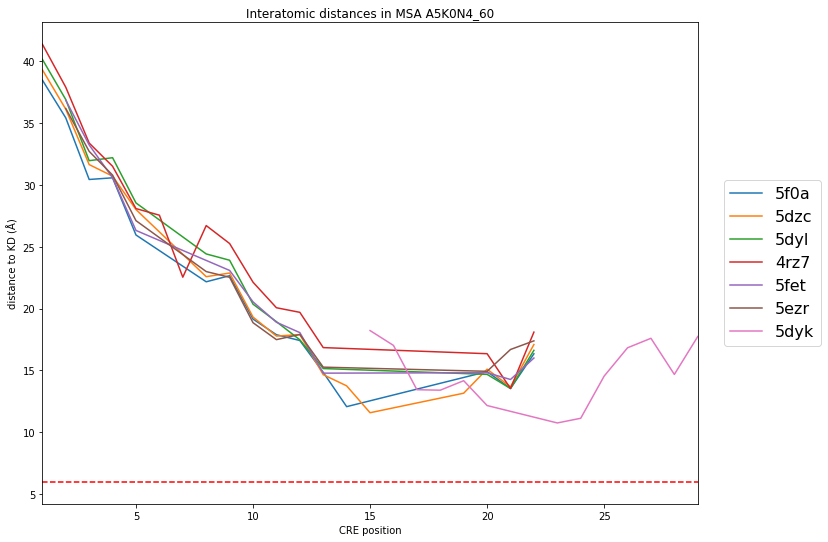

in msa: O74536_60
3h4j
interv1: [305, 351]
interv2a: [34, 285]
interv2b: [314, 351]
305 351


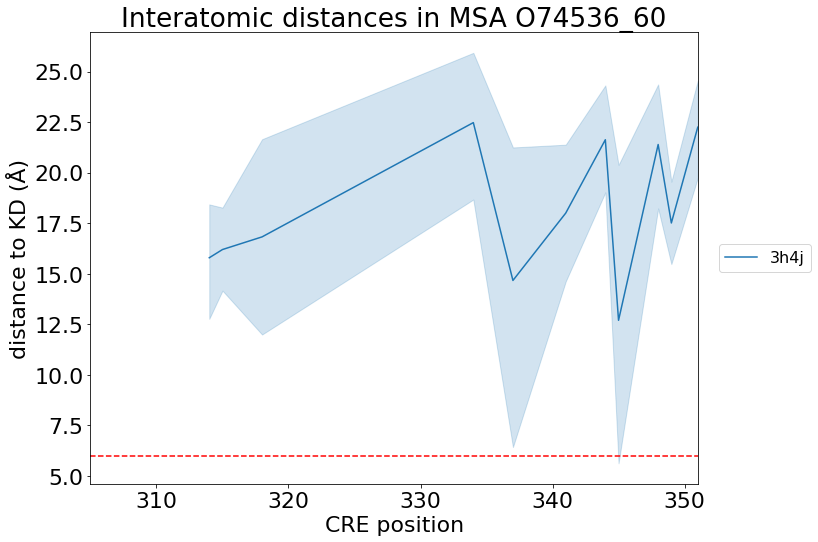

in msa: O75582_60
7up6
interv1: [701, 706]
interv2a: [426, 686]
interv2b: [701, 706]
7up8
interv1: [701, 722]
interv2a: [426, 686]
interv2b: [701, 722]
7up7
interv1: [701, 722]
interv2a: [426, 686]
interv2b: [701, 722]
7up5
interv1: [701, 722]
interv2a: [426, 686]
interv2b: [701, 722]
3kn6
interv1: [702, 723]
interv2a: [426, 687]
interv2b: [702, 723]
3kn5
interv1: [702, 723]
interv2a: [426, 687]
interv2b: [702, 723]
7up4
interv1: [701, 722]
interv2a: [426, 686]
interv2b: [701, 722]
701 723


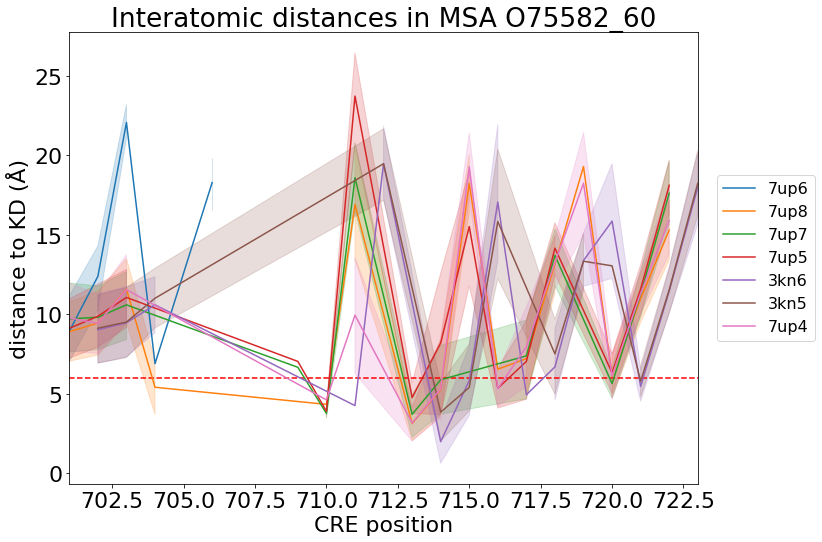

in msa: O77676_60
7lv3
interv1: [78, 86]
interv2a: [78, 93]
interv2b: [432, 623]
78 93


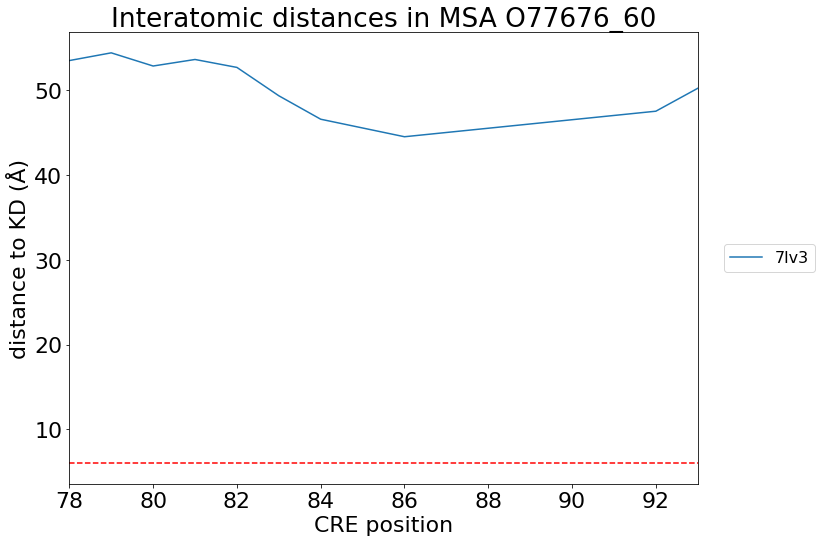

in msa: O96013_60
4fie
interv1: [49, 55]
interv2a: [49, 55]
interv2b: [331, 480]
4fif
5upk
4fii
4 55


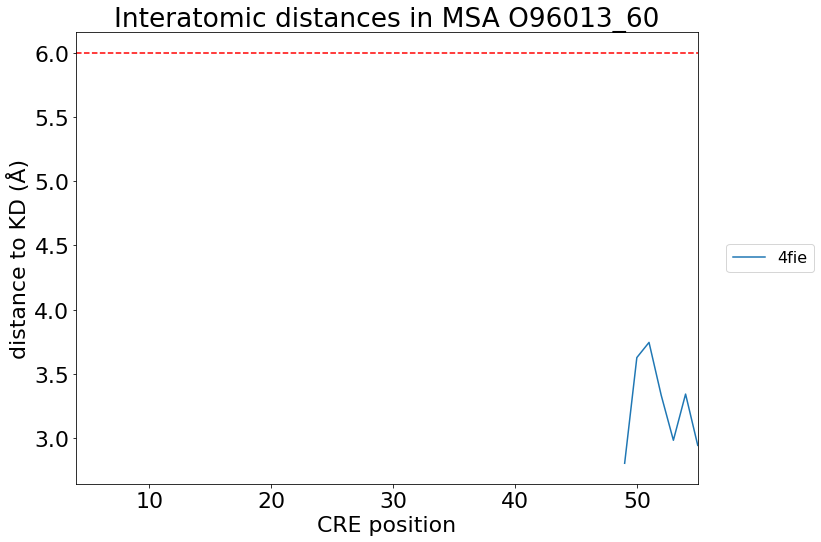

in msa: P00519_60
2g2i
2gqg
interv1: [229, 233]
interv2a: [229, 233]
interv2b: [291, 307]
5hu9
interv1: [227, 233]
interv2a: [227, 233]
interv2b: [291, 307]
3qrk
interv1: [229, 233]
interv2a: [229, 233]
interv2b: [291, 307]
2hiw
interv1: [245, 251]
interv2a: [245, 251]
interv2b: [309, 325]
6npe
interv1: [251, 252]
interv2a: [251, 252]
interv2b: [310, 326]
6npv
interv1: [251, 252]
interv2a: [251, 252]
interv2b: [310, 326]
3pyy
interv1: [251, 252]
interv2a: [251, 252]
interv2b: [310, 326]
3qrj
interv1: [234, 252]
interv2a: [234, 252]
interv2b: [242, 306]
2hyy
interv1: [235, 252]
interv2a: [235, 252]
interv2b: [242, 306]
7w7y
interv1: [232, 233]
interv2a: [232, 233]
interv2b: [291, 307]
7w7x
interv1: [232, 233]
interv2a: [232, 233]
interv2b: [291, 291]
2e2b
2g2f
6npu
interv1: [251, 252]
interv2a: [251, 252]
interv2b: [310, 326]
2g1t
3qri
interv1: [229, 233]
interv2a: [229, 233]
interv2b: [307, 307]
6xr7
interv1: [248, 252]
interv2a: [248, 252]
interv2b: [310, 326]
6xr6
interv1: [248, 252]

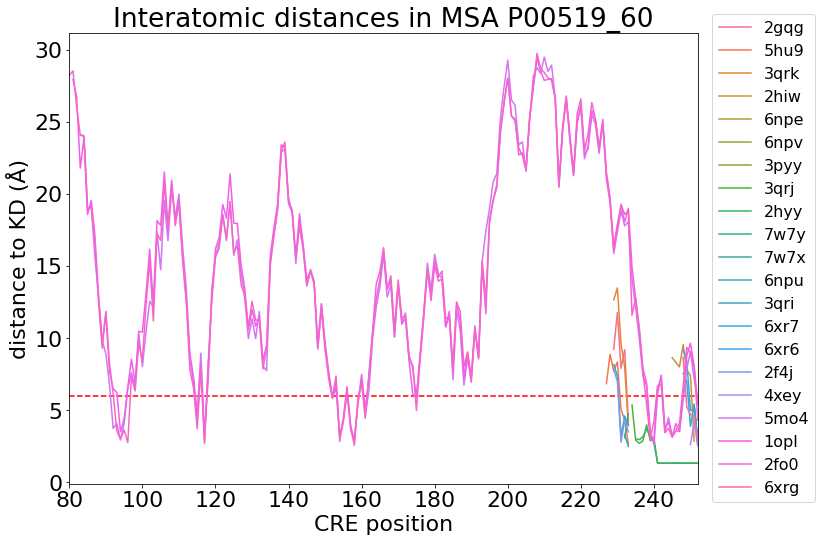

in msa: P00523_60
5d11
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
5d10
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
4lgh
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
4agw
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
3tz9
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
3tz7
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
3of0
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
3f3u
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
3g5d
3f3w
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
5d12
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
3en6
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
3en4
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
3el7
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
2qq7
interv1: [520, 533]
interv2a: [267, 520]
interv2b: [520, 533]
2qi8
interv1: [520, 533]
interv2a: [267

C:\Users\User\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:103: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 


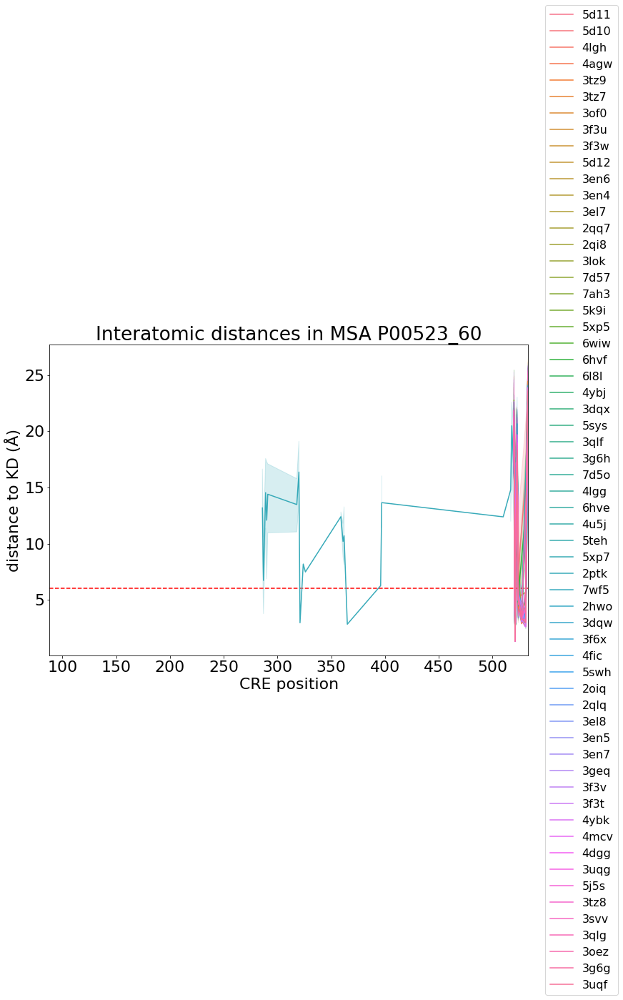

in msa: P00533_60
5cnn
interv1: [941, 974]
interv2a: [688, 955]
interv2b: [941, 974]
3gt8
5gty
interv1: [965, 998]
interv2a: [712, 979]
interv2b: [965, 998]
6wxn
interv1: [965, 998]
interv2a: [712, 979]
interv2b: [965, 998]
6tg0
interv1: [965, 985]
interv2a: [712, 979]
interv2b: [965, 982]
6tfv
interv1: [965, 985]
interv2a: [712, 979]
interv2b: [965, 982]
7tvd
6wa2
interv1: [965, 998]
interv2a: [712, 979]
interv2b: [965, 998]
5d41
interv1: [965, 998]
interv2a: [712, 979]
interv2b: [965, 998]
6tg1
interv1: [965, 984]
interv2a: [712, 979]
interv2b: [965, 984]
6duk
interv1: [965, 998]
interv2a: [712, 979]
interv2b: [965, 998]
7a2a
interv1: [965, 984]
interv2a: [712, 979]
interv2b: [965, 984]
2rf9
2jiv
interv1: [965, 984]
interv2a: [712, 979]
interv2b: [965, 984]
6tfy
interv1: [965, 982]
interv2a: [712, 979]
interv2b: [965, 981]
6z4b
7a6j
interv1: [965, 982]
interv2a: [712, 979]
interv2b: [965, 981]
5x2a
interv1: [965, 998]
interv2a: [712, 979]
interv2b: [965, 998]
6p1d
5x2c
interv1: [965,

C:\Users\User\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:103: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 


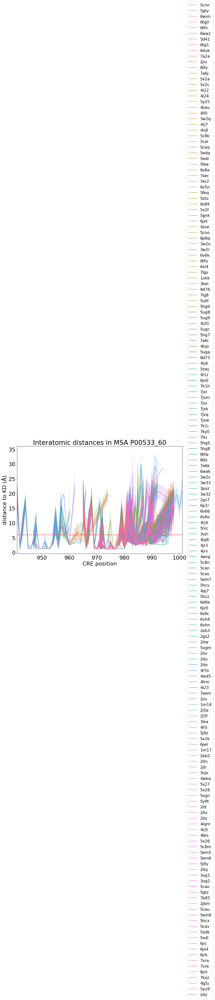

in msa: P04049_60
3omv
interv1: [340, 345]
interv2a: [340, 345]
interv2b: [398, 413]
340 345


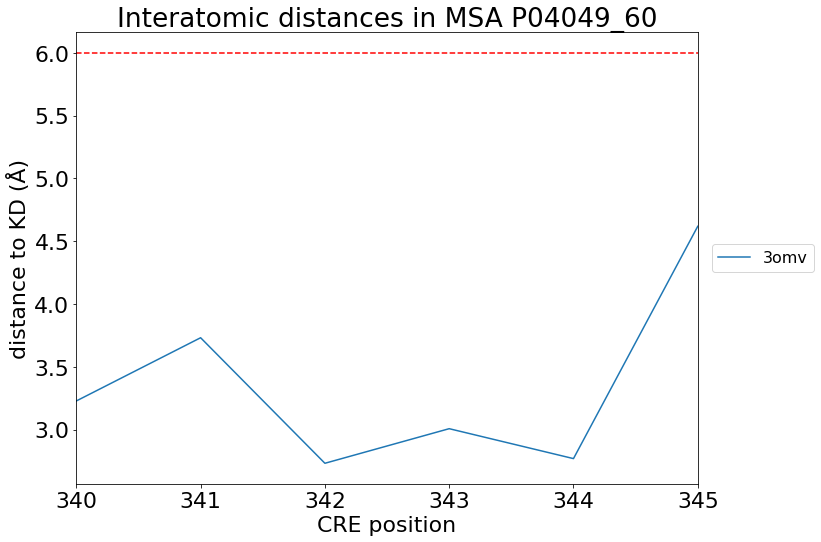

in msa: P07333_60
7tnh
interv1: [549, 574]
interv2a: [549, 574]
interv2b: [635, 796]
2i0y
interv1: [548, 574]
interv2a: [548, 574]
interv2b: [638, 835]
3dpk
interv1: [548, 574]
interv2a: [548, 574]
interv2b: [636, 796]
6ig8
interv1: [550, 574]
interv2a: [550, 574]
interv2b: [632, 775]
4r7i
interv1: [567, 574]
interv2a: [567, 574]
interv2b: [632, 655]
3lcd
6wxj
interv1: [559, 574]
interv2a: [559, 574]
interv2b: [635, 902]
6n33
interv1: [566, 574]
interv2a: [566, 574]
interv2b: [635, 655]
4hw7
interv1: [566, 574]
interv2a: [566, 574]
interv2b: [628, 655]
7mfc
interv1: [567, 574]
interv2a: [567, 574]
interv2b: [635, 655]
6t2w
interv1: [547, 574]
interv2a: [547, 574]
interv2b: [632, 803]
3lco
interv1: [551, 574]
interv2a: [551, 574]
interv2b: [634, 832]
3bea
interv1: [547, 574]
interv2a: [547, 574]
interv2b: [635, 796]
4r7h
interv1: [544, 574]
interv2a: [544, 574]
interv2b: [625, 833]
3krl
interv1: [545, 574]
interv2a: [545, 574]
interv2b: [593, 809]
3krj
interv1: [544, 574]
interv2a: [544

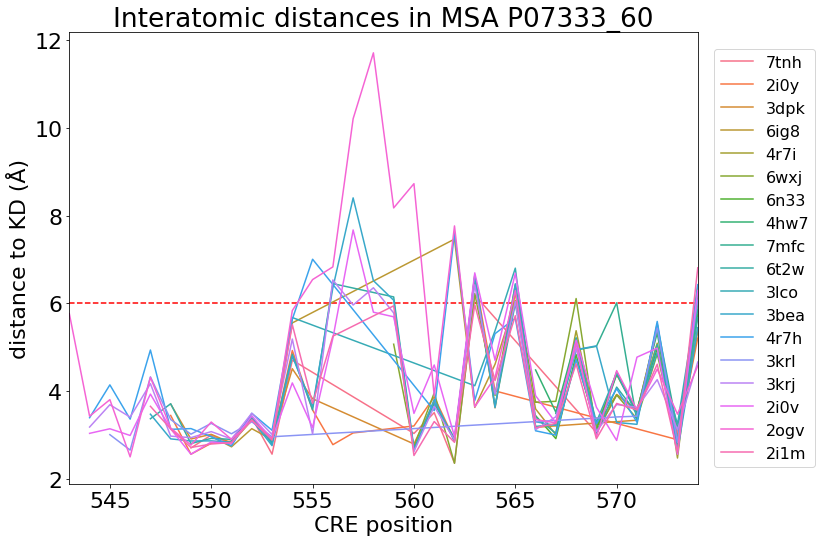

in msa: P10721_60
6hh1
interv1: [565, 591]
interv2a: [565, 591]
interv2b: [589, 849]
6xv9
interv1: [570, 591]
interv2a: [570, 591]
interv2b: [589, 789]
7khj
interv1: [570, 591]
interv2a: [570, 591]
interv2b: [589, 819]
7khk
interv1: [570, 591]
interv2a: [570, 591]
interv2b: [589, 819]
1pkg
interv1: [567, 591]
interv2a: [567, 591]
interv2b: [589, 819]
6gqj
interv1: [570, 591]
interv2a: [570, 591]
interv2b: [589, 789]
6mob
6gql
interv1: [570, 591]
interv2a: [570, 591]
interv2b: [589, 848]
6itv
interv1: [569, 591]
interv2a: [569, 591]
interv2b: [589, 849]
6gqm
interv1: [570, 591]
interv2a: [570, 591]
interv2b: [589, 847]
6xva
interv1: [570, 591]
interv2a: [570, 591]
interv2b: [589, 847]
6xvb
4u0i
interv1: [565, 591]
interv2a: [565, 591]
interv2b: [589, 848]
1t46
interv1: [565, 591]
interv2a: [565, 591]
interv2b: [589, 849]
6gqk
interv1: [570, 591]
interv2a: [570, 591]
interv2b: [589, 789]
6itt
interv1: [563, 591]
interv2a: [563, 591]
interv2b: [589, 918]
6kla
interv1: [554, 591]
interv2a:

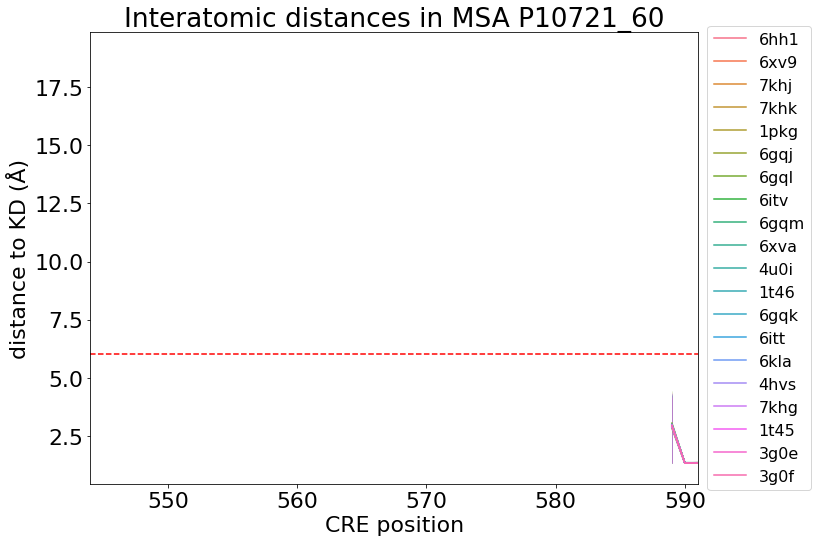

in msa: P28482_60
6qal
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
6qaq
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
6qaw
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
7auv
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
7e73
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
6g9m
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
4fv1
interv1: [171, 194]
interv2a: [23, 194]
interv2b: [171, 195]
6qah
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
6q7s
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
6q7t
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
7nqq
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
7nqw
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
7nr5
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
6qag
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [173, 197]
6g9k
interv1: [173, 196]
interv2a: [25, 196]
interv2b: [17

C:\Users\User\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:103: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 


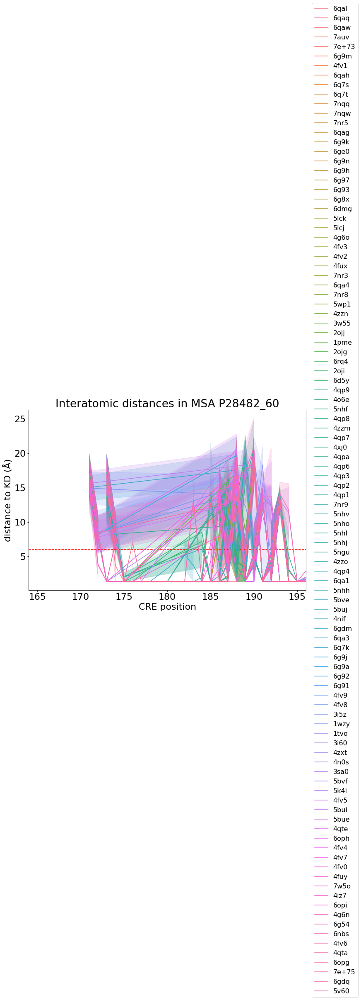

in msa: P29323_60
3zfm
interv1: [615, 621]
interv2a: [615, 621]
interv2b: [621, 688]
615 621


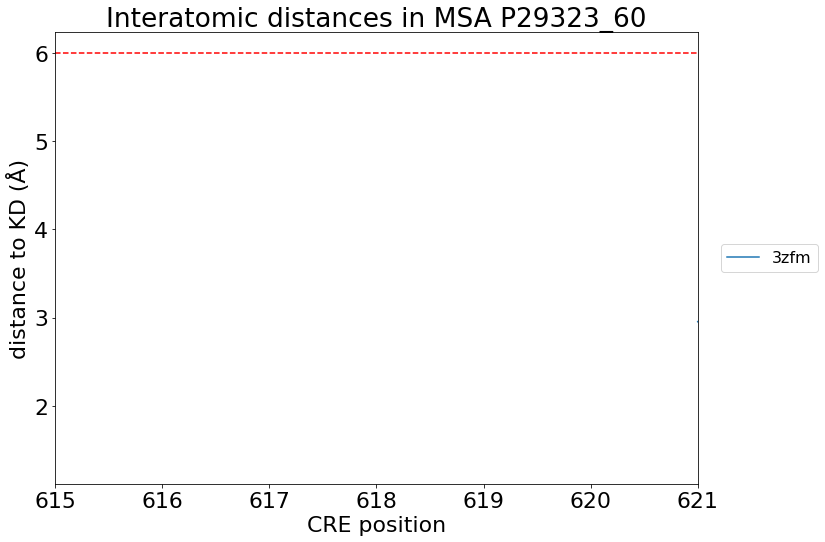

in msa: P31749_60
5kcv
interv1: [17, 149]
interv2a: [17, 149]
interv2b: [150, 358]
3qkk
6npz
3cqu
3cqw
3ocb
3ow4
4gv1
interv1: [144, 149]
interv2a: [144, 149]
interv2b: [150, 215]
3qkm
interv1: [144, 149]
interv2a: [144, 149]
interv2b: [150, 218]
6buu
3mv5
4ekk
6ccy
interv1: [142, 149]
interv2a: [142, 149]
interv2b: [150, 217]
3mvh
4ejn
interv1: [17, 149]
interv2a: [17, 149]
interv2b: [150, 358]
3qkl
7nh4
interv1: [17, 149]
interv2a: [17, 149]
interv2b: [150, 389]
4ekl
interv1: [144, 149]
interv2a: [144, 149]
interv2b: [150, 217]
6hhf
interv1: [17, 149]
interv2a: [17, 149]
interv2b: [150, 326]
6s9x
interv1: [17, 149]
interv2a: [17, 149]
interv2b: [150, 389]
7nh5
interv1: [17, 149]
interv2a: [17, 149]
interv2b: [150, 389]
6s9w
interv1: [17, 149]
interv2a: [17, 149]
interv2b: [150, 396]
6hhj
interv1: [17, 149]
interv2a: [17, 149]
interv2b: [150, 396]
6hhi
interv1: [17, 149]
interv2a: [17, 149]
interv2b: [150, 389]
6hhg
interv1: [17, 149]
interv2a: [17, 149]
interv2b: [150, 328]
3o96
inte

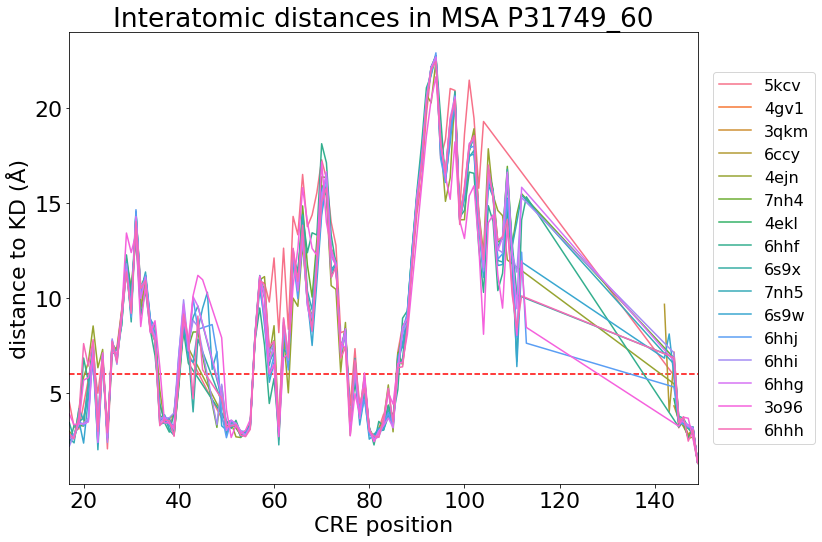

in msa: P31751_60
1o6l
2jdr
2uw9
2x39
1mry
interv1: [146, 151]
interv2a: [146, 151]
interv2b: [152, 226]
1gzo
interv1: [146, 151]
interv2a: [146, 151]
interv2b: [152, 219]
1gzk
interv1: [146, 151]
interv2a: [146, 151]
interv2b: [152, 219]
2xh5
1mrv
interv1: [147, 151]
interv2a: [147, 151]
interv2b: [152, 217]
1gzn
interv1: [146, 151]
interv2a: [146, 151]
interv2b: [152, 226]
1o6k
2jdo
3e88
3e87
3d0e
interv1: [146, 151]
interv2a: [146, 151]
interv2b: [152, 220]
3e8d
146 151


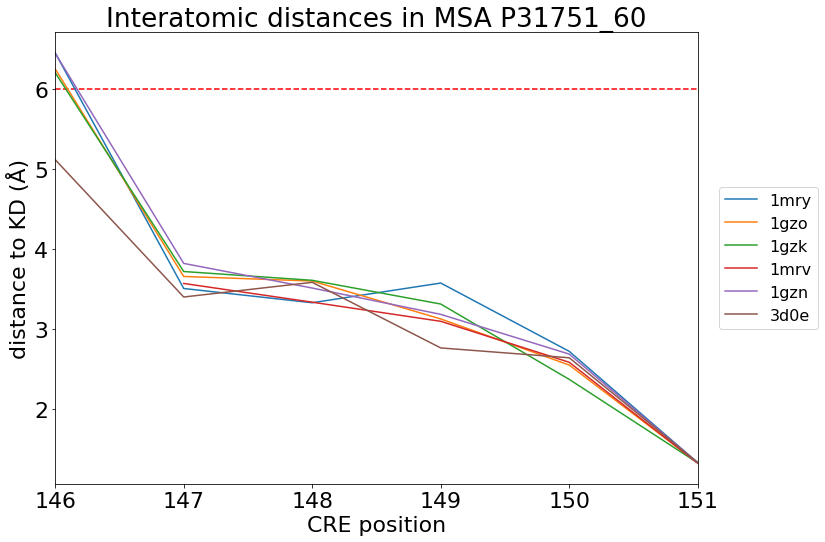

in msa: P35968_60
2oh4
interv1: [1161, 1169]
interv2a: [832, 1160]
interv2b: [1161, 1165]
2qu5
interv1: [1163, 1170]
interv2a: [834, 1162]
interv2b: [1163, 1170]
2xir
interv1: [1163, 1168]
interv2a: [834, 1162]
interv2b: [1163, 1167]
3cjg
interv1: [1161, 1166]
interv2a: [832, 1160]
interv2b: [1161, 1165]
4ag8
interv1: [1163, 1168]
interv2a: [834, 1162]
interv2b: [1163, 1167]
2p2i
interv1: [1163, 1178]
interv2a: [834, 1162]
interv2b: [1163, 1178]
2qu6
interv1: [1163, 1178]
interv2a: [834, 1162]
interv2b: [1163, 1178]
3cp9
interv1: [1163, 1178]
interv2a: [834, 1162]
interv2b: [1163, 1178]
3efl
interv1: [1163, 1178]
interv2a: [834, 1162]
interv2b: [1163, 1178]
3cjf
interv1: [1161, 1166]
interv2a: [832, 1160]
interv2b: [1161, 1166]
3b8q
interv1: [1163, 1178]
interv2a: [834, 1162]
interv2b: [1163, 1178]
3dtw
interv1: [1163, 1178]
interv2a: [834, 1162]
interv2b: [1163, 1178]
3c7q
interv1: [1163, 1171]
interv2a: [834, 1162]
interv2b: [1163, 1167]
3cpb
6xvk
interv1: [1163, 1168]
interv2a: [834

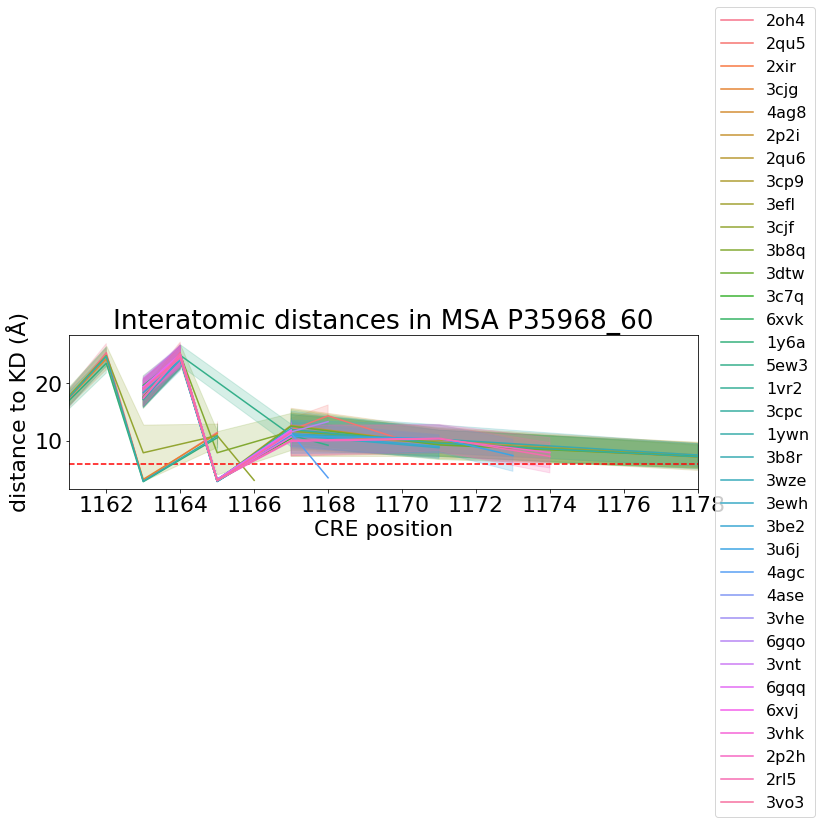

in msa: P36507_60
1s9i
interv1: [75, 102]
interv2a: [72, 102]
interv2b: [75, 103]
75 102


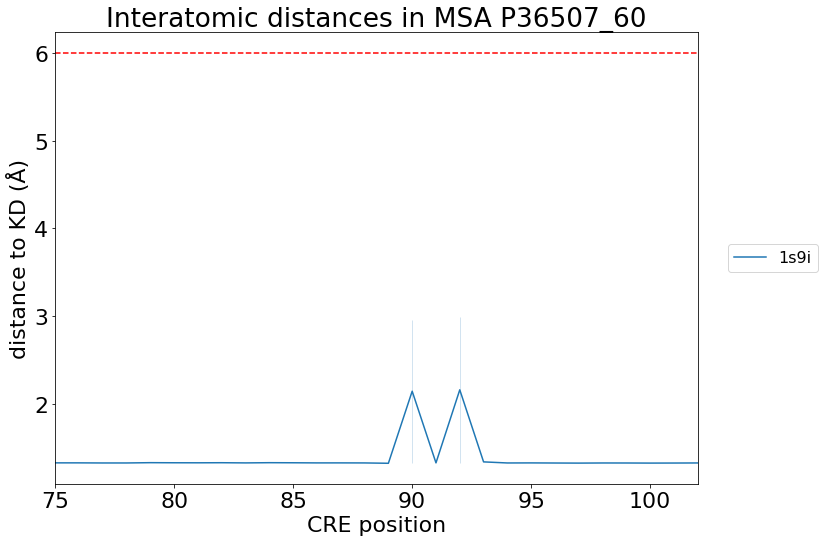

in msa: P36888_60
1rjb
5x02
interv1: [573, 602]
interv2a: [573, 602]
interv2b: [660, 868]
4rt7
interv1: [599, 602]
interv2a: [599, 602]
interv2b: [662, 683]
6jqr
interv1: [571, 602]
interv2a: [571, 602]
interv2b: [654, 930]
6il3
interv1: [569, 602]
interv2a: [569, 602]
interv2b: [654, 930]
4xuf
interv1: [600, 602]
interv2a: [600, 602]
interv2b: [662, 679]
569 602


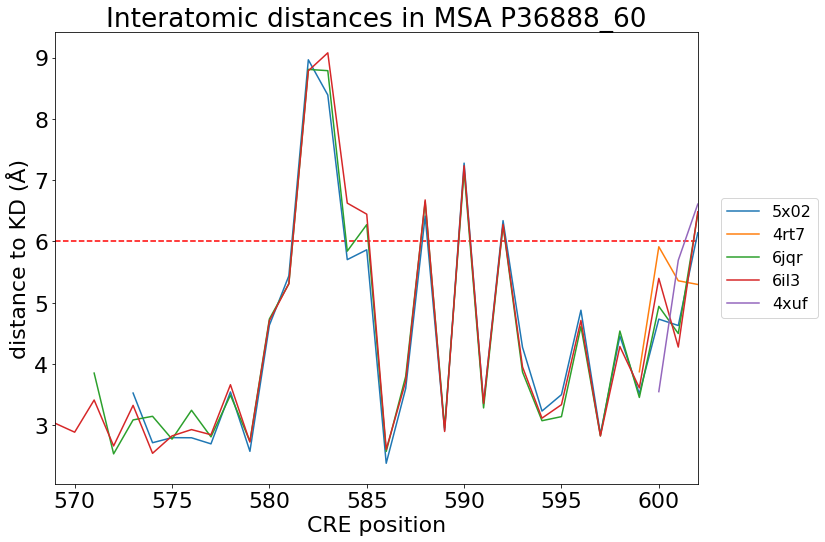

in msa: P43403_60
2ozo
interv1: [126, 155]
interv2a: [126, 155]
interv2b: [395, 598]
1u59
interv1: [328, 337]
interv2a: [328, 337]
interv2b: [338, 408]
4k2r
interv1: [126, 155]
interv2a: [126, 155]
interv2b: [394, 600]
126 337


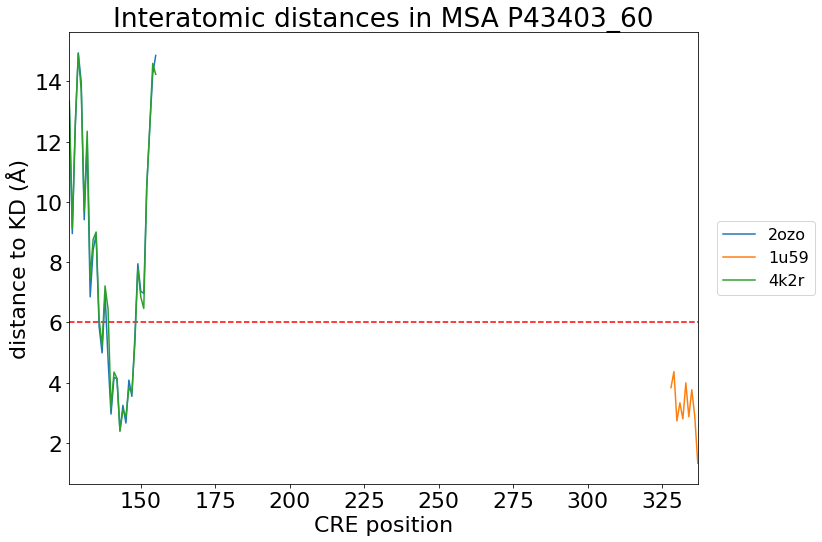

in msa: P45985_60
3vut
interv1: [142, 337]
interv2a: [142, 337]
interv2b: [143, 338]
3alo
3aln
interv1: [109, 136]
interv2a: [102, 136]
interv2b: [109, 137]
109 337


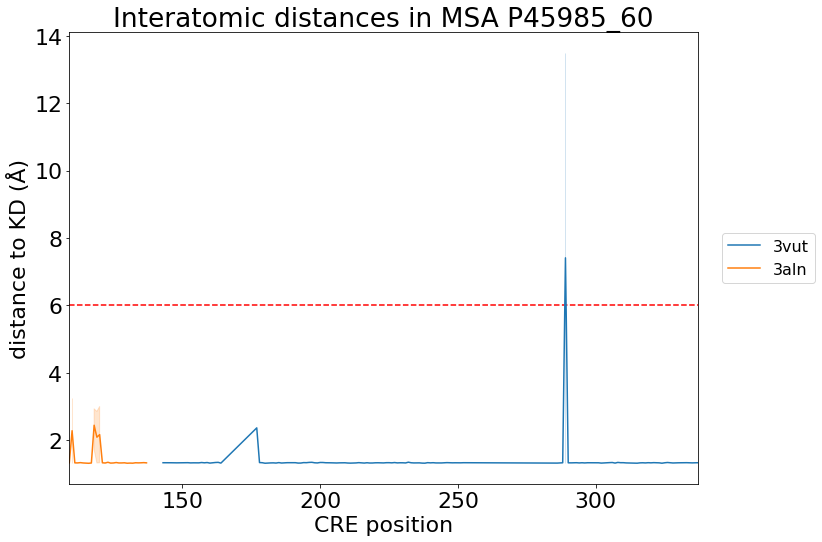

in msa: P49137_60
1ny3
interv1: [339, 345]
interv2a: [64, 325]
interv2b: [339, 345]
3wi6
interv1: [339, 347]
interv2a: [64, 325]
interv2b: [339, 347]
3gok
interv1: [339, 350]
interv2a: [64, 325]
interv2b: [339, 350]
3fyk
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
3fyj
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
2p3g
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
3r30
interv1: [339, 345]
interv2a: [64, 325]
interv2b: [339, 345]
2onl
3kga
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
3m2w
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
7nry
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
3m42
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
3a2c
interv1: [339, 344]
interv2a: [64, 325]
interv2b: [339, 345]
3r2b
4tyh
6tca
2oza
3ka0
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
3fpm
interv1: [339, 345]
interv2a: [64, 325]
interv2b: [339, 345]
3r2y
interv1: [339, 345]
interv2a

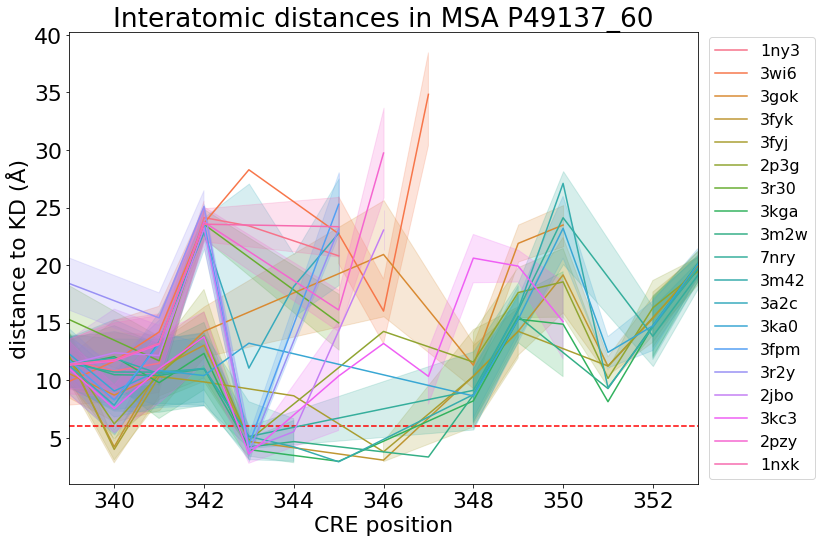

in msa: P49138_60
2p3g
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
2oza
6tca
4tyh
3r2b
3a2c
interv1: [339, 344]
interv2a: [64, 325]
interv2b: [339, 345]
3m42
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
3m2w
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
3ka0
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
3r30
interv1: [339, 345]
interv2a: [64, 325]
interv2b: [339, 345]
1nxk
interv1: [339, 345]
interv2a: [64, 325]
interv2b: [339, 345]
3r2y
interv1: [339, 345]
interv2a: [64, 325]
interv2b: [339, 345]
3kga
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
1ny3
interv1: [339, 345]
interv2a: [64, 325]
interv2b: [339, 345]
7nry
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
1kwp
3fyk
interv1: [339, 353]
interv2a: [64, 325]
interv2b: [339, 353]
2jbo
interv1: [339, 347]
interv2a: [64, 325]
interv2b: [339, 346]
2pzy
interv1: [339, 346]
interv2a: [64, 325]
interv2b: [339, 346]
2onl
2jbp
3fyj
interv1: [339, 353

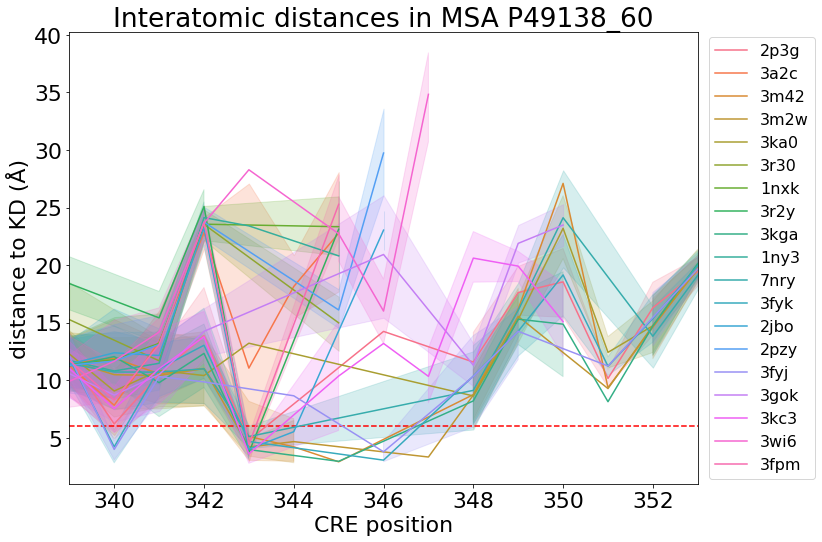

in msa: P51812_60
4jg7
interv1: [694, 711]
interv2a: [422, 679]
interv2b: [694, 711]
4jg8
interv1: [694, 711]
interv2a: [422, 679]
interv2b: [694, 711]
4d9t
interv1: [694, 711]
interv2a: [422, 679]
interv2b: [694, 711]
4d9u
interv1: [694, 711]
interv2a: [422, 679]
interv2b: [694, 711]
4jg6
interv1: [694, 711]
interv2a: [422, 679]
interv2b: [694, 711]
694 711


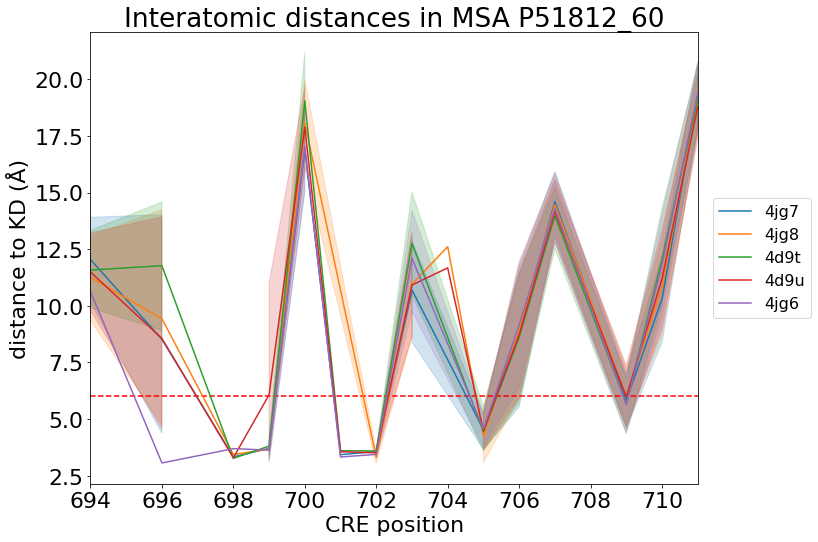

in msa: P53355_60
4tl0
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
4uv0
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 301]
2y0a
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
2xzs
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
6fha
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
6qmo
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
4b4l
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
2x0g
6fhb
2xuu
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
2w4k
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
292 301


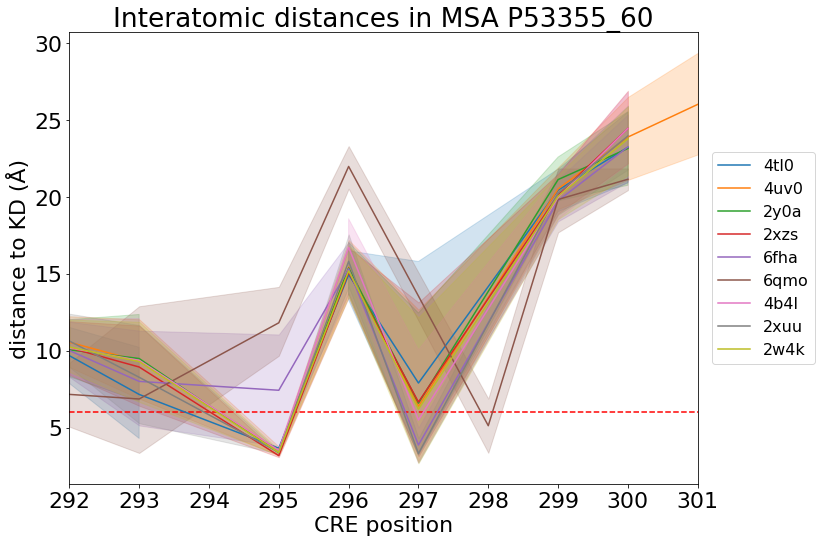

in msa: P54645_60
6c9h
5ezv
4rer
4rew
6c9j
7jij
6c9g
4cfh
4red
291

No handles with labels found to put in legend.


 372


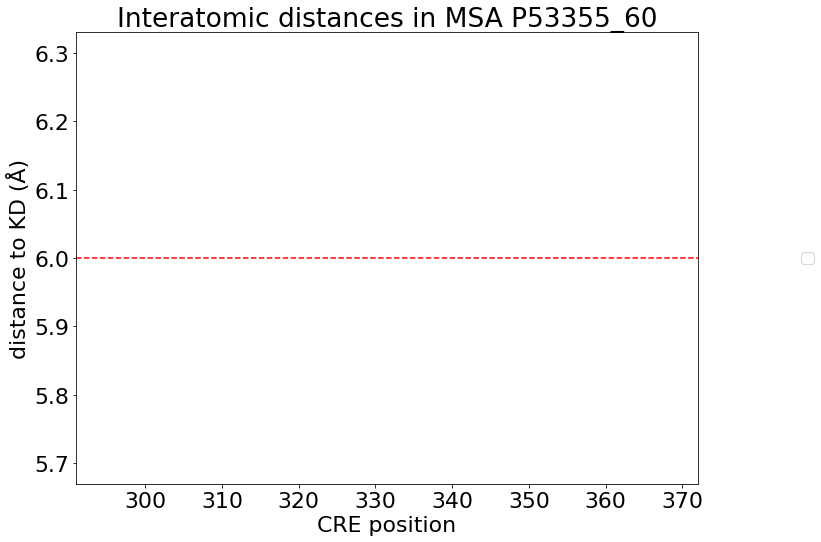

No handles with labels found to put in legend.


in msa: P54646_60
7myj
5ezv
5iso
6b1u
4cfe
4zhx
6b2e
4cff
291 376


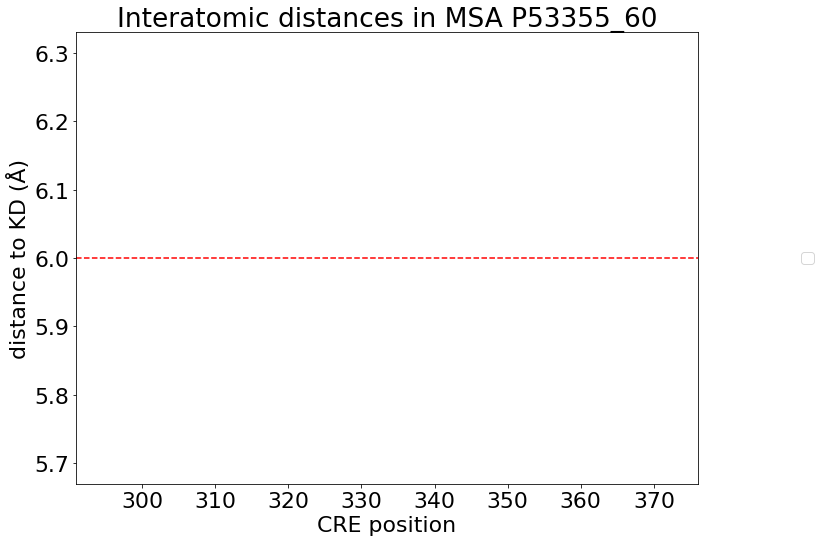

in msa: Q00944_60
6ty4
interv1: [35, 362]
interv2a: [35, 362]
interv2b: [441, 492]
2j0m
interv1: [35, 359]
interv2a: [31, 358]
interv2b: [35, 359]
2j0k
interv1: [35, 362]
interv2a: [35, 362]
interv2b: [462, 662]
6ty3
interv1: [35, 361]
interv2a: [35, 361]
interv2b: [422, 493]
2j0j
interv1: [35, 362]
interv2a: [35, 362]
interv2b: [462, 662]
35 362


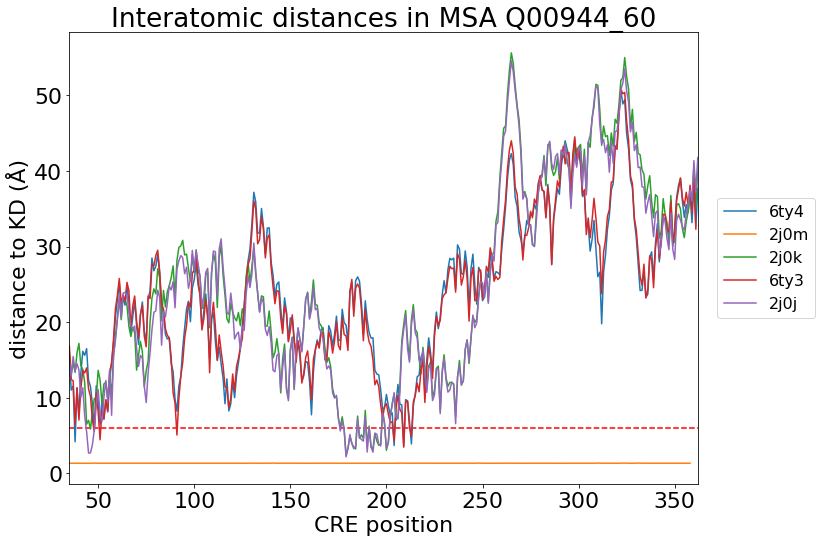

in msa: Q01974_60
4gt4
interv1: [633, 646]
interv2a: [473, 646]
interv2b: [633, 647]
3zzw
interv1: [633, 646]
interv2a: [473, 646]
interv2b: [633, 647]
633 646


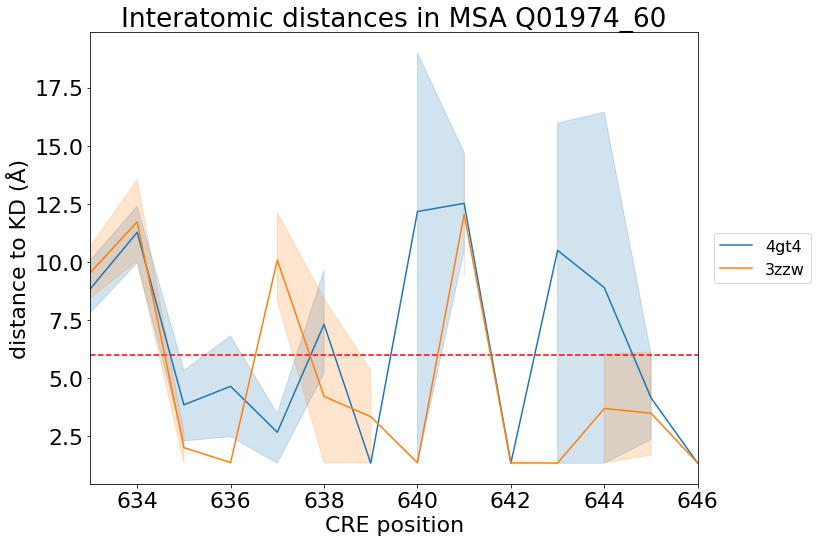

in msa: Q02750_60
5yt3
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
6pp9
7b9l
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
7m0t
5eym
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
3eqd
7b94
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
3zm4
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
3eqi
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
3zly
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
7b7r
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
7m0x
7b3m
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
3zls
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
6v2w
3zlw
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
7pqv
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
3zlx
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
3eqh
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 103]
3eqc
interv1: [75, 102]
interv2a: [68, 102]
interv2b: [75, 10

C:\Users\User\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:103: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 


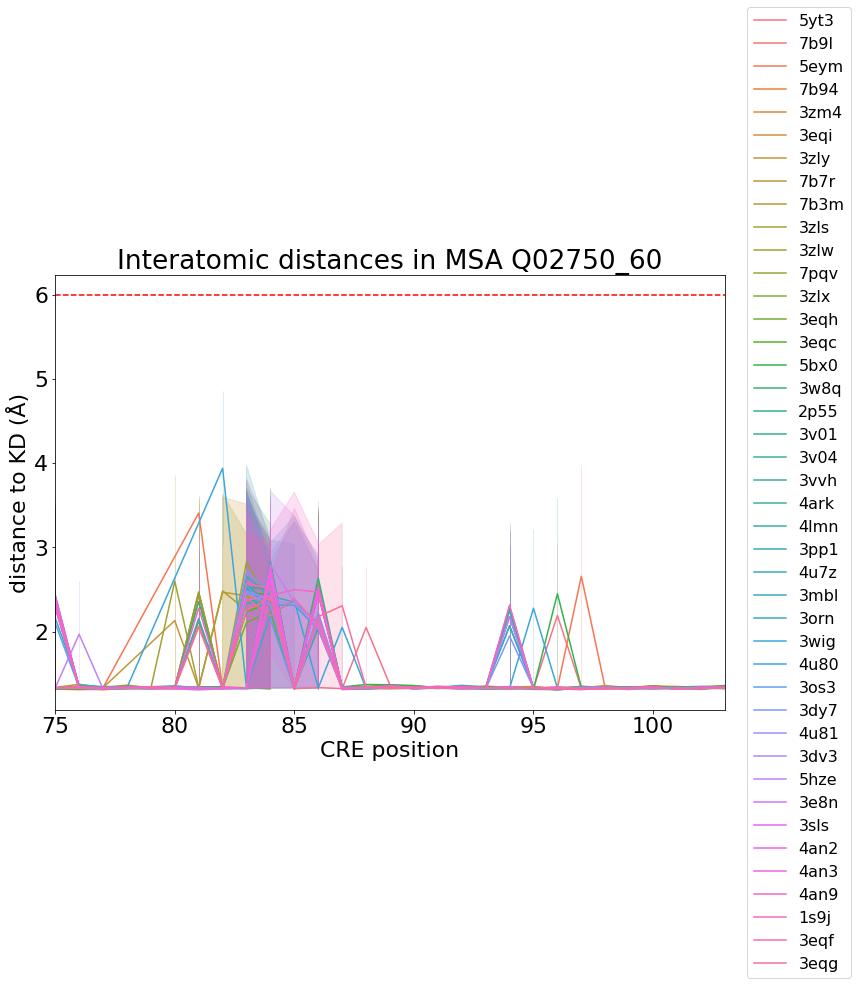

in msa: Q08E52_60
1f3m
interv1: [83, 147]
interv2a: [78, 146]
interv2b: [83, 147]
83 147


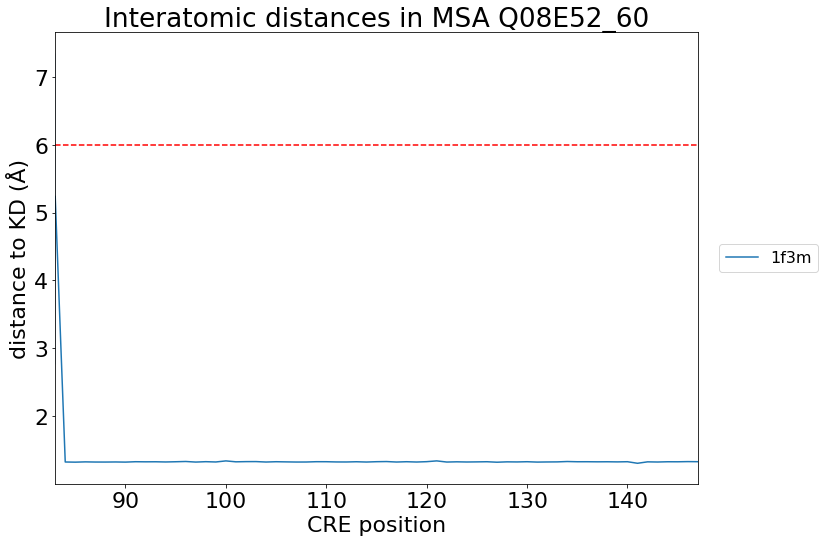

No handles with labels found to put in legend.


in msa: Q09137_60
5ezv
6b2e
5iso
4zhx
4cff
4cfe
6b1u
7myj
291 376


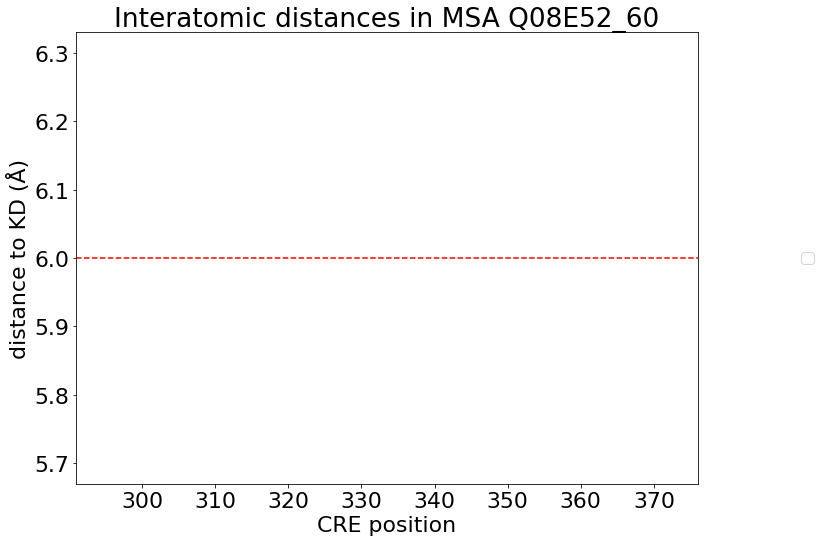

in msa: Q13043_60
6yat
interv1: [282, 308]
interv2a: [30, 281]
interv2b: [282, 305]
8a5j
interv1: [381, 408]
interv2a: [129, 380]
interv2b: [381, 404]
3com
interv1: [282, 298]
interv2a: [30, 281]
interv2b: [282, 298]
282 408


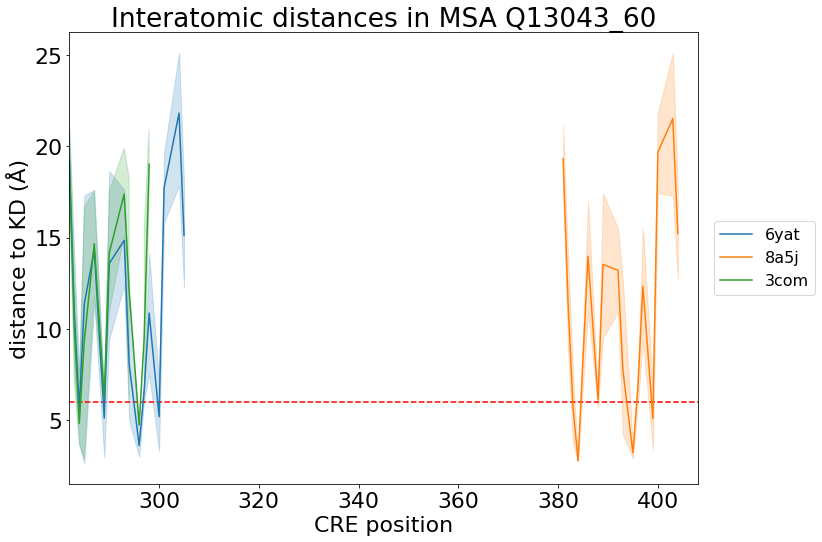

No handles with labels found to put in legend.


in msa: Q13131_60
4cfh
5ezv
4rer
4rew
7jij
6c9g
6c9j
4red
6c9h
291 372


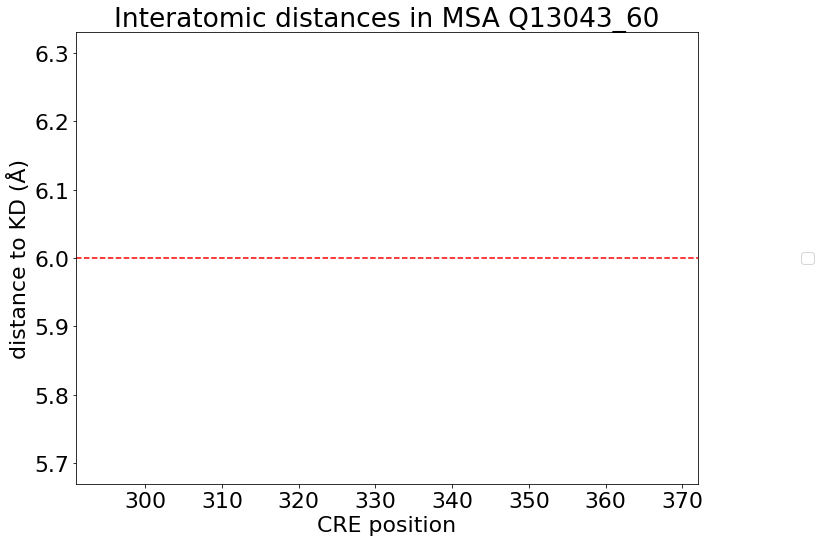

in msa: Q13153_60
1f3m
interv1: [83, 147]
interv2a: [78, 146]
interv2b: [83, 147]
83 147


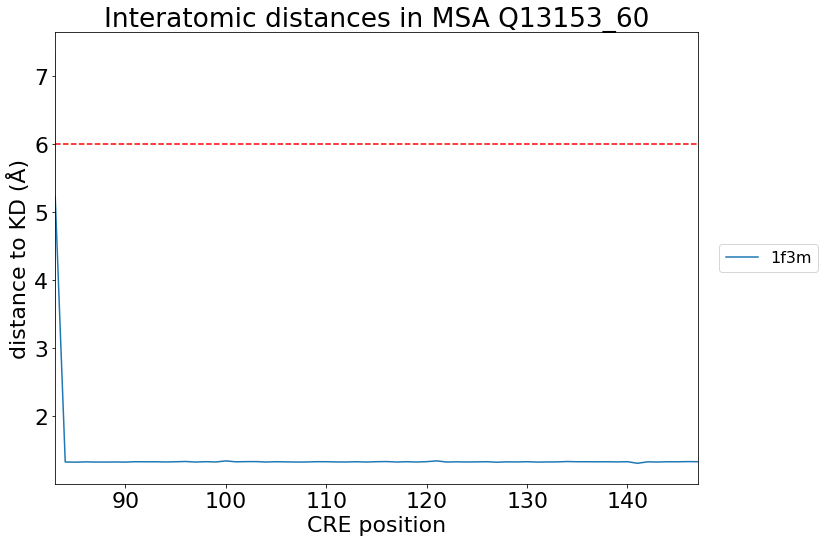

in msa: Q13188_60
6ao5
4lgd
4lg4
interv1: [279, 308]
interv2a: [27, 278]
interv2b: [279, 306]
5dh3
interv1: [279, 307]
interv2a: [27, 278]
interv2b: [279, 302]
8a66
interv1: [381, 405]
interv2a: [129, 380]
interv2b: [381, 404]
279 435


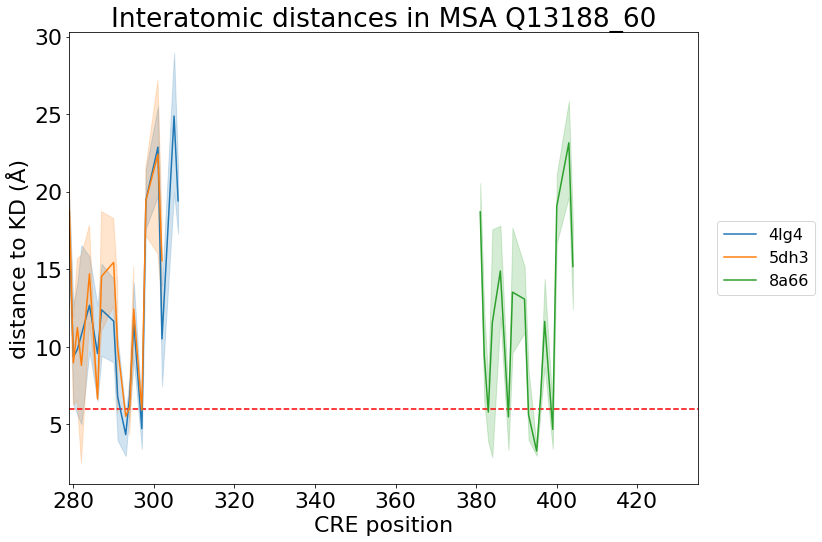

in msa: Q13554_60
3bhh
interv1: [283, 292]
interv2a: [14, 272]
interv2b: [283, 292]
283 292


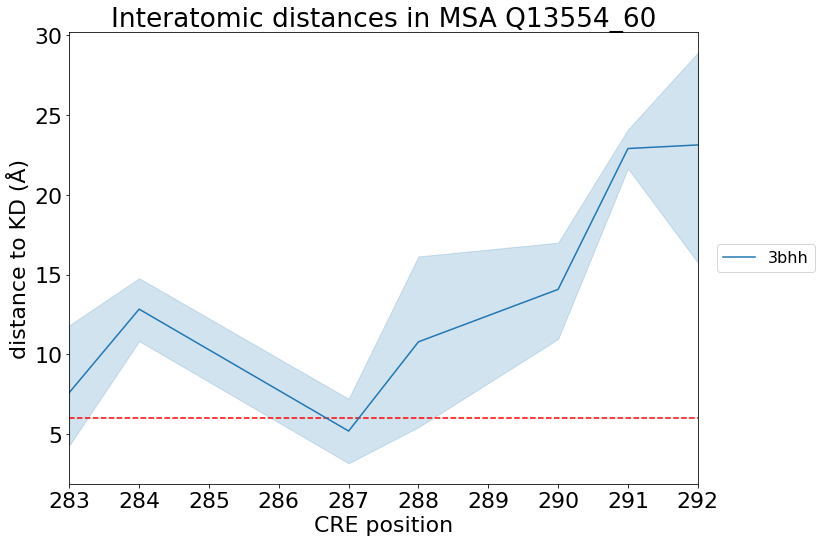

in msa: Q13555_60
2v7o
interv1: [283, 292]
interv2a: [14, 272]
interv2b: [283, 292]
283 292


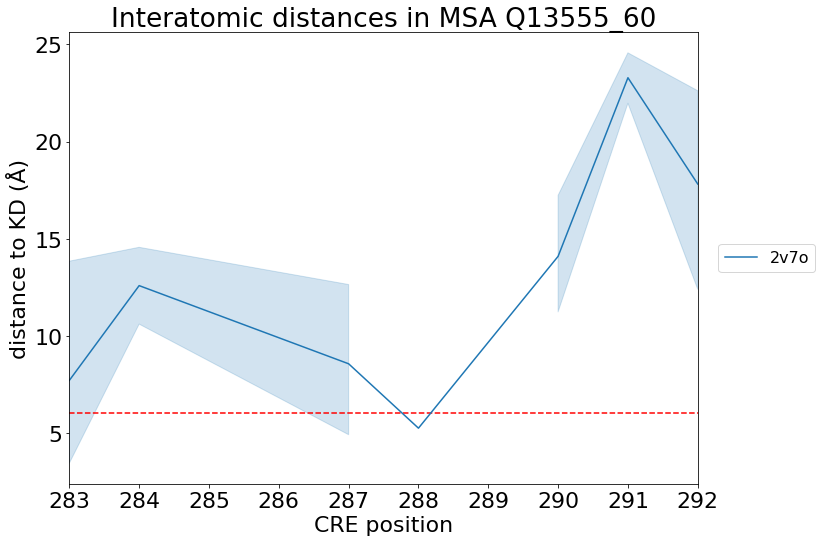

in msa: Q13557_60
6bab
5vlo
interv1: [283, 292]
interv2a: [14, 272]
interv2b: [283, 292]
6ayw
interv1: [283, 292]
interv2a: [14, 272]
interv2b: [283, 292]
2wel
2vn9
interv1: [283, 292]
interv2a: [14, 272]
interv2b: [283, 292]
283 293


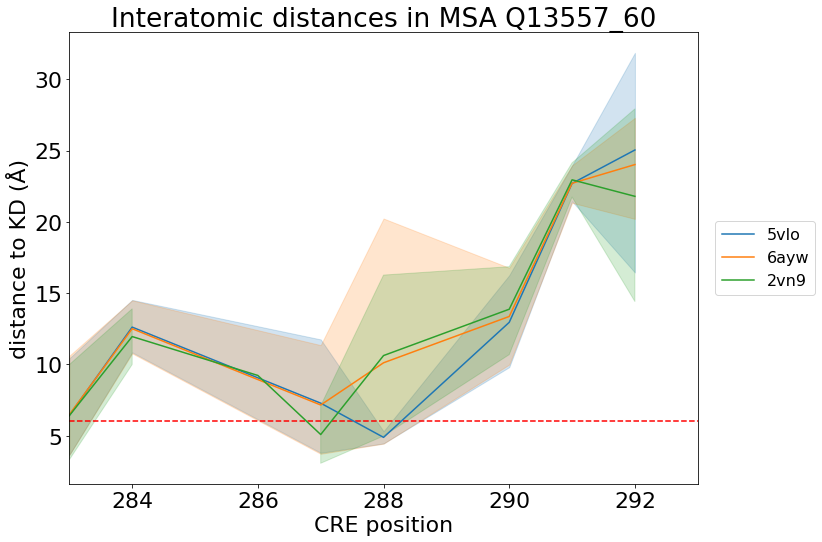

in msa: Q13976_60
7lv3
interv1: [78, 86]
interv2a: [78, 93]
interv2b: [432, 623]
78 93


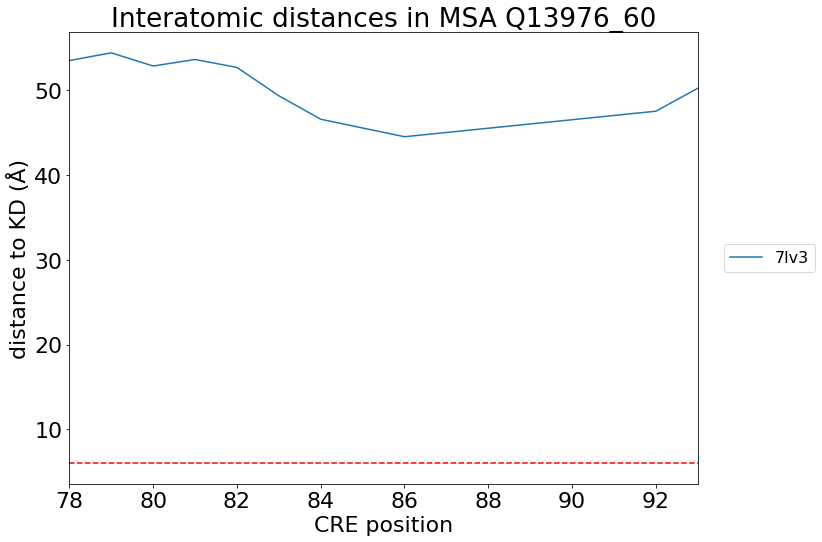

in msa: Q14012_60
4fgb
4fg8
interv1: [276, 299]
interv2a: [20, 276]
interv2b: [276, 299]
4fg9
interv1: [276, 314]
interv2a: [20, 276]
interv2b: [276, 312]
4fg7
interv1: [276, 277]
interv2a: [20, 276]
interv2b: [276, 277]
276 314


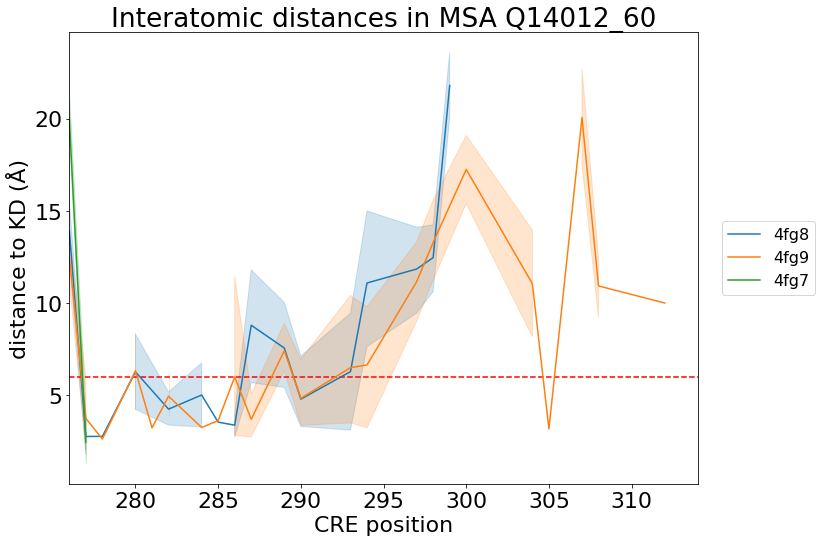

in msa: Q14680_60
5twy
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 333]
5mai
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 333]
5mah
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 333]
5maf
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 333]
5twu
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 335]
5tx3
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 333]
4d2p
4d2t
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 333]
4d2v
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 333]
4d2w
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 333]
4ump
6vxr
interv1: [326, 332]
interv2a: [11, 263]
interv2b: [326, 332]
4ixp
4bkz
interv1: [326, 334]
interv2a: [11, 263]
interv2b: [326, 333]
5tvt
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 333]
6gvx
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 333]
5m5a
interv1: [326, 333]
interv2a: [11, 263]
interv2b: [326, 333]
4umr
interv1: [326, 333]
interv2a: [11, 263

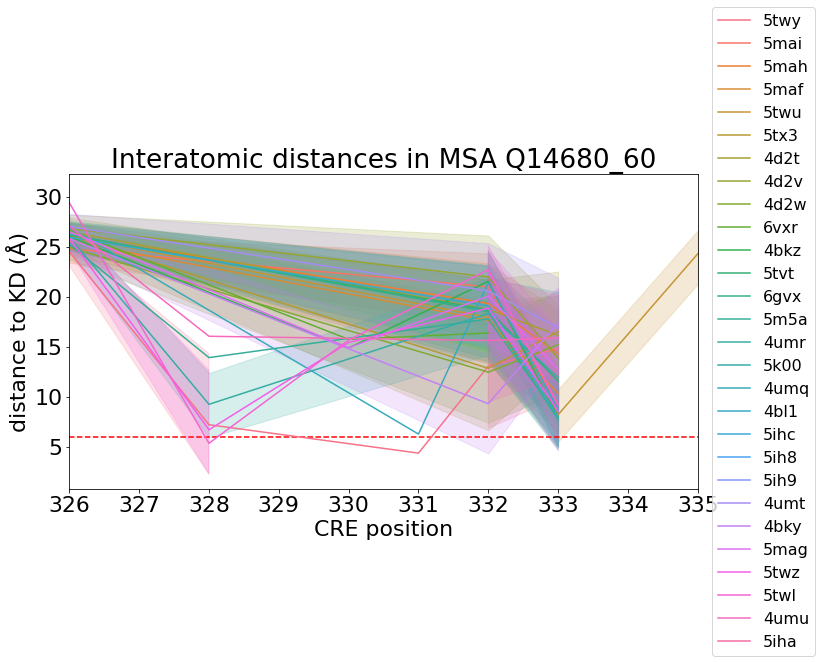

in msa: Q15418_60
3rny
interv1: [687, 706]
interv2a: [418, 675]
interv2b: [687, 706]
2wnt
interv1: [687, 706]
interv2a: [418, 675]
interv2b: [687, 706]
4nif
interv1: [173, 196]
interv2a: [25, 675]
interv2b: [173, 706]
687 706


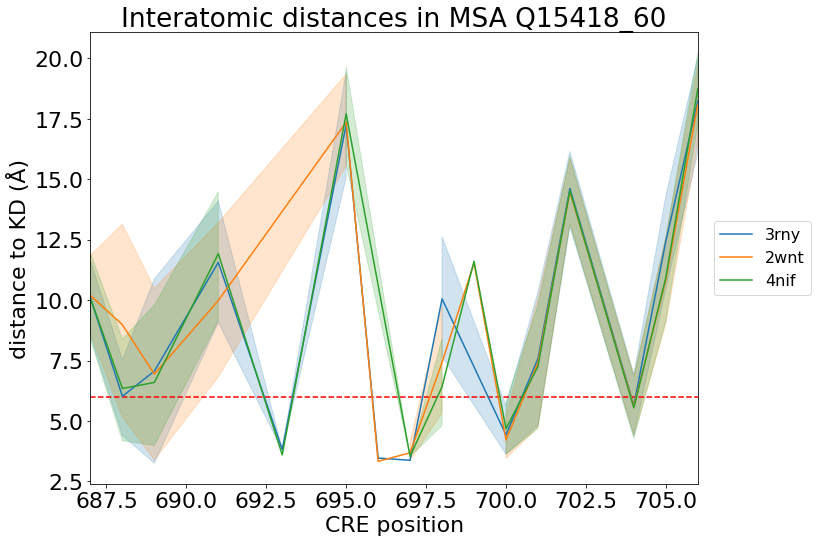

in msa: Q16566_60
2w4o
interv1: [305, 321]
interv2a: [46, 300]
interv2b: [305, 321]
305 321


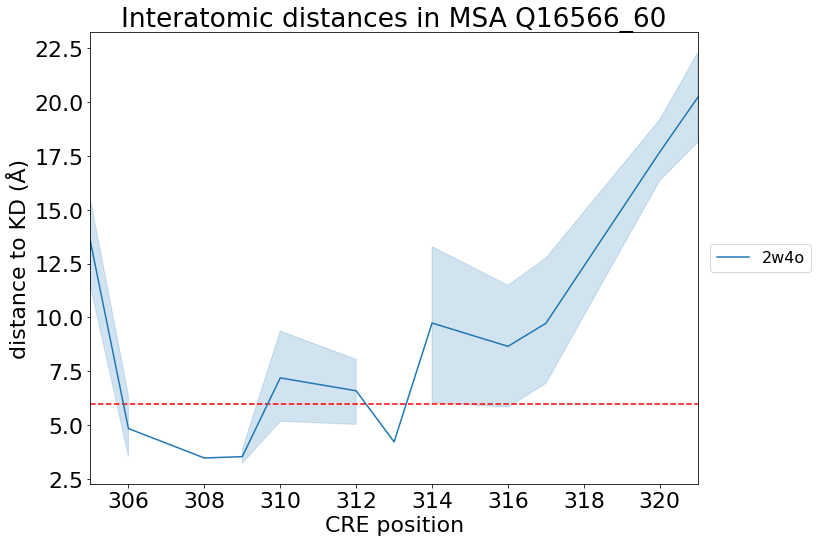

in msa: Q16644_60
3fhr
interv1: [344, 349]
interv2a: [44, 304]
interv2b: [344, 349]
3she
interv1: [344, 348]
interv2a: [44, 304]
interv2b: [344, 348]
3r1n
interv1: [344, 348]
interv2a: [44, 304]
interv2b: [344, 348]
7nrb
3fxw
interv1: [344, 349]
interv2a: [44, 304]
interv2b: [344, 349]
344 349


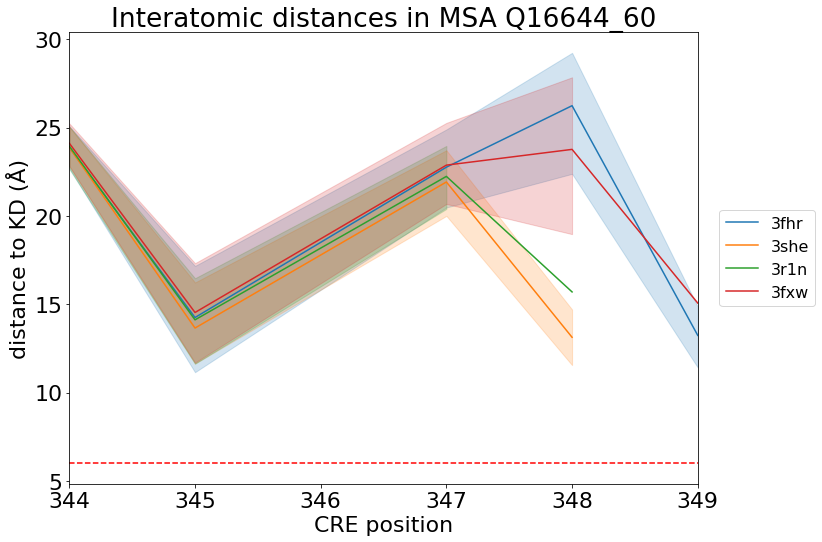

in msa: Q61846_60
4cqg
interv1: [326, 331]
interv2a: [11, 263]
interv2b: [326, 330]
4bfm
interv1: [326, 331]
interv2a: [11, 263]
interv2b: [326, 330]
326 331


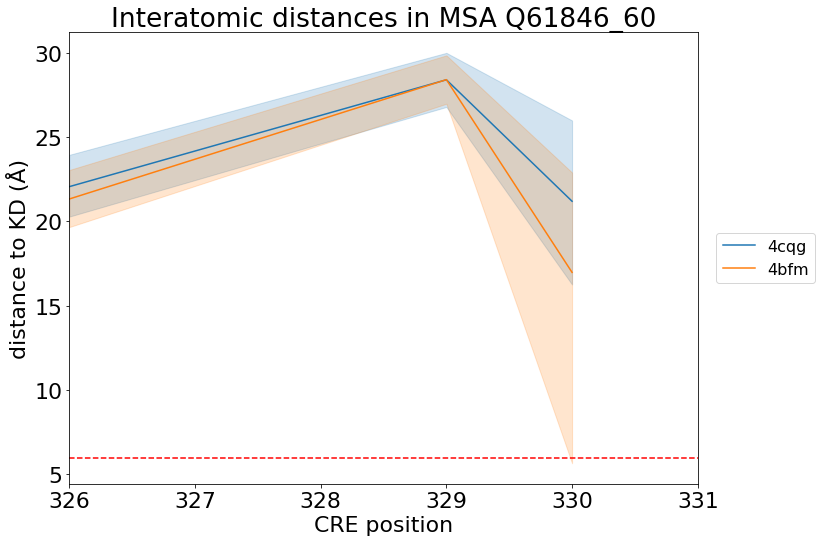

in msa: Q63450_60
1a06
interv1: [285, 312]
interv2a: [20, 276]
interv2b: [285, 312]
285 312


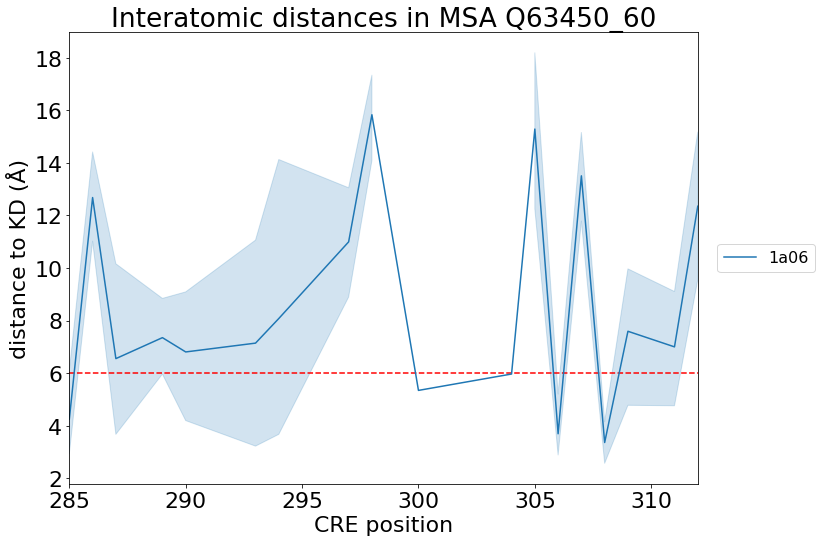

in msa: Q6PHZ2_60
6bab


No handles with labels found to put in legend.


284 293


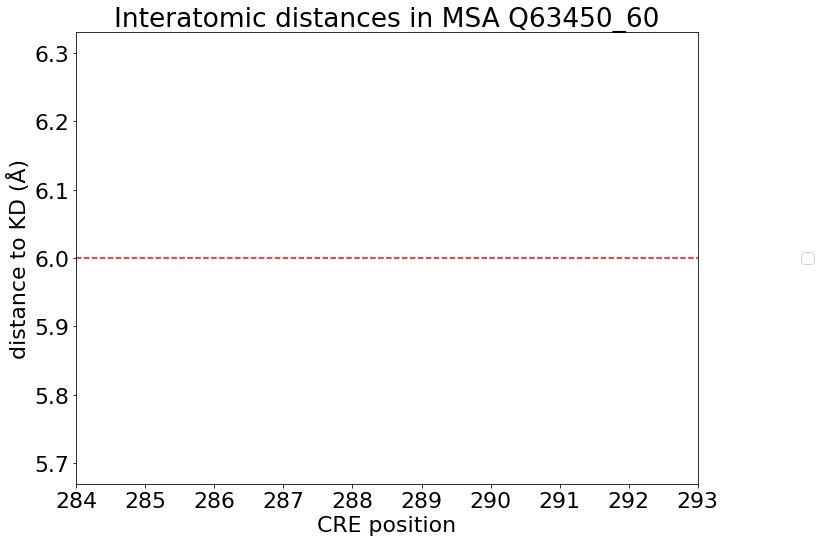

in msa: Q80YE7_60
2w4k
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
4b4l
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
4tl0
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
2x0g
2y0a
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
4uv0
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 301]
2xzs
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
6fha
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
6qmo
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
6fhb
2xuu
interv1: [292, 301]
interv2a: [13, 275]
interv2b: [292, 300]
292 301


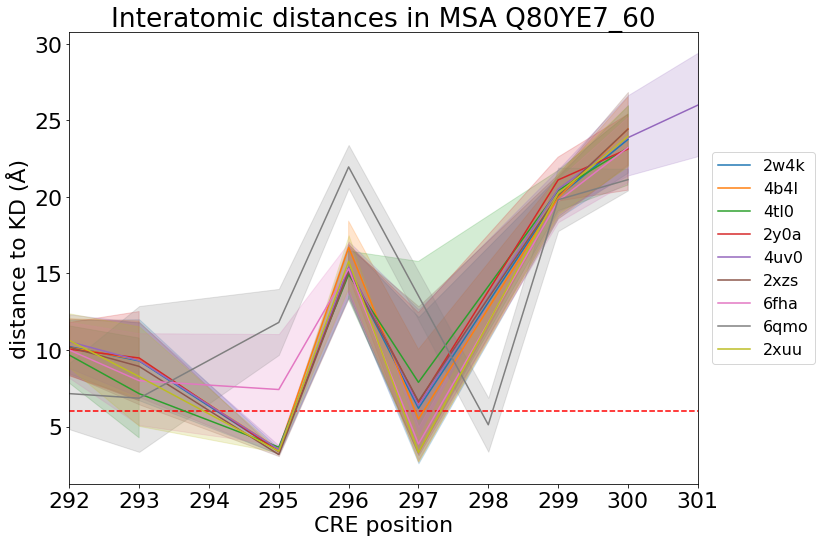

No handles with labels found to put in legend.


in msa: Q8BRK8_60
4cfe
4cff
4zhx
5iso
6b2e
5ezv
6b1u
7myj
291 376


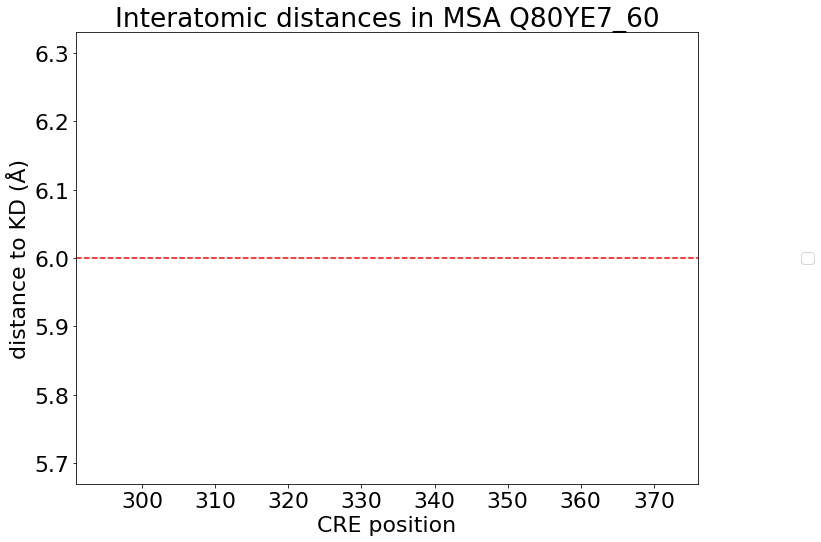

in msa: Q8BW96_60
2jc6
interv1: [279, 313]
interv2a: [23, 279]
interv2b: [279, 313]
6t6f
interv1: [279, 318]
interv2a: [23, 279]
interv2b: [279, 318]
6qp5
interv1: [279, 302]
interv2a: [23, 279]
interv2b: [279, 302]
279 318


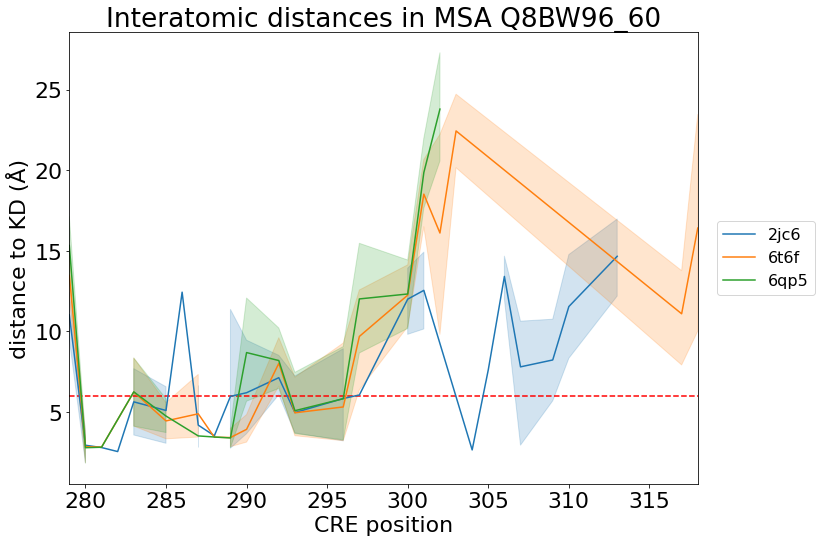

in msa: Q8I719_60
5dyk
interv1: [15, 29]
interv2a: [15, 29]
interv2b: [578, 744]
5ezr
interv1: [2, 22]
interv2a: [2, 22]
interv2b: [571, 737]
5fet
interv1: [2, 22]
interv2a: [2, 22]
interv2b: [571, 737]
5f0a
interv1: [1, 22]
interv2a: [1, 22]
interv2b: [571, 737]
5dyl
interv1: [1, 22]
interv2a: [1, 22]
interv2b: [571, 737]
5dzc
interv1: [1, 22]
interv2a: [1, 22]
interv2b: [571, 737]
4rz7
interv1: [1, 22]
interv2a: [1, 22]
interv2b: [570, 737]
1 29


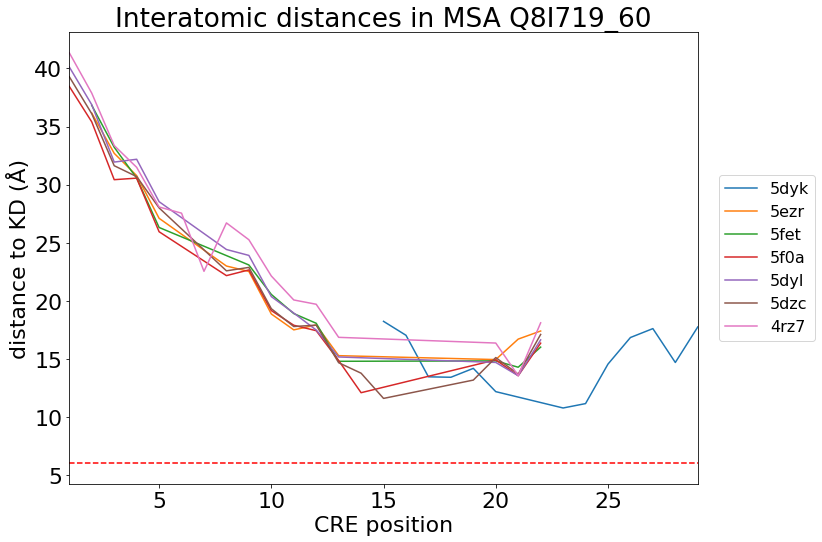

in msa: Q8IBS5_60
4qox
interv1: [350, 358]
interv2a: [71, 329]
interv2b: [350, 358]
4rgj
interv1: [350, 358]
interv2a: [71, 329]
interv2b: [350, 358]
350 358


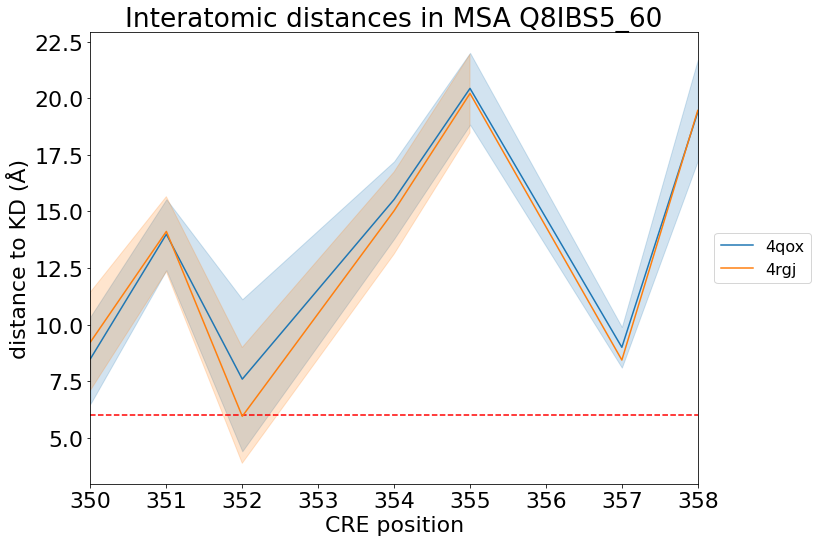

in msa: Q8IU85_60
6qp5
interv1: [279, 302]
interv2a: [23, 279]
interv2b: [279, 302]
6t6f
interv1: [279, 318]
interv2a: [23, 279]
interv2b: [279, 318]
2jc6
interv1: [279, 313]
interv2a: [23, 279]
interv2b: [279, 313]
279 318


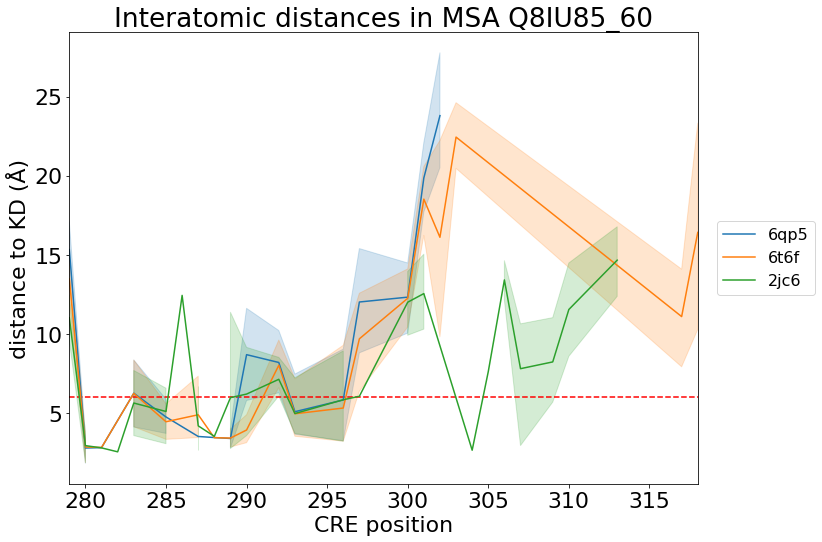

in msa: Q8VDF3_60
1z9x
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
2a2a
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
6paw
1wmk
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
2a27
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
2yaa
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
2ya9
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
2yab
2cke
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
282 291


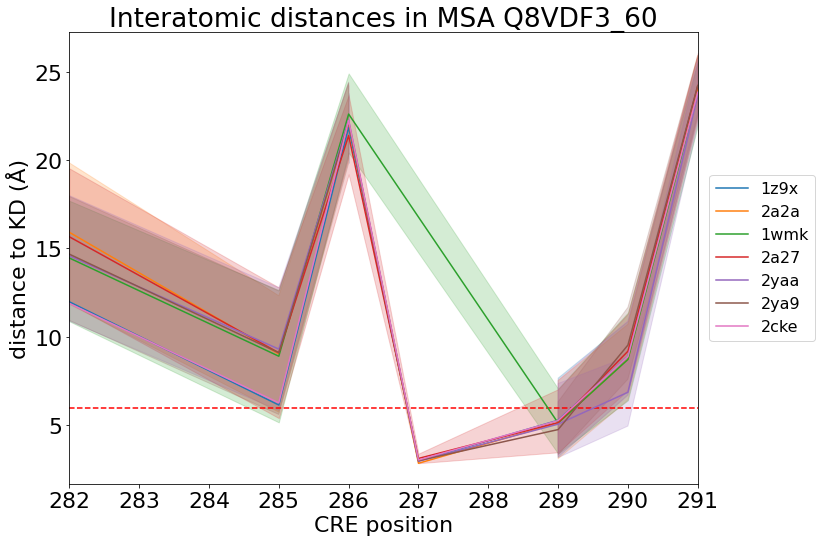

No handles with labels found to put in legend.


in msa: Q91VB2_60
2jam
278 303


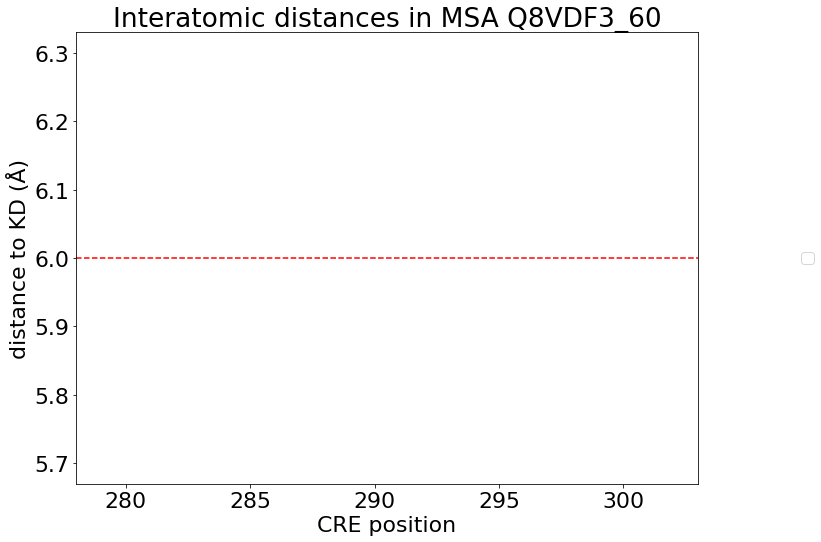

in msa: Q91YS8_60
4fg8
interv1: [276, 299]
interv2a: [20, 276]
interv2b: [276, 299]
1a06
interv1: [285, 312]
interv2a: [20, 276]
interv2b: [285, 312]
4fgb
4fg7
interv1: [276, 277]
interv2a: [20, 276]
interv2b: [276, 277]
4fg9
interv1: [276, 314]
interv2a: [20, 276]
interv2b: [276, 312]
276 314


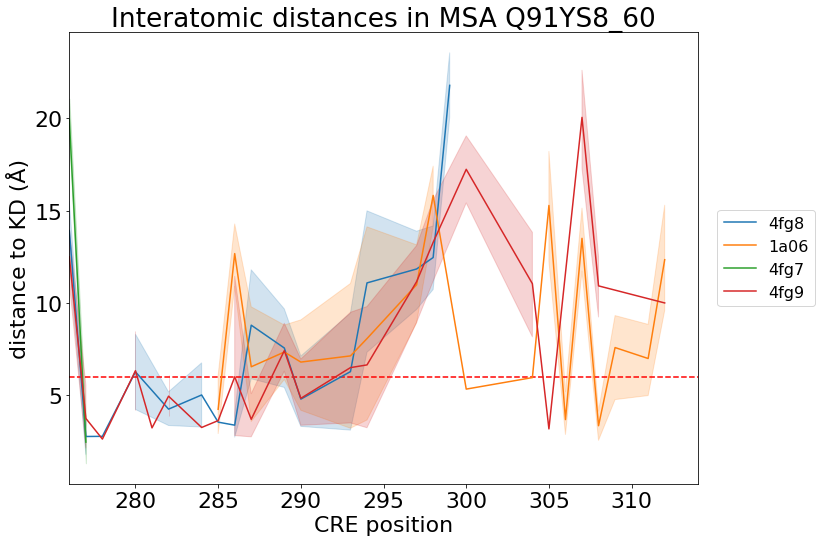

in msa: Q96NX5_60
2jam


No handles with labels found to put in legend.


278 303


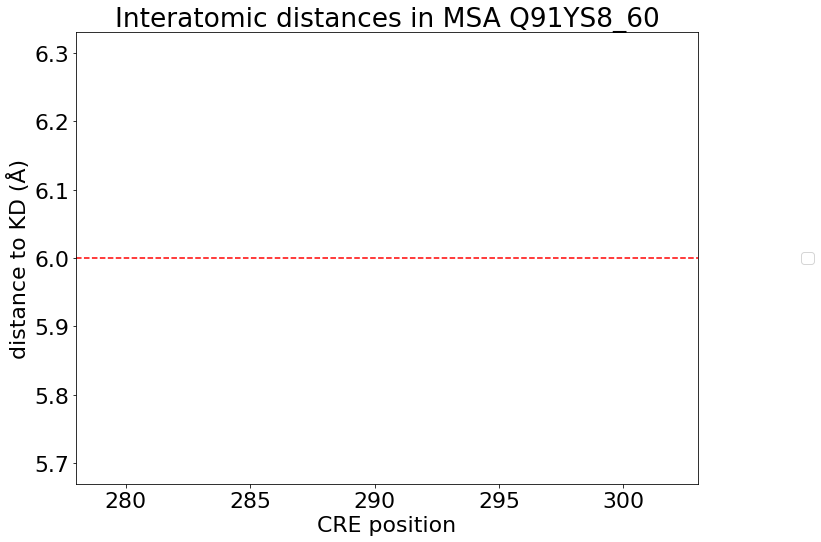

in msa: Q9UIK4_60
2cke
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
1wmk
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
2a27
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
1z9x
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
6paw
2a2a
interv1: [282, 291]
interv2a: [13, 275]
interv2b: [282, 291]
282 291


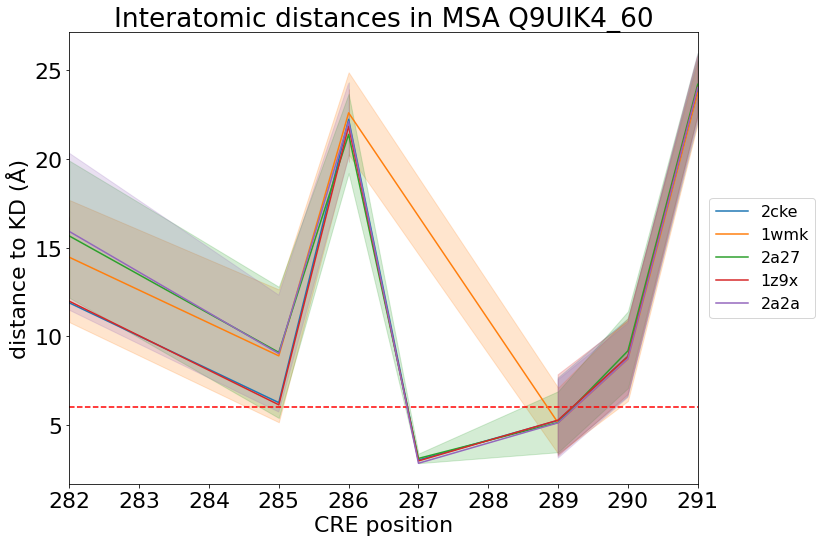

[]


In [8]:
# Use this one for considering all heavy atoms distances
# path = '../datasets/interatomic_distances_both_regions_kd_cre/'
# not_plotted = []

# for _, row in msa_pdb.iterrows(): # msa_pdb
#     msa = row.msa
#     print(f"in msa: {msa}")
#     # Create a dataframe for each MSA that contain its PDBs and distances 
#     msa_distances = pd.DataFrame(
#     columns= ['chain_a', 'pos_a', 'aa_a', 'atom_a', 'chain_b', 'pos_b', 'aa_b','atom_b', 'dist', 'pdb', 'msa']
#     )
#     #msa_distances['msa'] = msa

#     for pdb in row.pdb:
#         print(pdb)
#         # Path to pdb distances file
#         file = os.path.join(path, pdb + "_shorter_dist.csv")
#         #print(file)

#         # Check if file(avoid folders)
#         if os.path.isfile(file):
#             try:
#                 # Read the pdb distances file
#                 df = pd.read_csv(file)
#                 # Check that df is not empty
#                 # if not df.empty:
#                 #     # Add MSA and concat both dataframes
#                 #     df["msa"] = msa
#                 #     msa_distances = pd.concat([msa_distances, df])   # OK!
#                 # else:
#                 #     not_plotted.append(pdb)
#                 #     continue
#                 if df.empty:
#                     not_plotted.append(pdb)
#                     continue
#                 else:
#                     # Add MSA and concat both dataframes
#                     df["msa"] = msa

#                     # The CRE residues could be either in pos_a or pos_b col. to chose the correct one, make a comparison
#                     # interv1 in the coordinates of CRE in pdb numbering
#                     interv1 = pd.Interval(to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0], to_calculate[to_calculate.pdb == pdb].pdb_end_cre.values[0], closed= 'both')
#                     interv2a = pd.Interval(df.pos_a.min(), df.pos_a.max(), closed= 'both')
#                     interv2b = pd.Interval(df.pos_b.min(), df.pos_b.max(), closed= 'both')

#                     print(f"interv1: {interv1}\ninterv2a: {interv2a}\ninterv2b: {interv2b}")

#                     if interv1.overlaps(interv2a) and not interv1.overlaps(interv2b):
#                         pos_col = 'pos_a'
#                     else:
#                         pos_col = 'pos_b'

#                     # Chains to keep
#                     chains = to_calculate[(to_calculate.msa == msa) & (to_calculate.pdb == pdb)].chain.to_list()
#                     subset =  df[(df.chain_a.isin(chains)) & (df.chain_b.isin(chains)) ]

                    
#                     msa_distances = pd.concat([msa_distances, subset])   # OK!
                    
#             except:
#                 print(f"An exception occurred with file {file}")
#         else:
#             continue
#     # Now the plot

#     # The CRE residues could be either in pos_a or pos_b col. to chose the correct one, make a comparison
#     # interv1 in the coordinates of CRE in pdb numbering
#     if df.empty:
#         not_plotted.append(msa,pdb)
#         continue

#     # interv1 = pd.Interval(to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0], to_calculate[to_calculate.pdb == pdb].pdb_end_cre.values[0], closed= 'both')
#     # interv2a = pd.Interval(df.pos_a.min(), df.pos_a.max(), closed= 'both')
#     # interv2b = pd.Interval(df.pos_b.min(), df.pos_b.max(), closed= 'both')


#     # print(f"interv1: {interv1}\ninterv2a: {interv2a}\ninterv2b: {interv2b}")

#     # if interv1.overlaps(interv2a) and not interv1.overlaps(interv2b):
#     #     pos_col = 'pos_a'
#     # else:
#     #     pos_col = 'pos_b'

#     # intervalo =  range(to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0], to_calculate[to_calculate.pdb == pdb].pdb_end_cre.values[0]+1)
#     # subset =  df[df.pos_a.isin(intervalo)]


#     # Plot the distances
#     plt.figure(figsize= (12,8), facecolor= 'white')
#     fig = sns.lineplot(data= msa_distances, x= pos_col, y= 'dist', hue= 'pdb')
#     plt.title(f"Interatomic distances in MSA {df.msa.unique()[0]}")
#     plt.xlabel("CRE position")
#     plt.ylabel("distance to KD (Å)")
#     plt.rcParams['font.size'] = 22

#     # Set the x-axis limits as the minimun and max residue in the MSA
#     xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
#     xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
#     print(xmin, xmax)

#     plt.xlim([xmin, xmax])
#     plt.hlines(y= 6, xmin= xmin, xmax= xmax, colors= 'r', linestyles= "--")
#     plt.legend(loc='center right', bbox_to_anchor=(1.20, 0.5), prop={'size': 16})
#     plt.tight_layout()
#     #plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
#     plt.show()
# print(not_plotted)

### For shortest distances

AttributeError: 'DataFrame' object has no attribute 'kd_location'

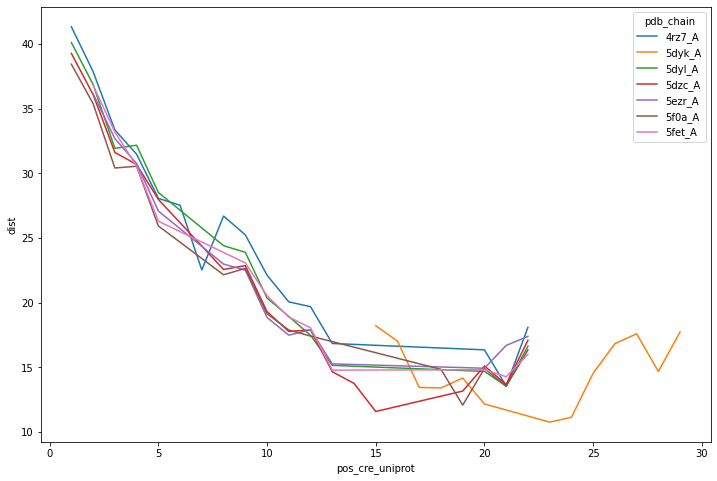

In [7]:
# Use this one for shortest distance in CRE positions 
# ONE FIGURE BY MSA
# Group by pdb col
grouped_df = subset_df.groupby('msa')

# Iterate over each unique pdb value and create a separate figure
for pdb, group in grouped_df:
    msa = group.msa
    # Create a new figure for each pdb
    plt.figure(figsize= (12,8), facecolor= 'white')

    fig = sns.lineplot(data= group, x= 'pos_cre_uniprot', y= 'dist', hue= 'pdb_chain')
    plt.title(f"Interatomic distances in MSA {group.msa.unique()[0]}\nKD location: {group.kd_location.values[0]}")
    plt.xlabel("CRE position")
    plt.ylabel("distance to KD (Å)")
    plt.rcParams['font.size'] = 22

    # # Set the x-axis limits as the minimun and max residue in the MSA
    # xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
    # xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
    # print(xmin, xmax)

    # plt.xlim([xmin, xmax])
    plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], colors= 'r', linestyles= "--")
    plt.legend(loc='center right', bbox_to_anchor=(1.20, 0.5), prop={'size': 16})
    plt.tight_layout()
    #plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
    plt.show()

### P45985_60

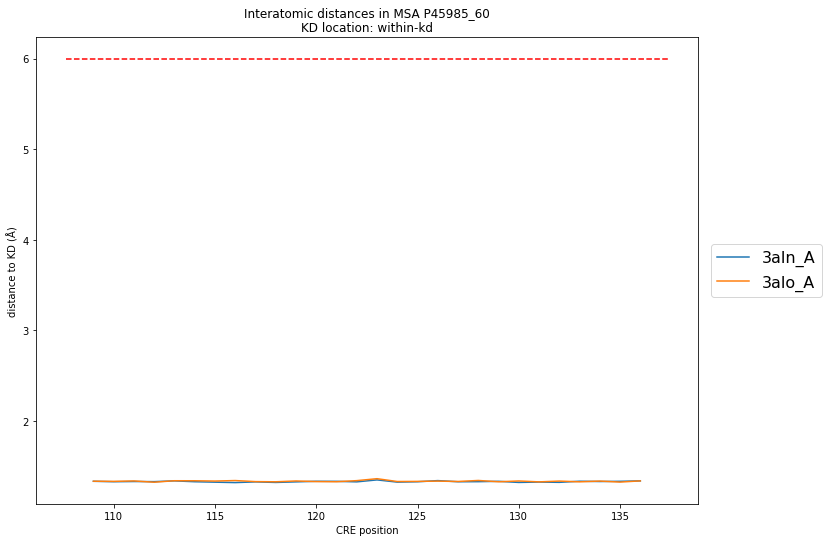

In [30]:
# Use this one for shortest distance in CRE positions 
# ONE FIGURE BY MSA
# Group by pdb col
P45985_60_df = subset_df[subset_df.msa == 'P45985_60']

# Create a new figure for each pdb
plt.figure(figsize= (12,8), facecolor= 'white')

fig = sns.lineplot(data= P45985_60_df, x= 'pos_cre_uniprot', y= 'dist', hue= 'pdb_chain')
plt.title(f"Interatomic distances in MSA {P45985_60_df.msa.unique()[0]}\nKD location: {P45985_60_df.kd_location.values[0]}")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22

# # Set the x-axis limits as the minimun and max residue in the MSA
# xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
# xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
# print(xmin, xmax)

# plt.xlim([xmin, xmax])
#plt.xlim(109, 136)
plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], colors= 'r', linestyles= "--")
plt.legend(loc='center right', bbox_to_anchor=(1.20, 0.5), prop={'size': 16})
plt.tight_layout()
#plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
plt.show()

In [40]:
to_calculate[to_calculate.msa == 'P45985_60']

,msa,uniprot,pdb,chain,term_id_cre,start_cre,end_cre,term_id_kd,start_kd,end_kd,pdb_start_cre,pdb_end_cre,pdb_start_kd,pdb_end_kd,kd_location
664,P45985_60,P45985,3vut,A,cre85,109,136,kd84,102,367,142,337,142,367,n-ter
665,P45985_60,P45985,3aln,A,cre85,109,136,kd84,102,367,109,136,102,367,n-ter
666,P45985_60,P45985,3alo,A,cre85,109,136,kd84,102,367,109,136,102,367,n-ter


In [44]:
P45985_60 = all_shortest_distances_mapped[all_shortest_distances_mapped.msa == 'P45985_60']
P45985_60

,chain_a,pos_kd,aa_a,atom_a,chain_b,pos_cre,aa_b,atom_b,dist,pdb,msa,pdb_chain,pos_cre_uniprot,kd_location
6466,A,108,ILE,C,A,109,GLY,N,1.333058,3aln,P45985_60,3aln_A,109,n-ter
6467,A,109,GLY,C,A,110,ARG,N,1.328256,3aln,P45985_60,3aln_A,110,n-ter
6468,A,110,ARG,C,A,111,GLY,N,1.330485,3aln,P45985_60,3aln_A,111,n-ter
6469,A,111,GLY,C,A,112,ALA,N,1.329368,3aln,P45985_60,3aln_A,112,n-ter
6470,A,112,ALA,C,A,113,TYR,N,1.337670,3aln,P45985_60,3aln_A,113,n-ter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14356,A,213,VAL,CG1,A,363,LYS,N,7.306813,3vut,P45985_60,3vut_A,363,n-ter
14357,A,209,THR,CG2,A,364,HIS,ND1,8.023670,3vut,P45985_60,3vut_A,364,n-ter
14358,A,337,SER,OG,A,365,PRO,O,8.755413,3vut,P45985_60,3vut_A,365,n-ter
14359,A,206,GLY,CA,A,366,PHE,CZ,3.539699,3vut,P45985_60,3vut_A,366,n-ter


### P00519_60

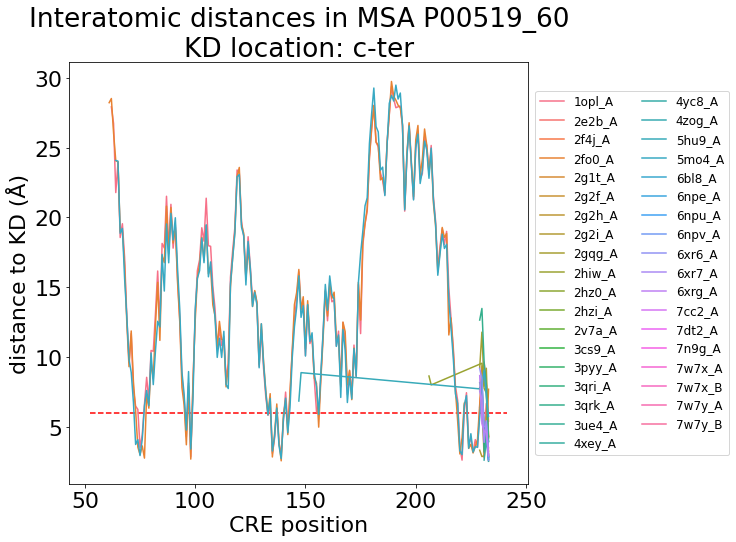

In [99]:
# Use this one for shortest distance in CRE positions 
# ONE FIGURE BY MSA
# Group by pdb col
P00519_60_df = subset_df[subset_df.msa == 'P00519_60']

# Create a new figure for each pdb
plt.figure(figsize= (12,8), facecolor= 'white')

fig = sns.lineplot(data= P00519_60_df, x= 'pos_cre_uniprot', y= 'dist', hue= 'pdb_chain')
plt.title(f"Interatomic distances in MSA {P00519_60_df.msa.unique()[0]}\nKD location: {P00519_60_df.kd_location.values[0]}")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22

# # Set the x-axis limits as the minimun and max residue in the MSA
# xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
# xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
# print(xmin, xmax)

# plt.xlim([xmin, xmax])
#plt.xlim(109, 136)
plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], colors= 'r', linestyles= "--")
plt.legend(loc='center right', bbox_to_anchor=(1.45, 0.5), prop={'size': 12}, ncol=2)
plt.tight_layout()
#plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
plt.show()

### P00523_60

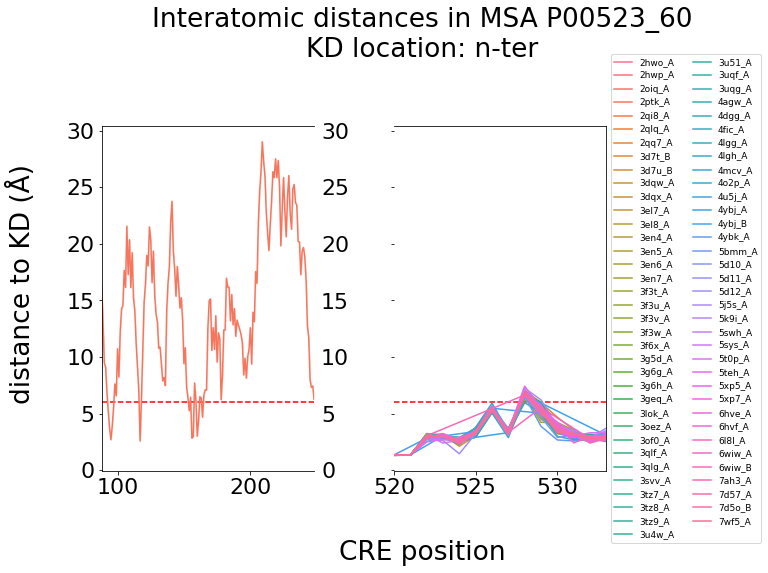

In [136]:
# Use this one for shortest distance in CRE positions 
# ONE FIGURE BY MSA
# Group by pdb col
P00523_60_df = subset_df[subset_df.msa == 'P00523_60']

# Create two subplots
f,(ax,ax2) = plt.subplots(1,2,sharey=True, facecolor='w', figsize= (12,8))

# Create a new figure for each pdb
#plt.figure(figsize= (12,8), facecolor= 'white')

sns.lineplot(data= P00523_60_df, x= 'pos_cre_uniprot', y= 'dist', hue= 'pdb_chain', ax= ax)
sns.lineplot(data= P00523_60_df, x= 'pos_cre_uniprot', y= 'dist', hue= 'pdb_chain', ax= ax2)

ax.set_xlim(88, 248)
ax2.set_xlim(520, 533)

# 4. hide the spines between ax and ax2
ax.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax.yaxis.tick_left()
ax.tick_params(labelright='off')

#ax2.yaxis.tick_right()
ax.set_ylabel("")
ax.set_xlabel("")
ax2.set_xlabel("")

plt.suptitle(f"Interatomic distances in MSA {P00523_60_df.msa.unique()[0]}\nKD location: {P00523_60_df.kd_location.values[0]}")
f.supxlabel("CRE position")
f.supylabel("distance to KD (Å)")
# plt.rcParams['font.size'] = 22

# # Set the x-axis limits as the minimun and max residue in the MSA
# xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
# xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
# print(xmin, xmax)

# plt.xlim([xmin, xmax])
#plt.xlim(109, 136)
ax.hlines(y= 6, xmin= 88, xmax= 248, colors= 'r', linestyles= "--")
ax2.hlines(y= 6, xmin= 520, xmax= 533, colors= 'r', linestyles= "--")
#plt.legend(loc='center right', bbox_to_anchor=(1.45, 0.5), prop={'size': 10}, ncol=2)

#ax.legend( loc='center right', bbox_to_anchor=(1.45, 0.5), prop={'size': 10}, ncol=2 )
ax.get_legend().remove()
ax2.legend(loc='center right', bbox_to_anchor=(1.75, 0.5), prop={'size': 9}, ncol=2)

plt.tight_layout()
#plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
plt.show()

### P00533_60 EGFR

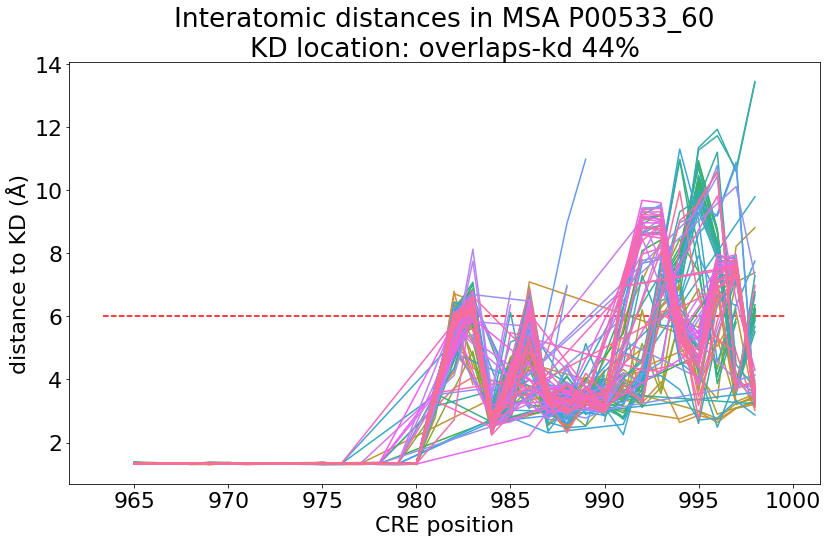

In [139]:
# Use this one for shortest distance in CRE positions 
# ONE FIGURE BY MSA
# Group by pdb col
# Use this one for shortest distance in CRE positions 
# ONE FIGURE BY MSA
# Group by pdb col
P00533_60_df = subset_df[subset_df.msa == 'P00533_60']

# Create a new figure for each pdb
plt.figure(figsize= (12,8), facecolor= 'white')

fig = sns.lineplot(data= P00533_60_df, x= 'pos_cre_uniprot', y= 'dist', hue= 'pdb_chain')
plt.title(f"Interatomic distances in MSA {P00533_60_df.msa.unique()[0]}\nKD location: {P00533_60_df.kd_location.values[0]}")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22

# # Set the x-axis limits as the minimun and max residue in the MSA
# xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
# xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
# print(xmin, xmax)

# plt.xlim([xmin, xmax])
#plt.xlim(109, 136)
plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], colors= 'r', linestyles= "--")
plt.legend().remove()
plt.tight_layout()
#plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
plt.show()

In [18]:
P00533_60_df.pdb.nunique()

215

In [20]:
P00533_60_df.sample(50).pdb.unique()

array(['2rgp', '6p8q', '5uga', '7jxq', '2itu', '5edp', '5em5', '5hcz',
       '5xgm', '2rf9', '5hg8', '6jx4', '5hib', '4jr3', '7aei', '7k1i',
       '6wa2', '4rj5', '2rfe', '3ika', '5hcx', '2itv', '6tfv', '5xdl',
       '5czi', '4i22', '5x2k', '5cao', '4rj4', '3lzb', '7aem', '7jxi',
       '5jeb', '5hg7', '2ity', '5em8', '5cno', '5em6', '5cas', '4riy',
       '7er2', '5x2a', '4i24', '2j5e', '5hic', '6z4b'], dtype=object)

In [21]:
with open('../datasets/pdbs_egfr.txt', "w") as f:
    for pdb in P00533_60_df.sample(20).pdb.unique():
        f.write(pdb)
        f.write(" ")


C:\Users\User\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:22: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 


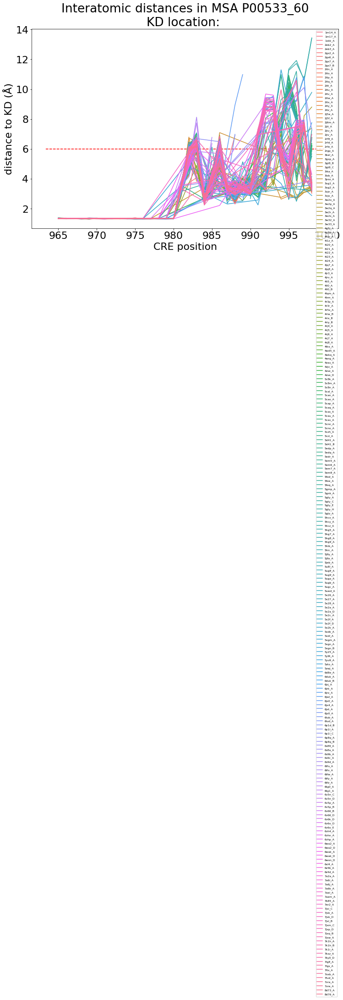

In [14]:
# Group by pdb col
P00533_60_df = subset_df[subset_df.msa == 'P00533_60']

# Create a new figure for each pdb
plt.figure(figsize= (12,8), facecolor= 'white')

fig = sns.lineplot(data= P00533_60_df, x= 'pos_cre_uniprot', y= 'dist', hue= 'pdb_chain')
plt.title(f"Interatomic distances in MSA {P00533_60_df.msa.unique()[0]}\nKD location: ")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22

# # Set the x-axis limits as the minimun and max residue in the MSA
# xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
# xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
# print(xmin, xmax)

# plt.xlim([xmin, xmax])
#plt.xlim(109, 136)
plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], colors= 'r', linestyles= "--")
plt.legend(fontsize= 6)
plt.tight_layout()
#plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
plt.show()

### Q14680_60

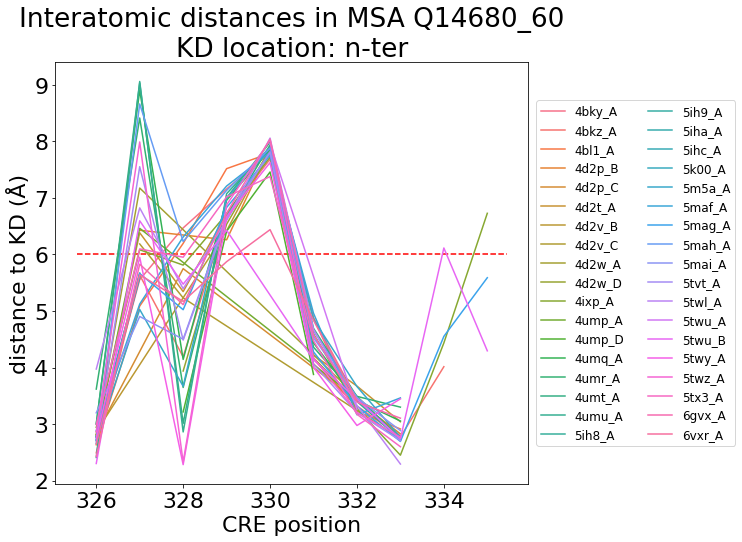

In [145]:
# Use this one for shortest distance in CRE positions 
# ONE FIGURE BY MSA
# Group by pdb col
# Use this one for shortest distance in CRE positions 
# ONE FIGURE BY MSA
# Group by pdb col
Q14680_60_df = subset_df[subset_df.msa == 'Q14680_60']

# Create a new figure for each pdb
plt.figure(figsize= (12,8), facecolor= 'white')

fig = sns.lineplot(data= Q14680_60_df, x= 'pos_cre_uniprot', y= 'dist', hue= 'pdb_chain')
plt.title(f"Interatomic distances in MSA {Q14680_60_df.msa.unique()[0]}\nKD location: {Q14680_60_df.kd_location.values[0]}")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22

# # Set the x-axis limits as the minimun and max residue in the MSA
# xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
# xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
# print(xmin, xmax)

# plt.xlim([xmin, xmax])
#plt.xlim(109, 136)
plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], colors= 'r', linestyles= "--")
plt.legend(loc='center right', bbox_to_anchor=(1.45, 0.5), prop={'size': 12}, ncol=2)

plt.tight_layout()
#plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
plt.show()

### Poster

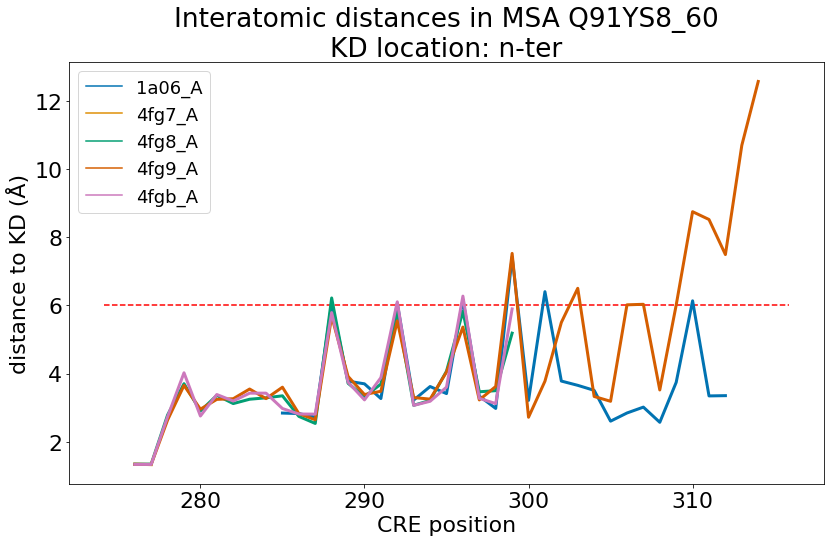

In [61]:
# Use this one for shortest distance in CRE positions 
# ONE FIGURE BY MSA
# Group by pdb col
Q91YS8_60_df = subset_df[subset_df.msa == 'Q91YS8_60']

# Create a new figure for each pdb
plt.figure(figsize= (12,8), facecolor= 'white')

fig = sns.lineplot(data= Q91YS8_60_df, x= 'pos_cre_uniprot', y= 'dist', hue= 'pdb_chain', lw= 3, palette= 'colorblind')
plt.title(f"Interatomic distances in MSA {Q91YS8_60_df.msa.unique()[0]}\nKD location: {Q91YS8_60_df.kd_location.values[0]}")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22

# # Set the x-axis limits as the minimun and max residue in the MSA
# xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
# xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
# print(xmin, xmax)

# plt.xlim([xmin, xmax])
#plt.xlim(109, 136)
plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], colors= 'r', linestyles= "--")
plt.legend( prop={'size': 18}) # loc='center right', bbox_to_anchor=(1.45, 0.5), ncol=2

plt.tight_layout()
#plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
plt.show()

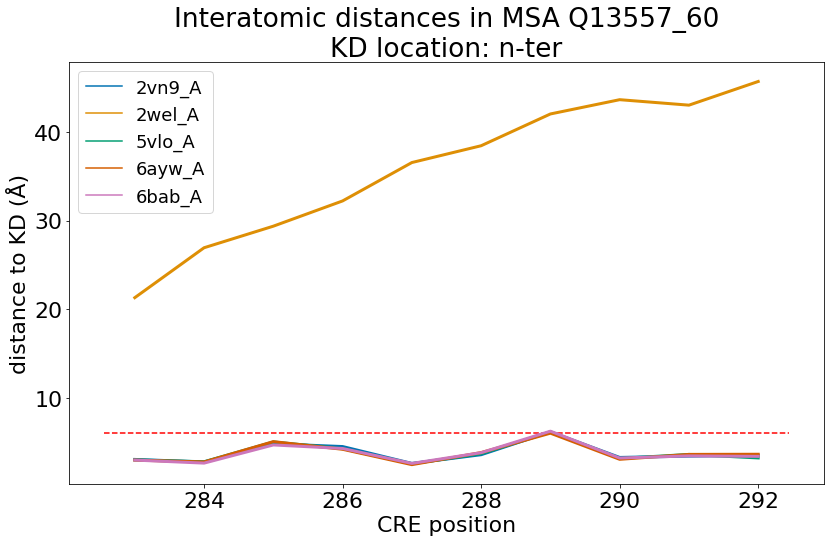

In [63]:
# Use this one for shortest distance in CRE positions 
# ONE FIGURE BY MSA
# Group by pdb col
Q13557_60_df = subset_df[subset_df.msa == 'Q13557_60']

# Create a new figure for each pdb
plt.figure(figsize= (12,8), facecolor= 'white')

fig = sns.lineplot(data= Q13557_60_df, x= 'pos_cre_uniprot', y= 'dist', hue= 'pdb_chain', lw= 3, palette= 'colorblind')
plt.title(f"Interatomic distances in MSA {Q13557_60_df.msa.unique()[0]}\nKD location: {Q13557_60_df.kd_location.values[0]}")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22

# # Set the x-axis limits as the minimun and max residue in the MSA
# xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
# xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
# print(xmin, xmax)

# plt.xlim([xmin, xmax])
#plt.xlim(109, 136)
plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], colors= 'r', linestyles= "--")
plt.legend( prop={'size': 18}) # loc='center right', bbox_to_anchor=(1.45, 0.5), ncol=2

plt.tight_layout()
#plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
plt.show()

## Others

No handles with labels found to put in legend.


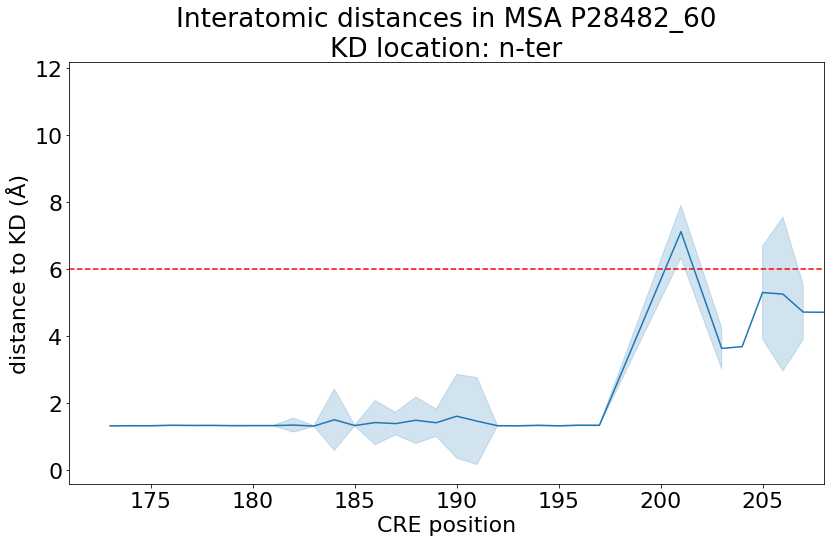

In [57]:
# Particular cases: P28482
# Group by pdb col
grouped_df = all_shortest_distances_mapped[all_shortest_distances_mapped.msa == 'P28482_60']

# Iterate over each unique pdb value and create a separate figure
#for group in grouped_df:
# Create a new figure for each pdb
plt.figure(figsize= (12,8), facecolor= 'white')

fig = sns.lineplot(data= grouped_df, x= 'pos_cre_uniprot', y= 'dist', ci= 'sd') # , hue= 'pdb_chain'
plt.title(f"Interatomic distances in MSA {grouped_df.msa.unique()[0]}\nKD location: {grouped_df.kd_location.values[0]}")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22

# # Set the x-axis limits as the minimun and max residue in the MSA
# xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
# xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
# print(xmin, xmax)

plt.xlim(171, 208)
plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], colors= 'r', linestyles= "--")
plt.legend(loc='center right', bbox_to_anchor=(1.20, 0.5), prop={'size': 16}).remove()
plt.tight_layout()
plt.show()

No handles with labels found to put in legend.


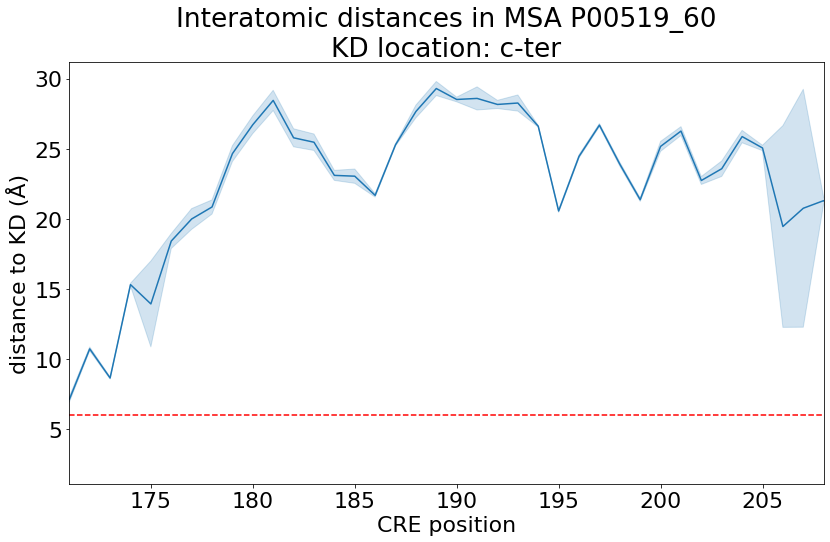

In [61]:
# Particular cases: P00519
# Group by pdb col
grouped_df = all_shortest_distances_mapped[all_shortest_distances_mapped.msa == 'P00519_60']
grouped_df = grouped_df[grouped_df.pos_cre_uniprot <= 233]

# Iterate over each unique pdb value and create a separate figure
#for group in grouped_df:
# Create a new figure for each pdb
plt.figure(figsize= (12,8), facecolor= 'white')

fig = sns.lineplot(data= grouped_df, x= 'pos_cre_uniprot', y= 'dist', ci= 'sd') # , hue= 'pdb_chain'
plt.title(f"Interatomic distances in MSA {grouped_df.msa.unique()[0]}\nKD location: {grouped_df.kd_location.values[0]}")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22

# # Set the x-axis limits as the minimun and max residue in the MSA
# xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
# xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
# print(xmin, xmax)

plt.xlim(171, 208)
plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], colors= 'r', linestyles= "--")
plt.legend(loc='center right', bbox_to_anchor=(1.20, 0.5), prop={'size': 16}).remove()
plt.tight_layout()
plt.show()

In [60]:
grouped_df

,chain_a,pos_kd,aa_a,atom_a,chain_b,pos_cre,aa_b,atom_b,dist,pdb,pdb_chain,pos_cre_uniprot,msa,kd_location
257,A,313,ASP,O,A,81,LYS,NZ,27.927706,1opl,1opl_A,62,P00519_60,c-ter
258,A,313,PRO,C,A,82,LYS,NZ,26.735285,1opl,1opl_A,63,P00519_60,c-ter
259,A,313,ASN,OD1,A,83,LYS,NZ,21.784492,1opl,1opl_A,64,P00519_60,c-ter
260,A,313,LEU,O,A,84,LYS,NZ,23.892839,1opl,1opl_A,65,P00519_60,c-ter
261,A,313,PHE,CE2,A,85,LYS,NZ,18.565845,1opl,1opl_A,66,P00519_60,c-ter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13107,A,310,ASP,OD1,A,252,LYS,NZ,2.930657,6xrg,6xrg_A,233,P00519_60,c-ter
14387,A,291,ASP,OD2,A,233,LYS,NZ,2.497508,7w7x,7w7x_A,233,P00519_60,c-ter
14388,B,291,TYR,CB,B,232,LYS,NZ,3.309673,7w7x,7w7x_B,232,P00519_60,c-ter
14389,A,307,ASP,CA,A,233,ARG,NH1,4.743175,7w7y,7w7y_A,233,P00519_60,c-ter


No handles with labels found to put in legend.


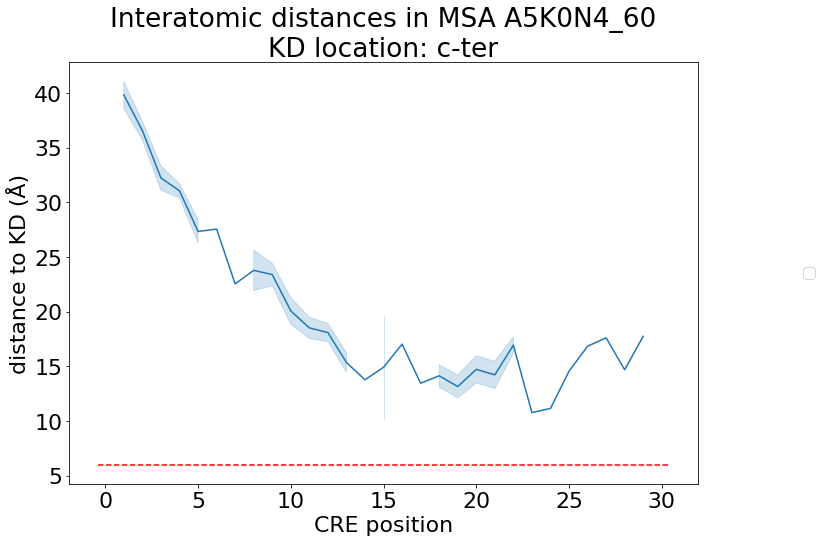

No handles with labels found to put in legend.


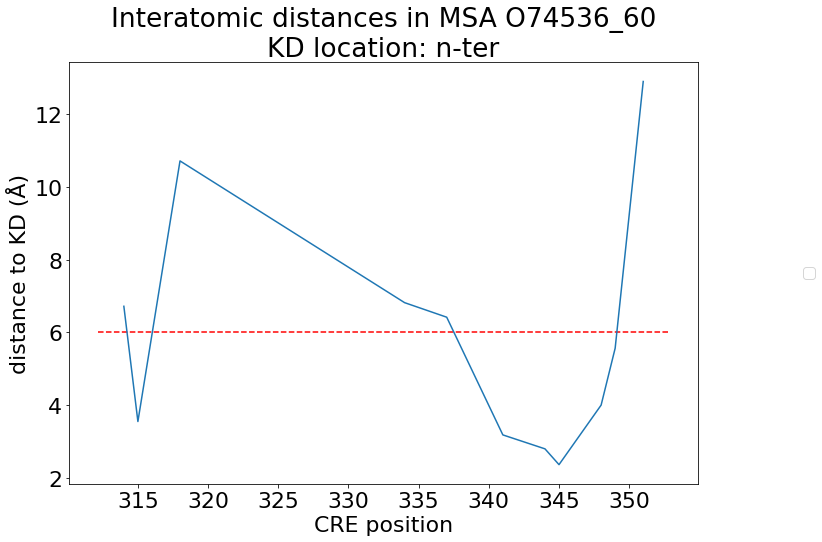

No handles with labels found to put in legend.


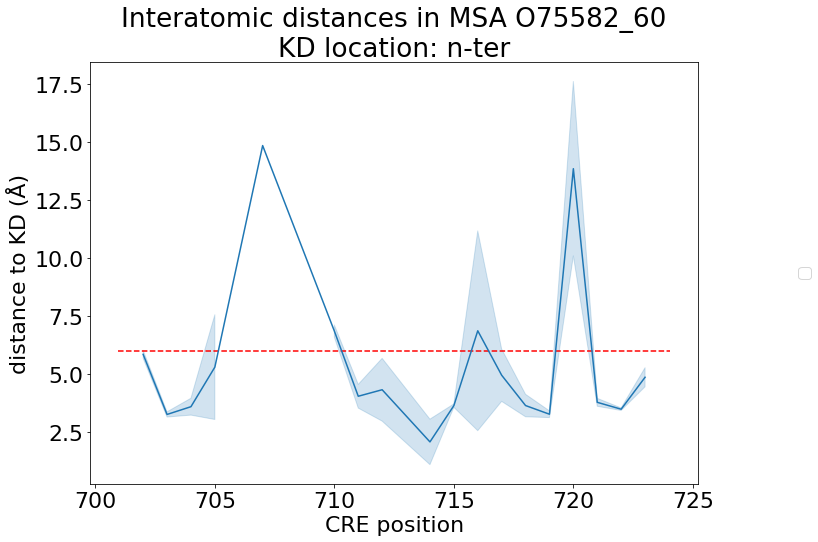

No handles with labels found to put in legend.


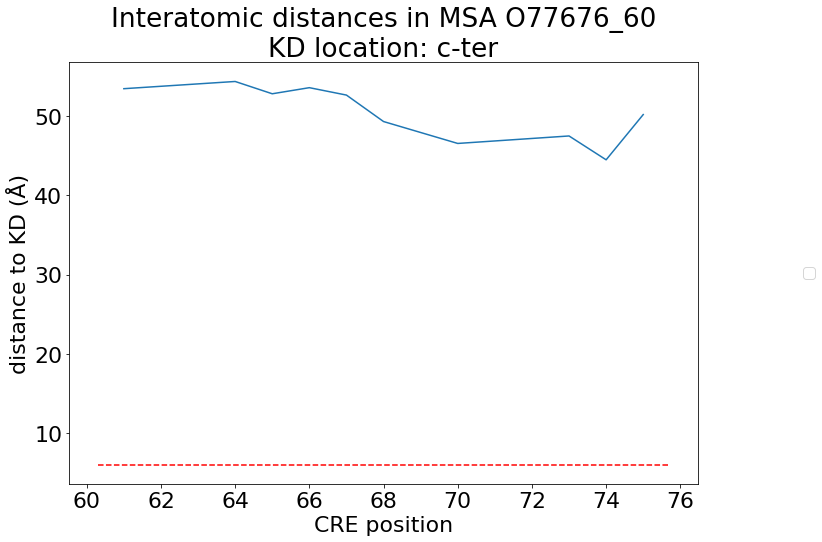

No handles with labels found to put in legend.


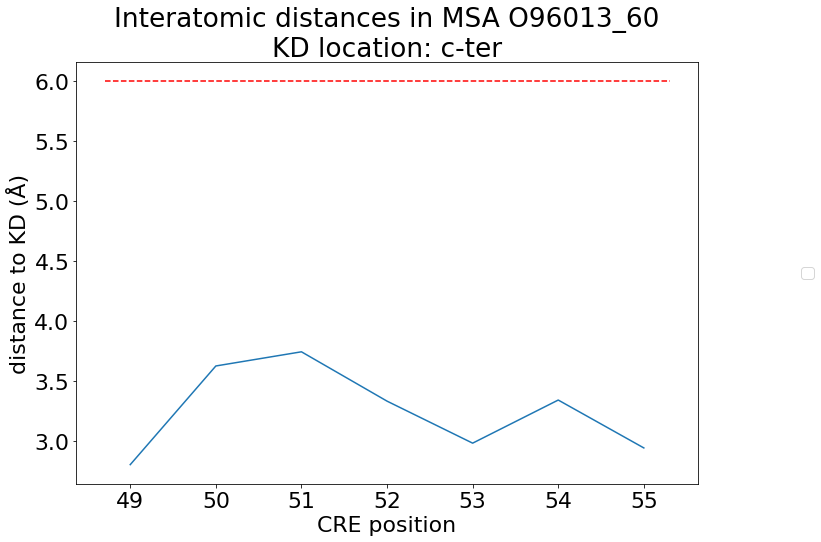

No handles with labels found to put in legend.


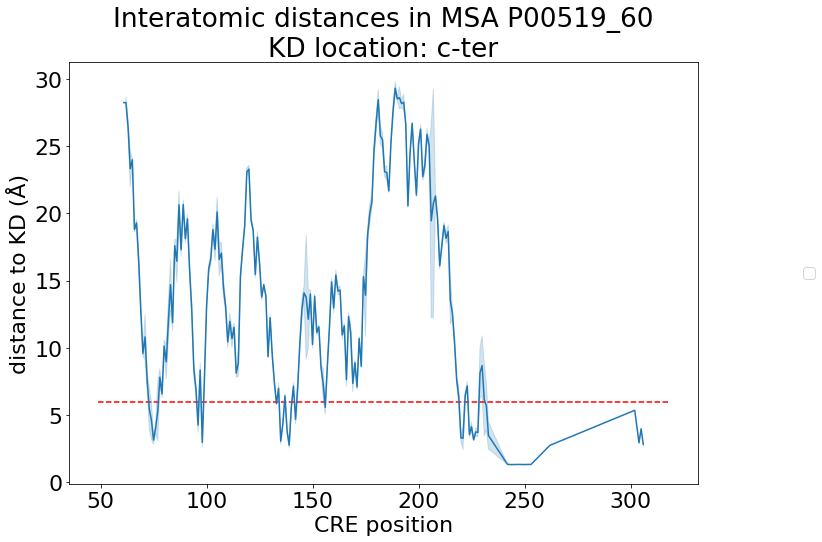

No handles with labels found to put in legend.


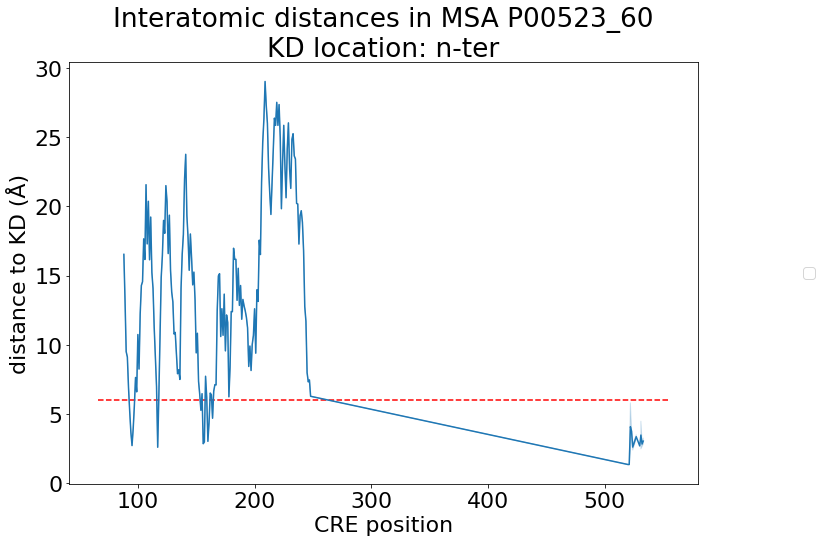

No handles with labels found to put in legend.


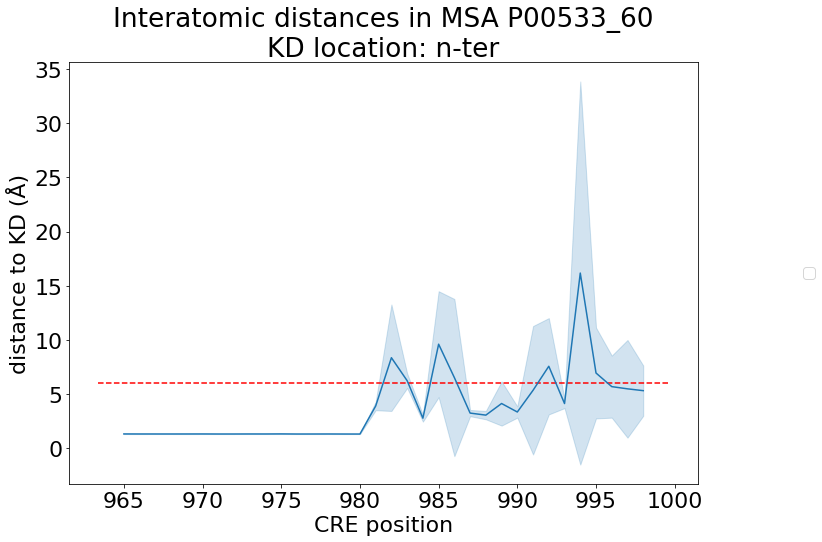

No handles with labels found to put in legend.


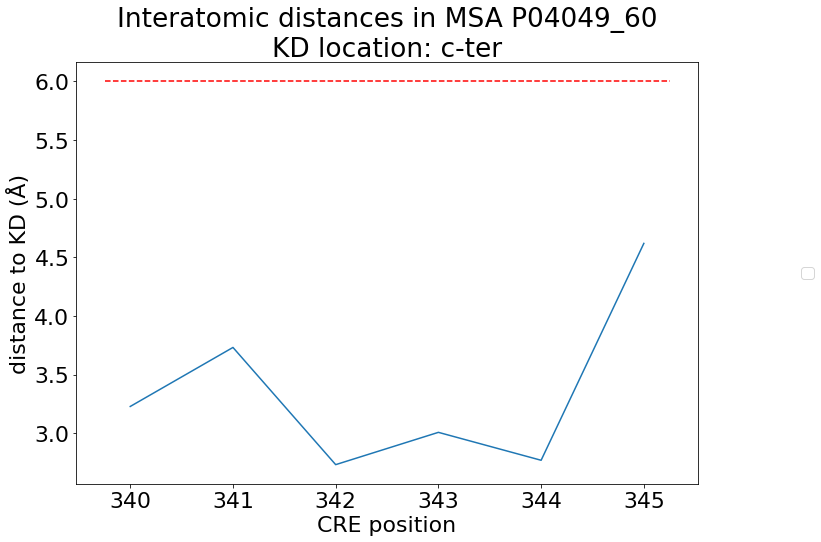

No handles with labels found to put in legend.


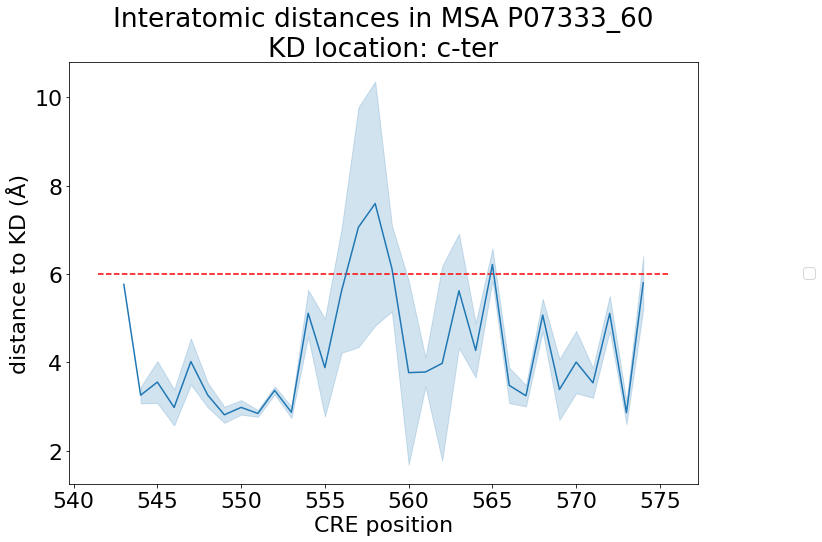

No handles with labels found to put in legend.


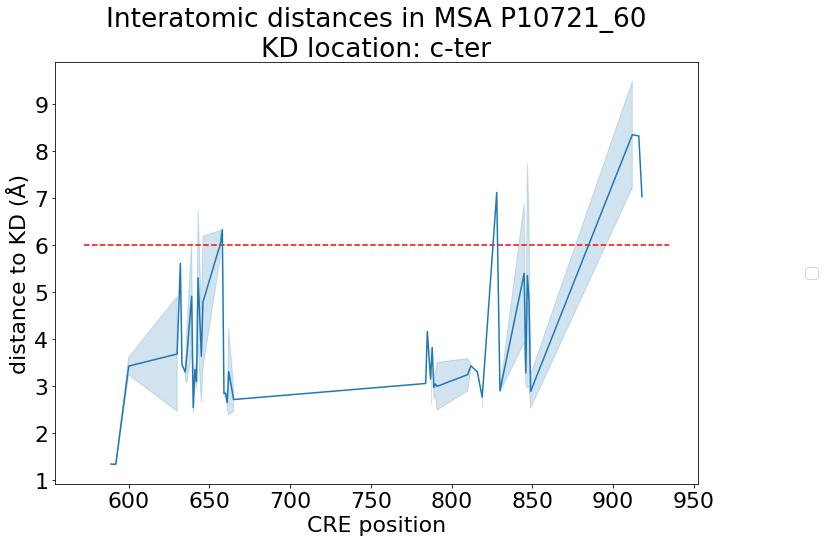

No handles with labels found to put in legend.


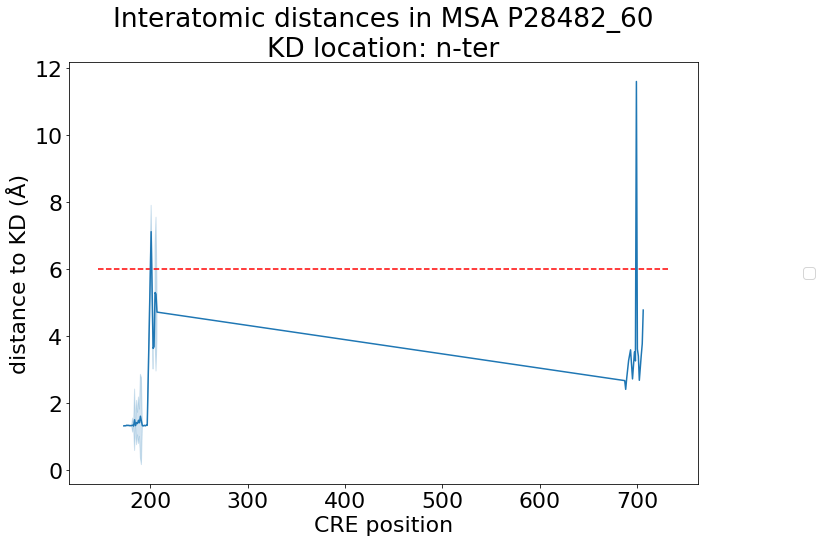

No handles with labels found to put in legend.


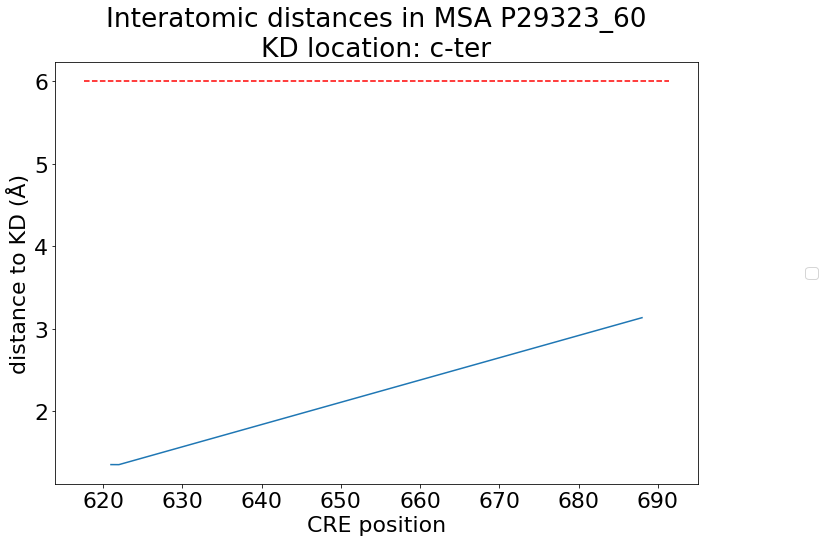

No handles with labels found to put in legend.


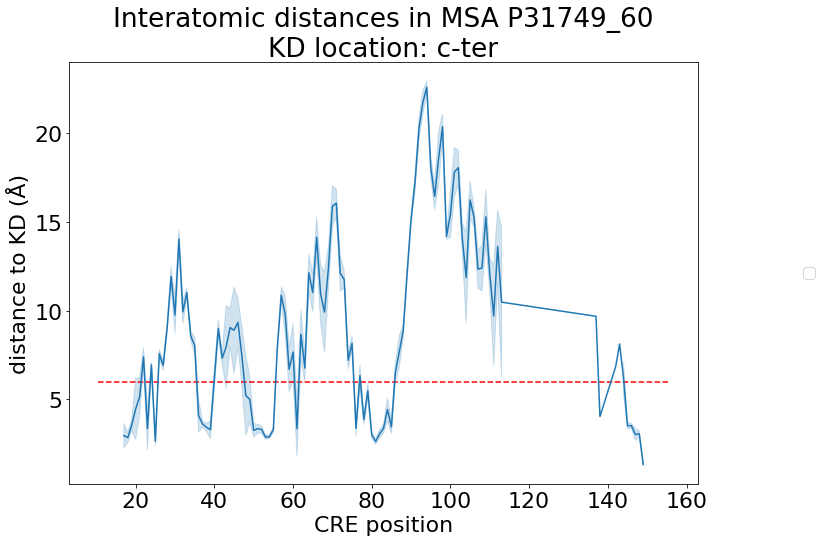

No handles with labels found to put in legend.


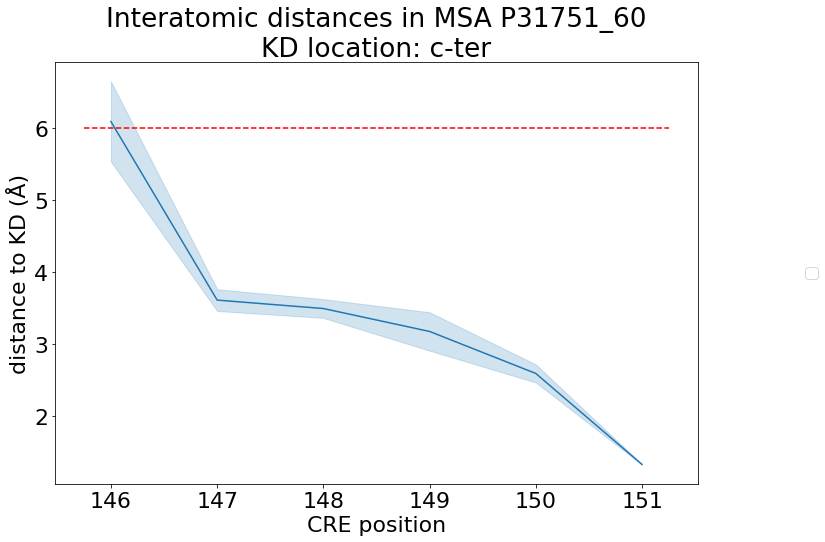

No handles with labels found to put in legend.


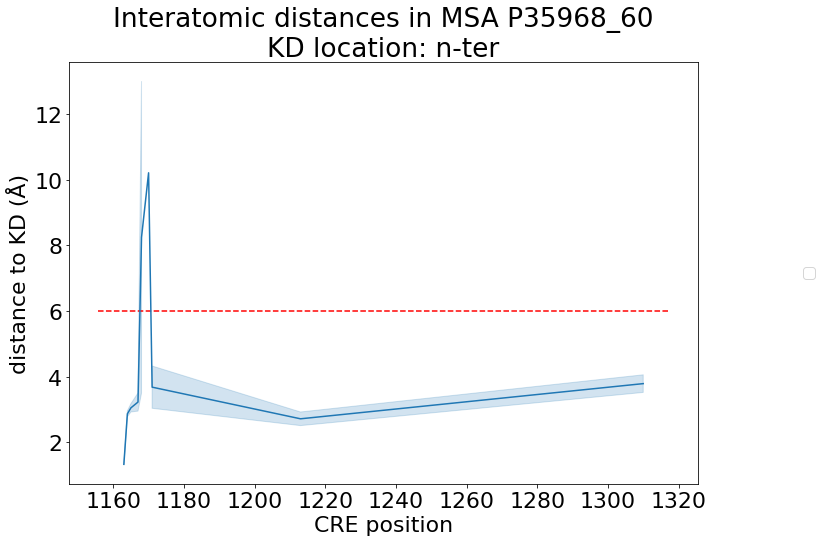

No handles with labels found to put in legend.


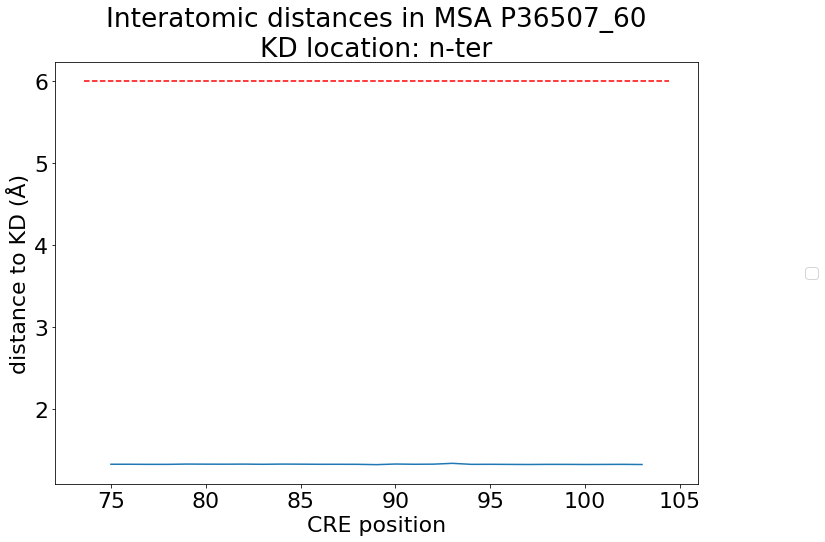

No handles with labels found to put in legend.


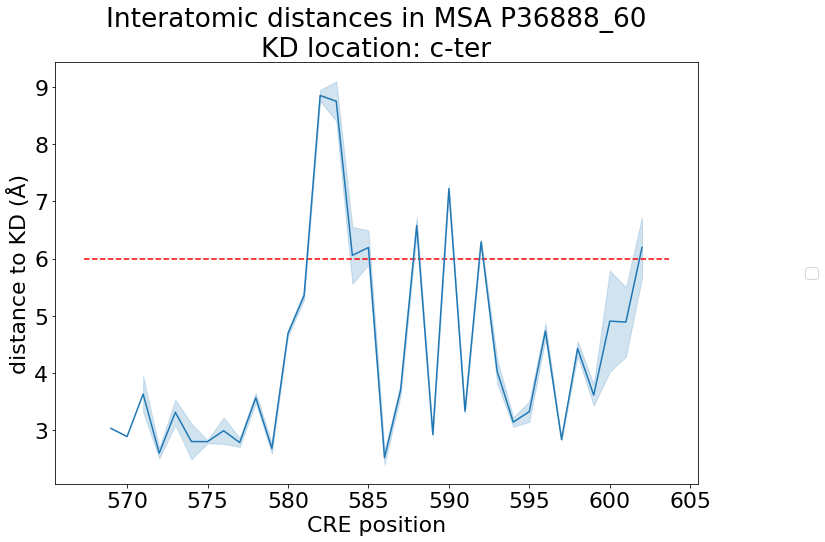

No handles with labels found to put in legend.


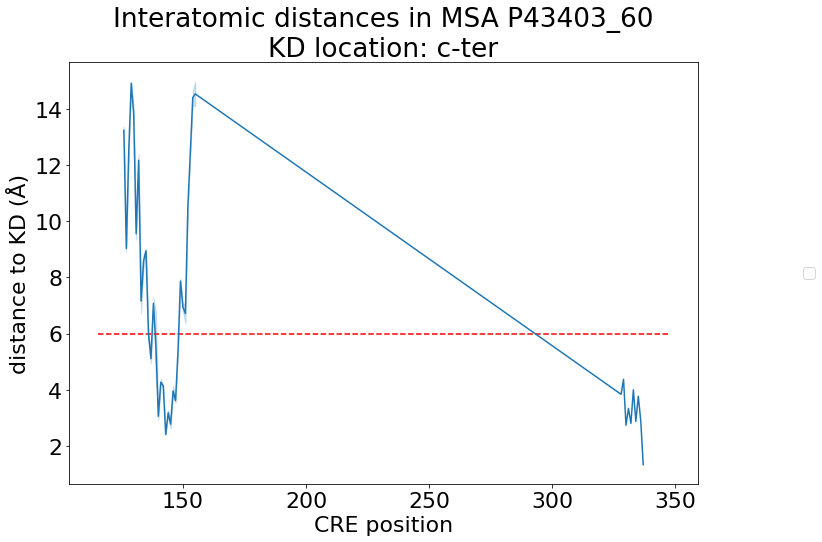

No handles with labels found to put in legend.


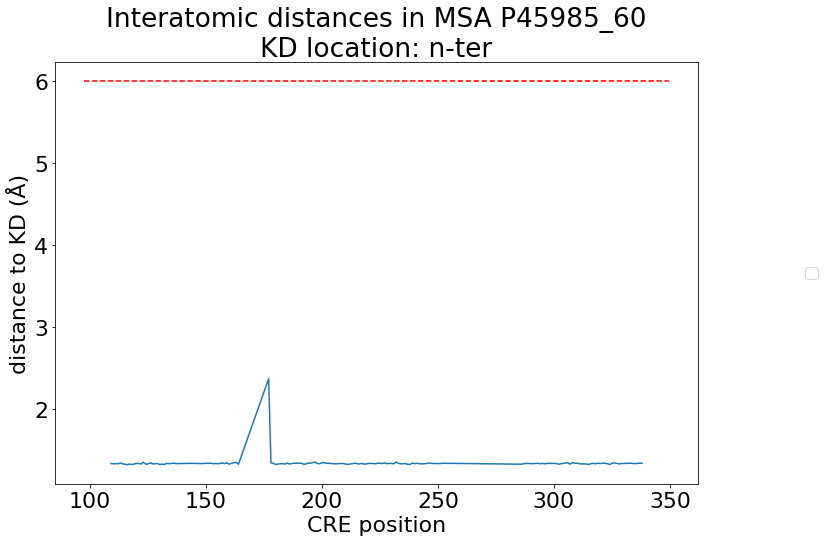

No handles with labels found to put in legend.


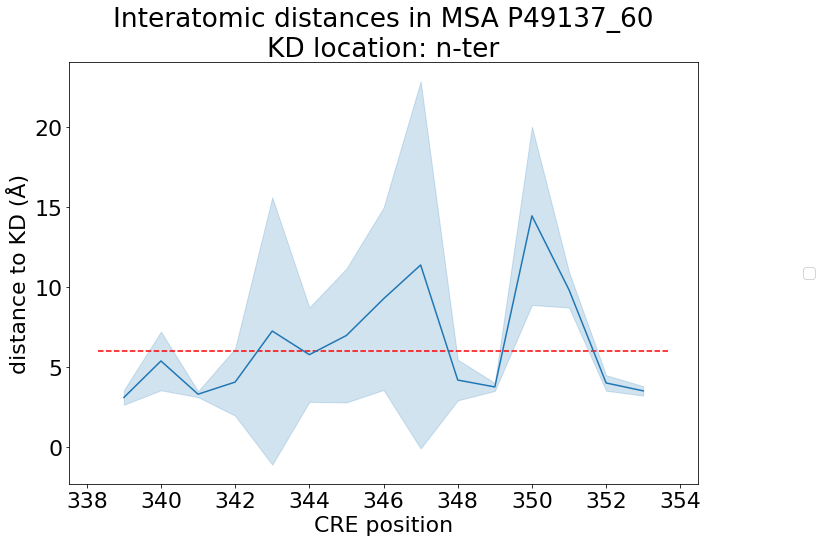

No handles with labels found to put in legend.


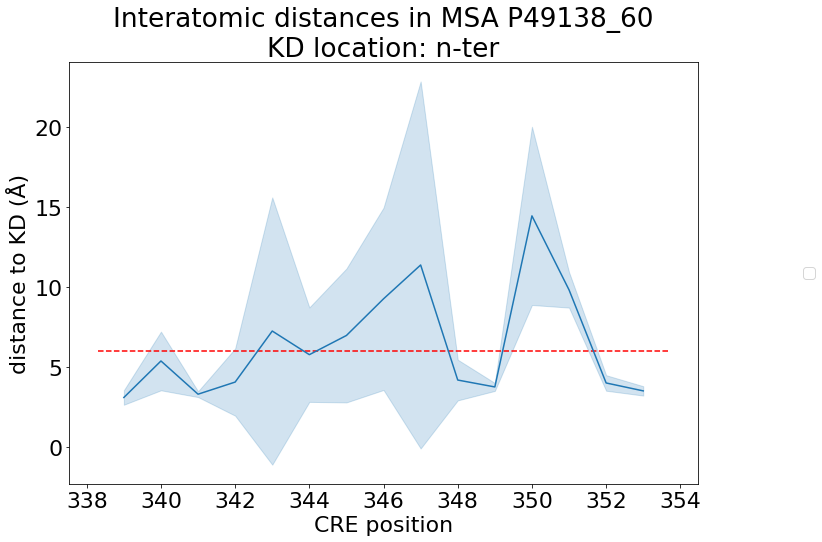

No handles with labels found to put in legend.


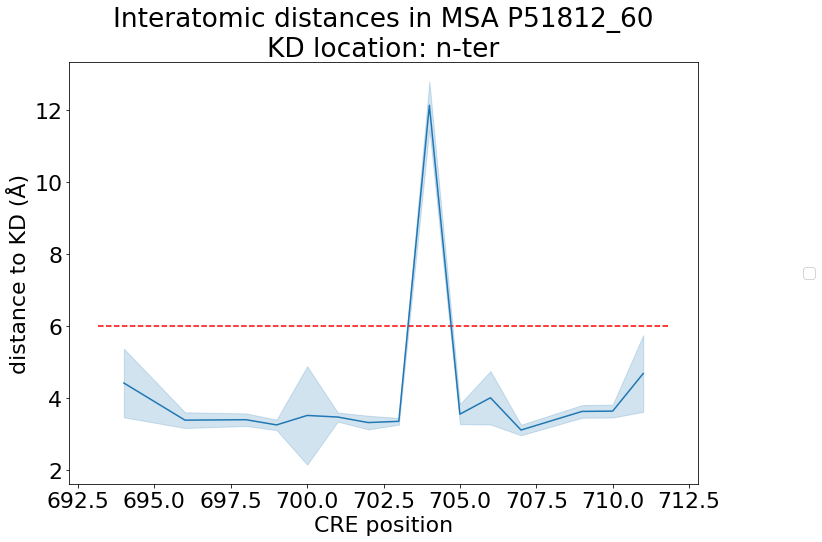

No handles with labels found to put in legend.


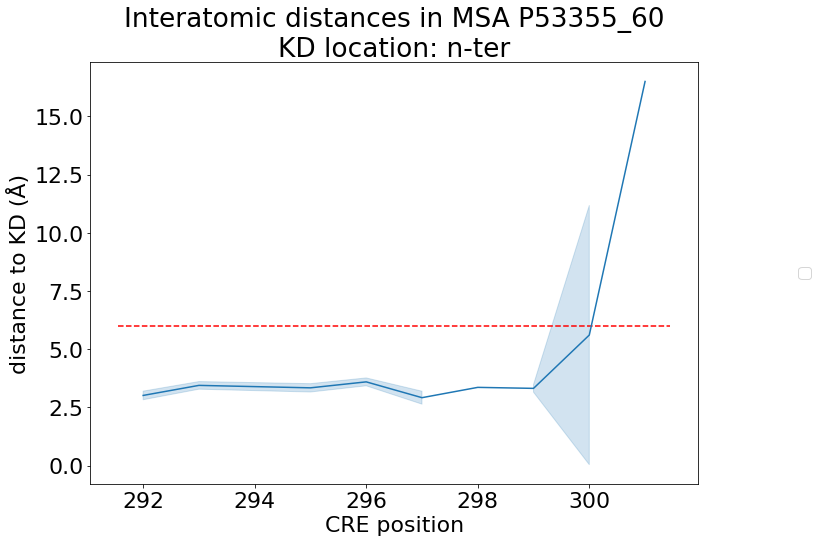

No handles with labels found to put in legend.


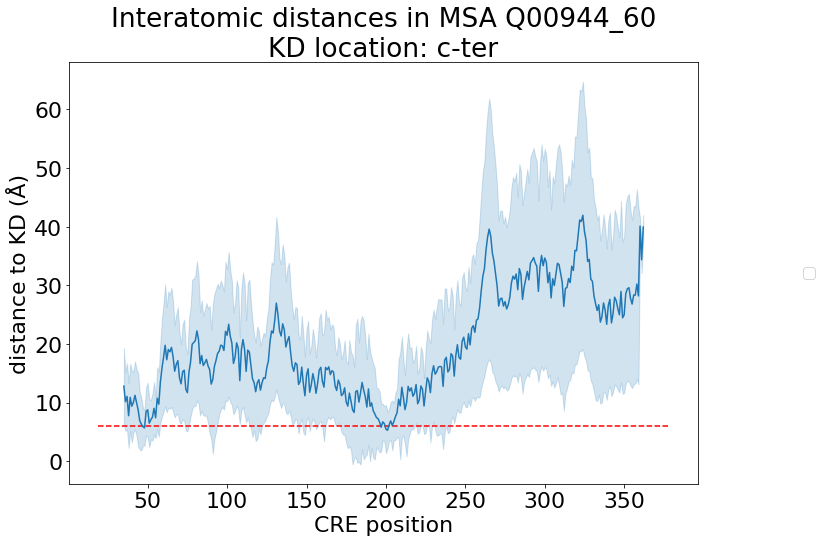

No handles with labels found to put in legend.


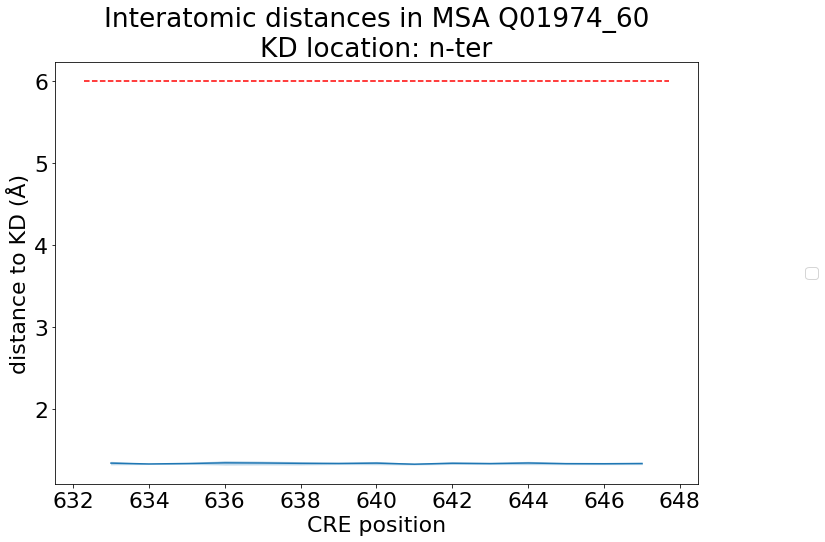

No handles with labels found to put in legend.


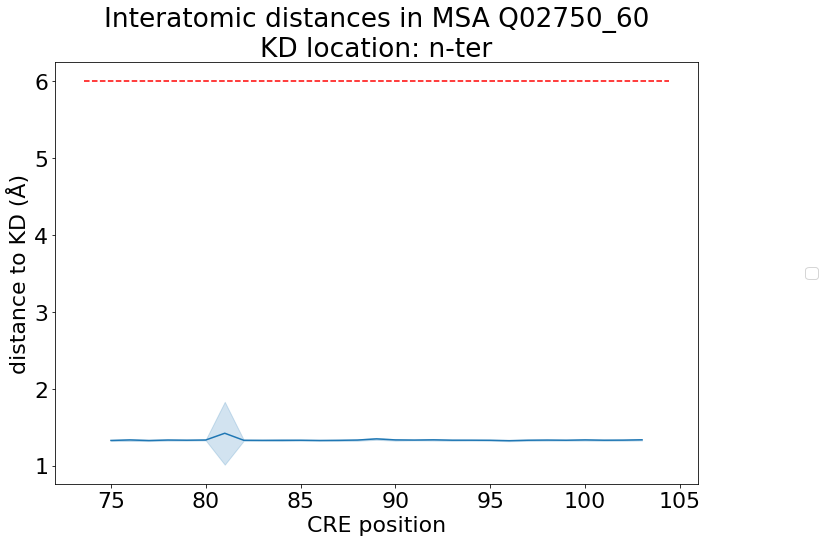

No handles with labels found to put in legend.


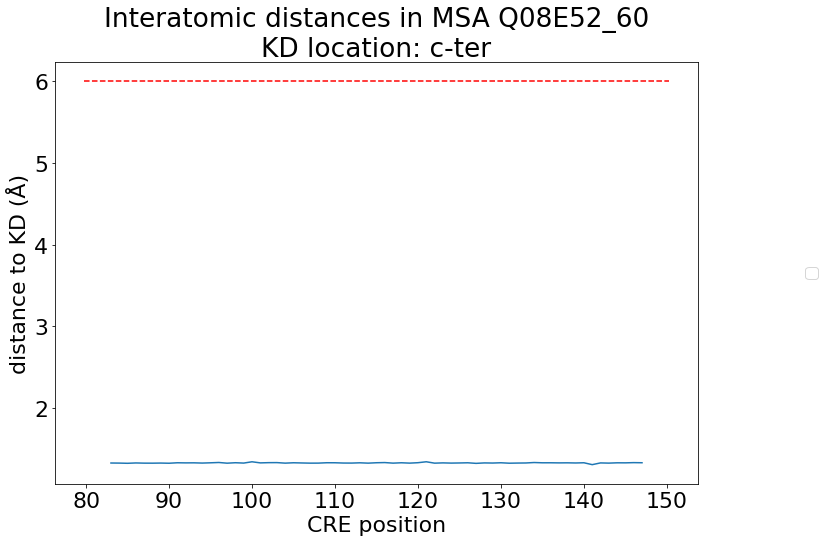

No handles with labels found to put in legend.


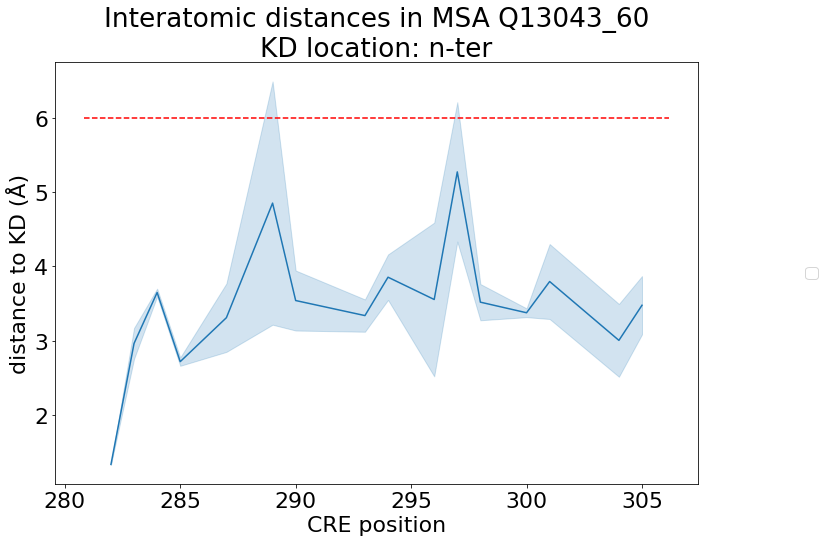

No handles with labels found to put in legend.


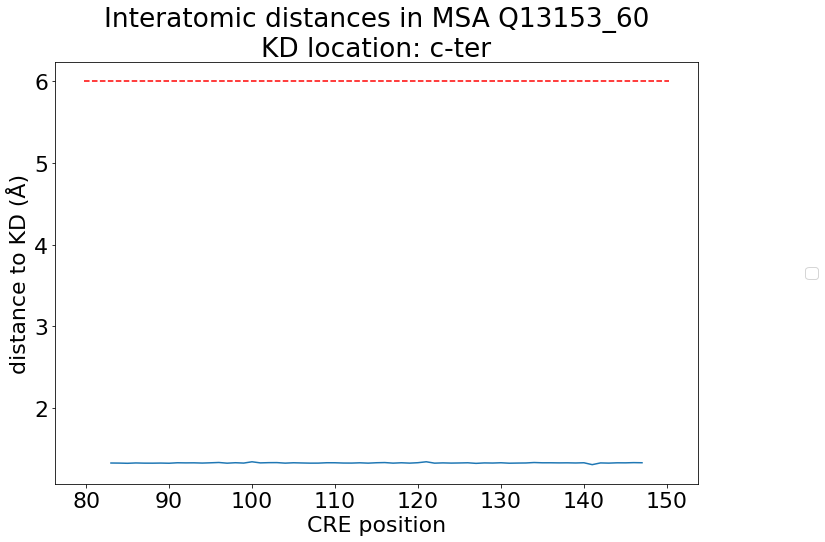

No handles with labels found to put in legend.


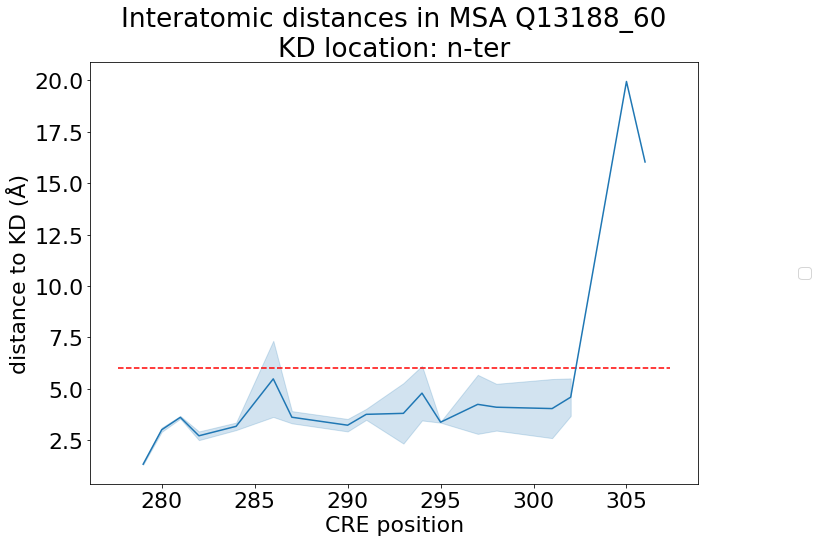

No handles with labels found to put in legend.


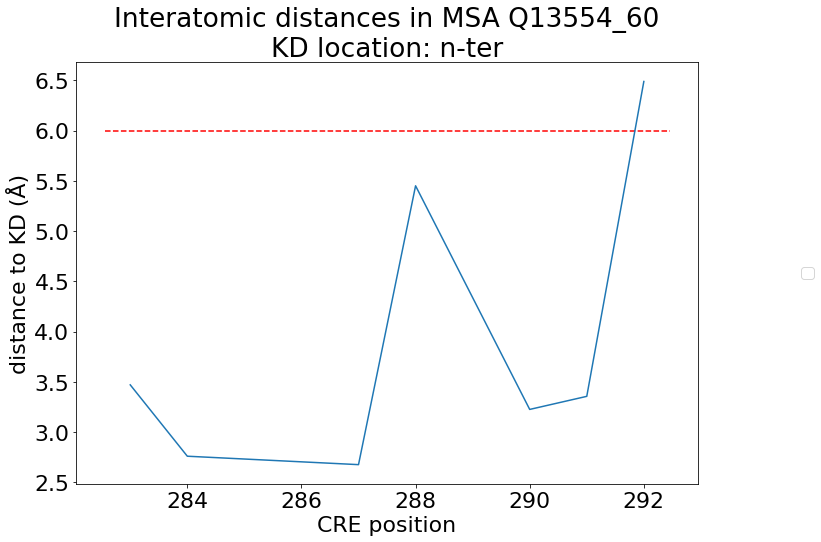

No handles with labels found to put in legend.


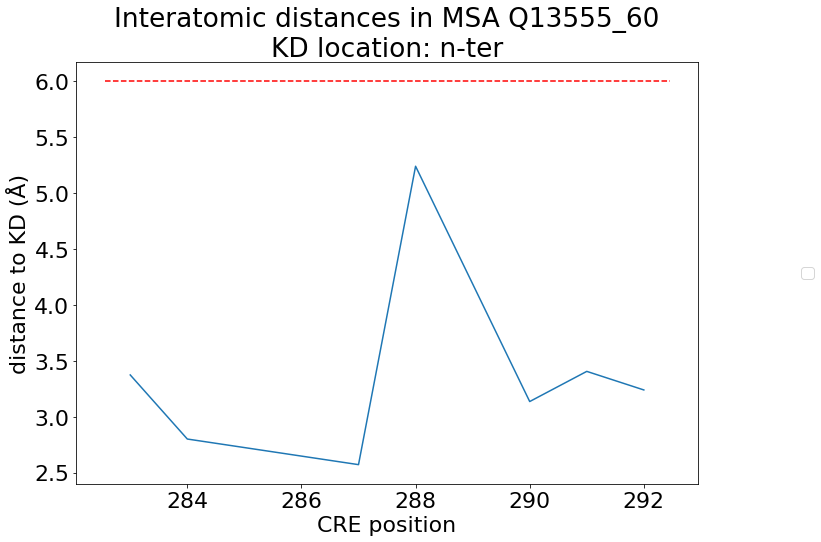

No handles with labels found to put in legend.


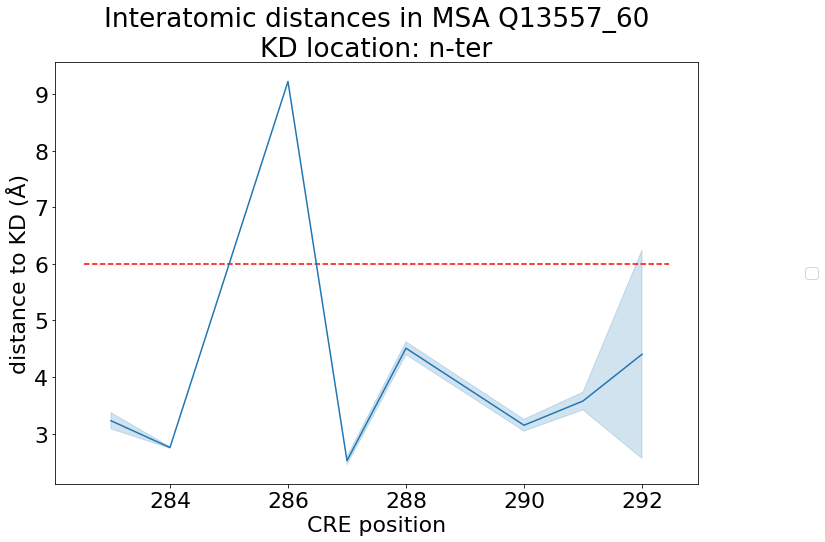

No handles with labels found to put in legend.


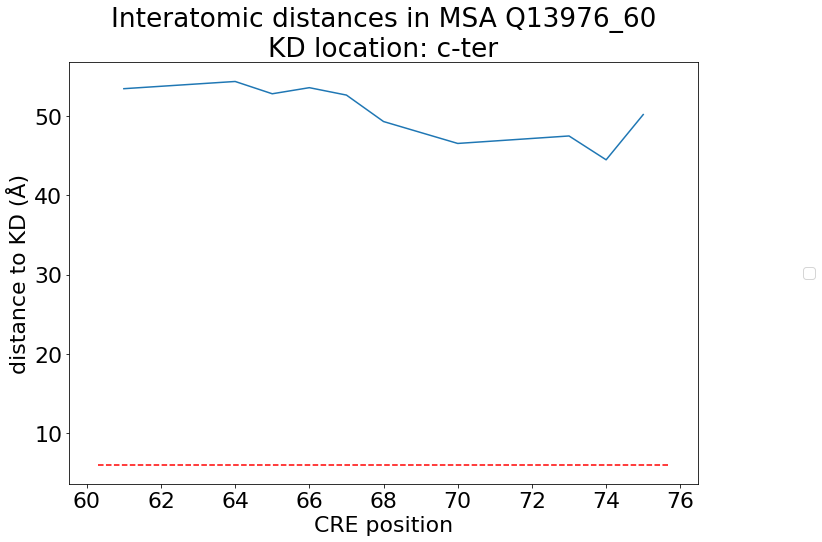

No handles with labels found to put in legend.


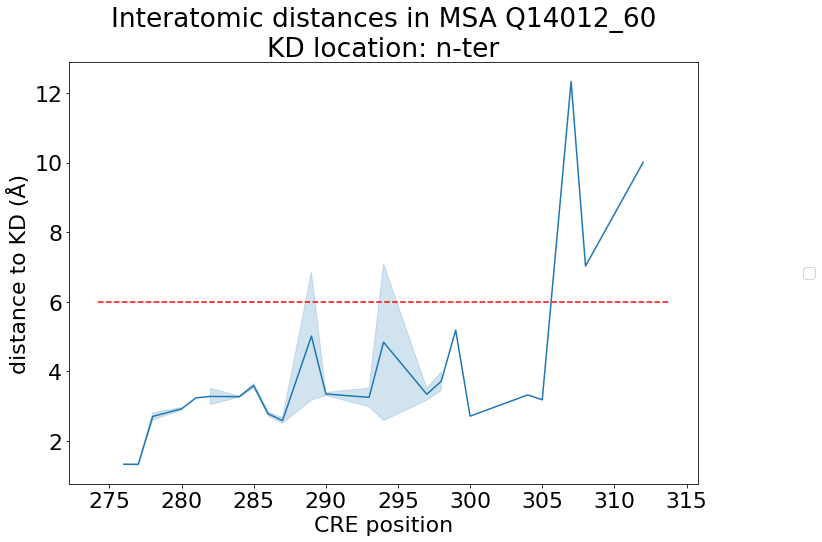

No handles with labels found to put in legend.


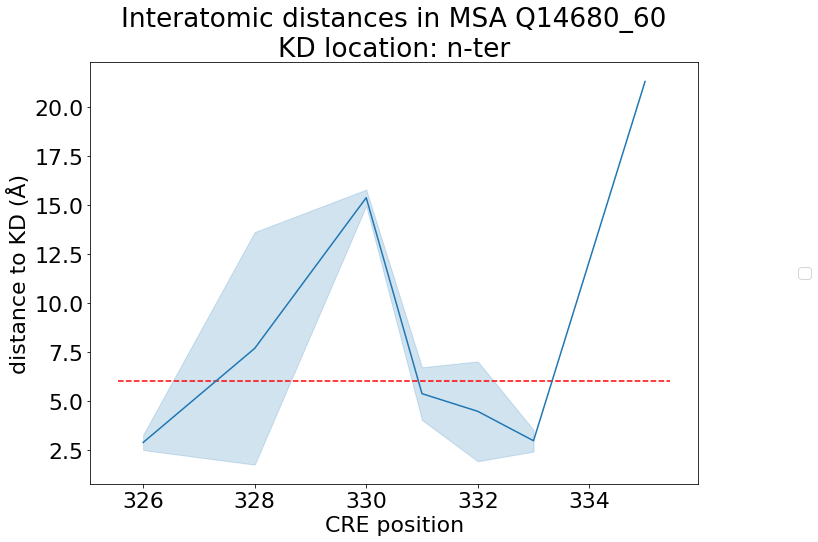

No handles with labels found to put in legend.


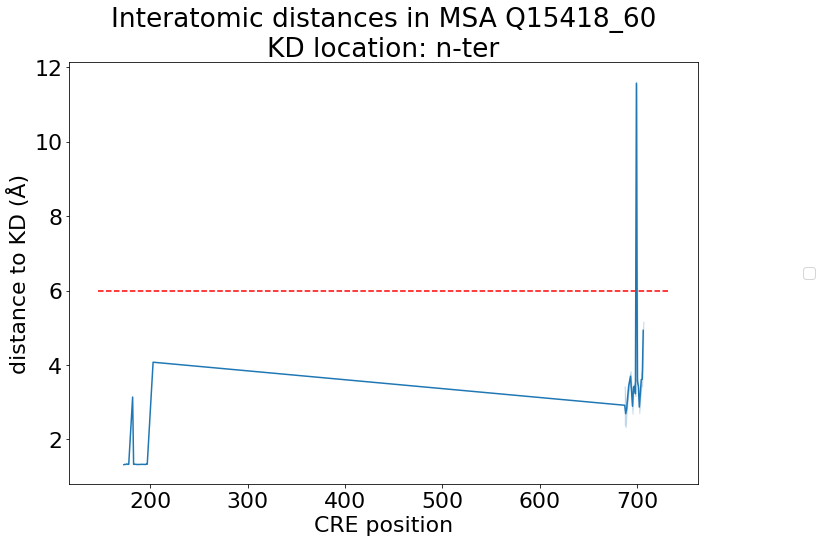

No handles with labels found to put in legend.


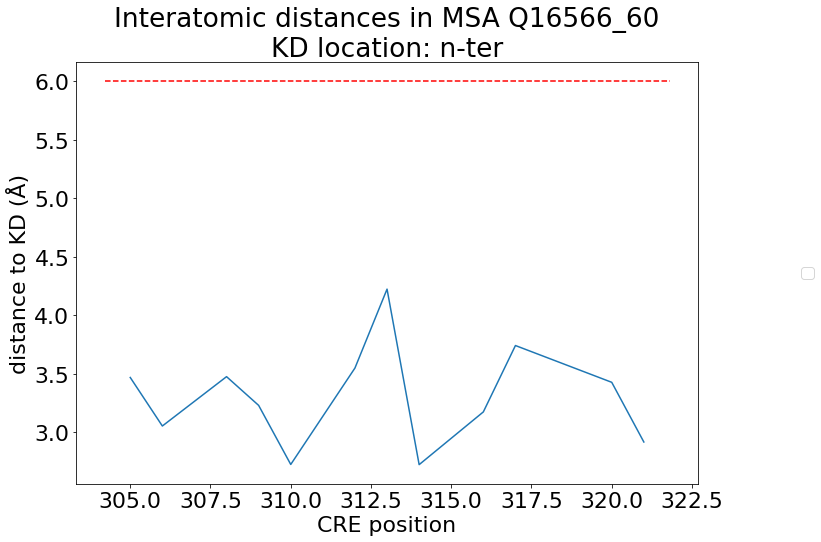

No handles with labels found to put in legend.


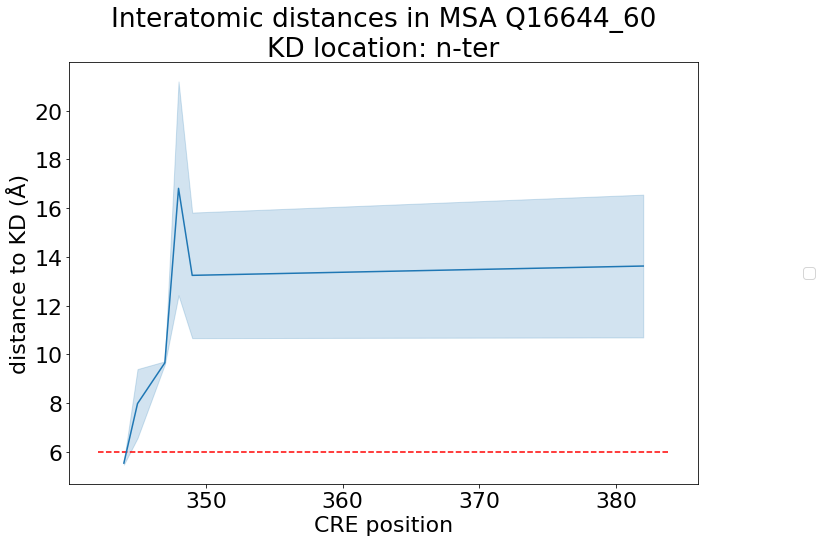

No handles with labels found to put in legend.


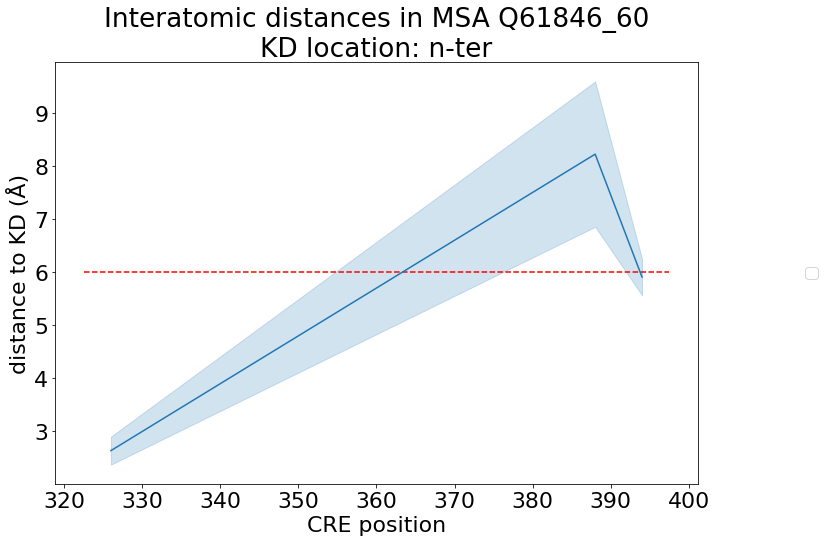

No handles with labels found to put in legend.


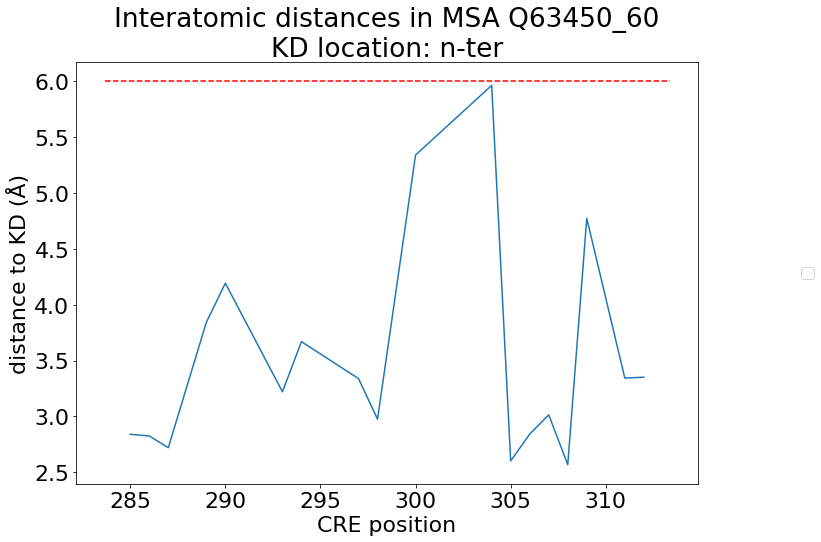

No handles with labels found to put in legend.


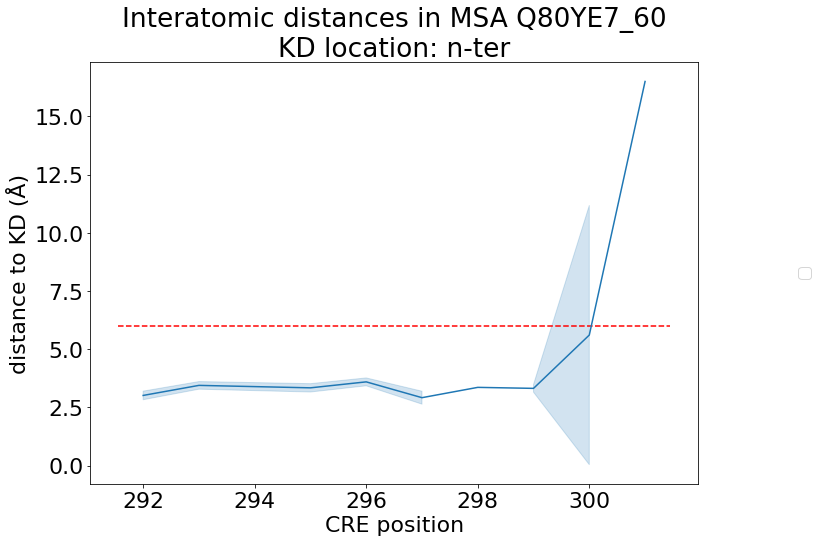

No handles with labels found to put in legend.


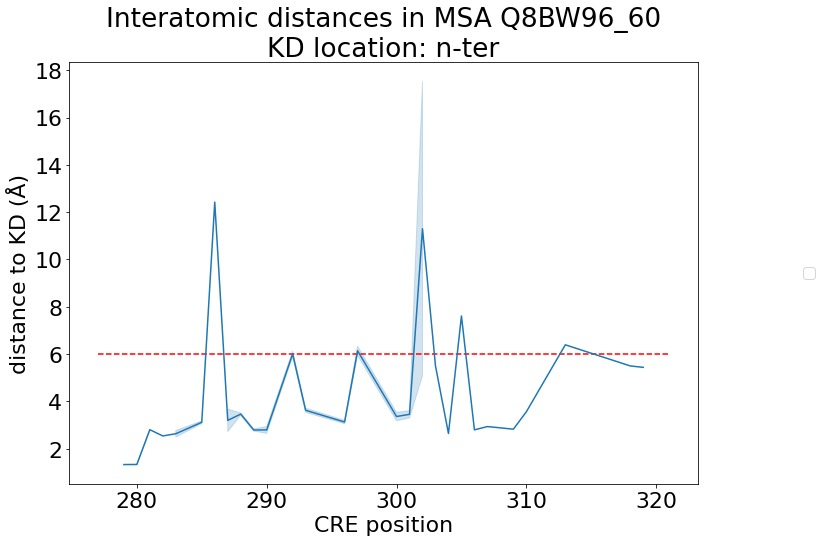

No handles with labels found to put in legend.


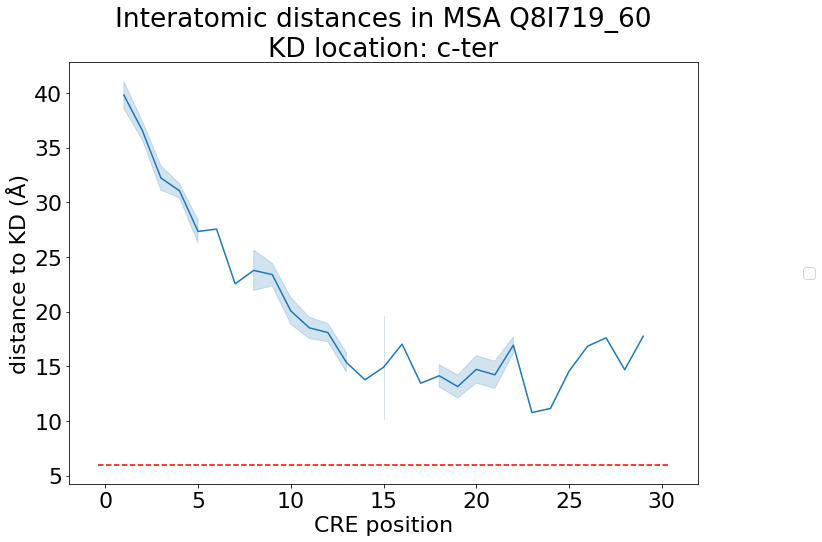

No handles with labels found to put in legend.


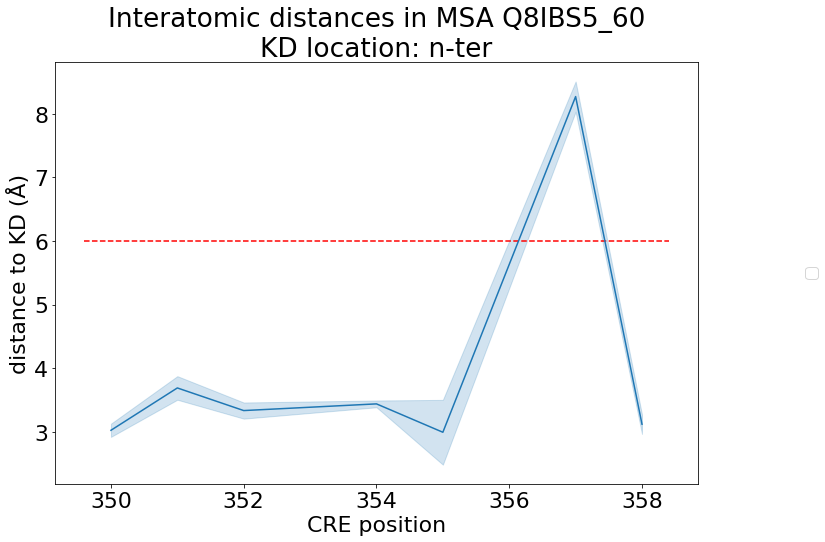

No handles with labels found to put in legend.


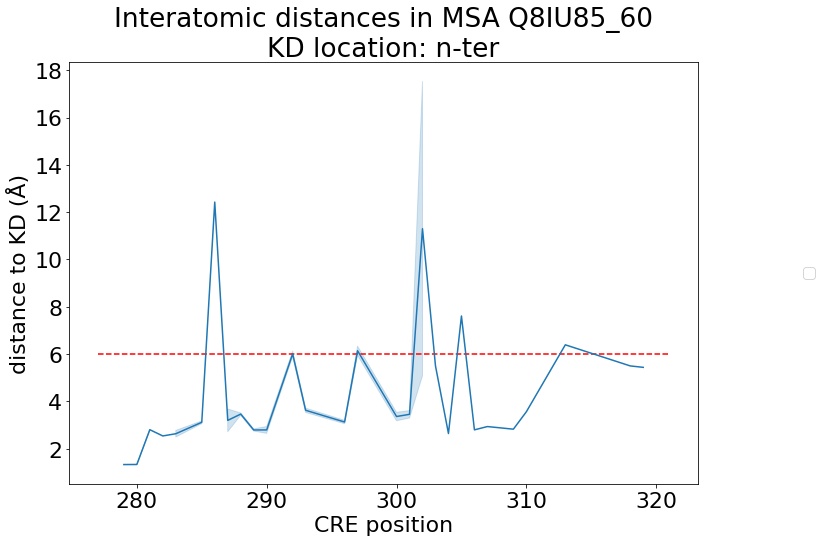

No handles with labels found to put in legend.


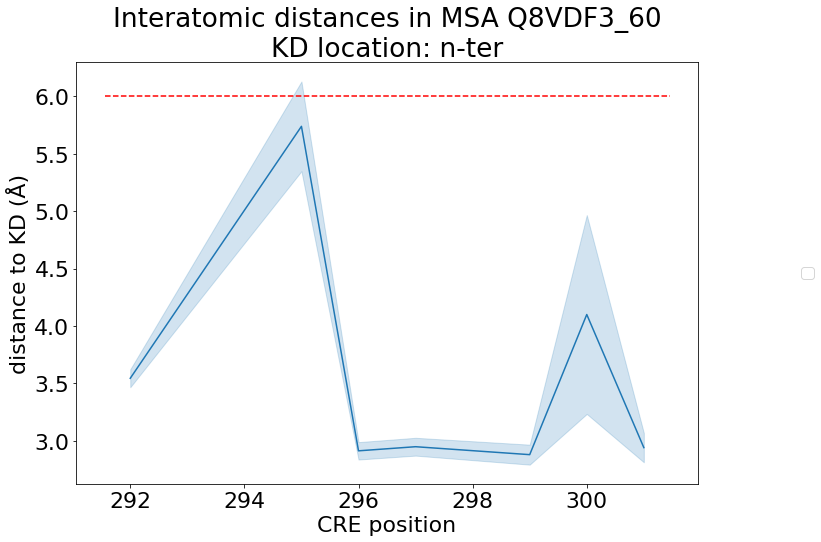

No handles with labels found to put in legend.


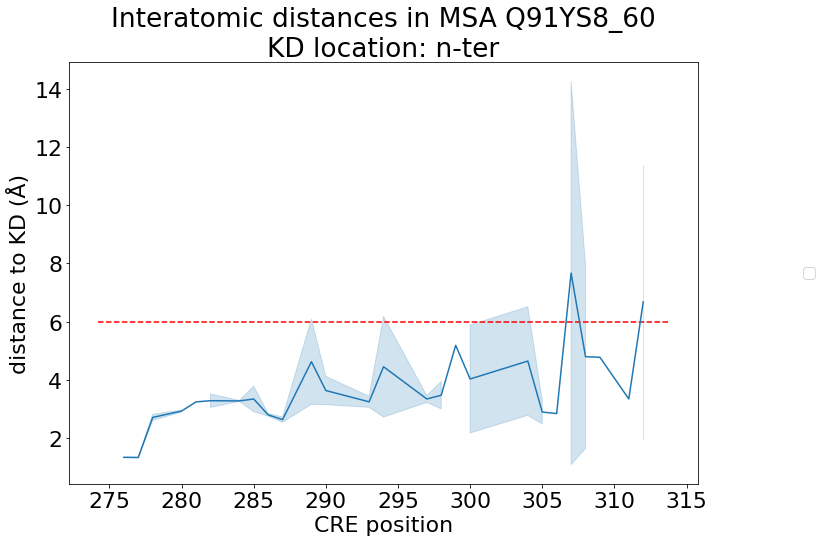

No handles with labels found to put in legend.


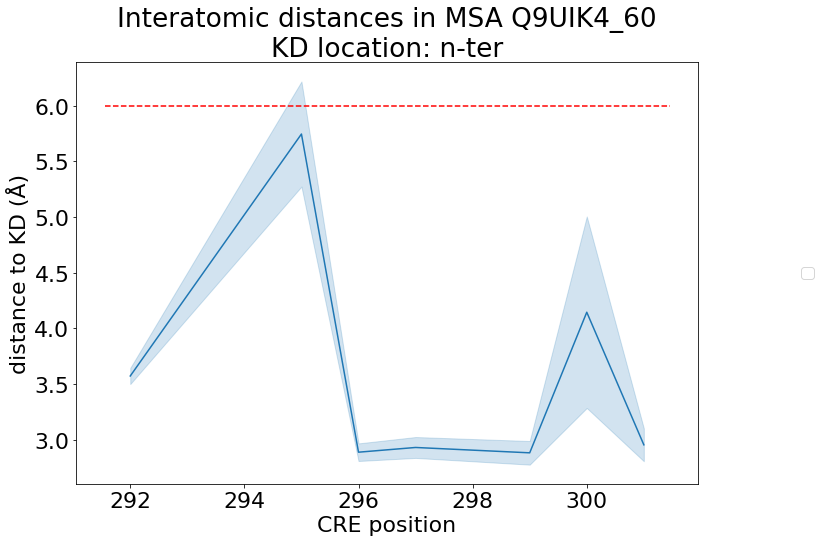

In [66]:
# Shortest distance in CRE positions, showing one curve per MSA
# Group by pdb col
grouped_df = all_shortest_distances_mapped.groupby('msa')

if grouped_df.msa.unique()[0] == 'P00519_60':
    to_check = grouped_df
# Iterate over each unique pdb value and create a separate figure
for pdb, group in grouped_df:
    # Create a new figure for each pdb
    plt.figure(figsize= (12,8), facecolor= 'white')

    fig = sns.lineplot(data= group, x= 'pos_cre_uniprot', y= 'dist', ci= 'sd')
    plt.title(f"Interatomic distances in MSA {group.msa.unique()[0]}\nKD location: {group.kd_location.values[0]}")
    plt.xlabel("CRE position")
    plt.ylabel("distance to KD (Å)")
    plt.rcParams['font.size'] = 22

    # # Set the x-axis limits as the minimun and max residue in the MSA
    # xmin = to_calculate[to_calculate.msa == msa].pdb_start_cre.min()
    # xmax = to_calculate[to_calculate.msa == msa].pdb_end_cre.max()
    # print(xmin, xmax)

    # plt.xlim([xmin, xmax])
    plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], colors= 'r', linestyles= "--")
    plt.legend(loc='center right', bbox_to_anchor=(1.20, 0.5), prop={'size': 16})
    plt.tight_layout()
    #plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
    plt.show()

In [67]:
to_check

NameError: name 'to_check' is not defined

In [66]:
to_calculate[to_calculate.msa == "Q14012_60"]

,msa,uniprot,pdb,chain,term_id_cre,start_cre,end_cre,term_id_kd,start_kd,end_kd,pdb_start_cre,pdb_end_cre,pdb_start_kd,pdb_end_kd
985,Q14012_60,Q14012,4fg7,A,cre135,276,316,kd133,20,276,276,277,20,276
987,Q14012_60,Q14012,4fg9,A,cre135,276,316,kd133,20,276,276,314,20,276
989,Q14012_60,Q14012,4fg8,A,cre135,276,316,kd133,20,276,276,299,20,276
991,Q14012_60,Q14012,4fgb,A,cre135,276,316,kd133,20,276,276,299,20,276


In [83]:
region_to_transfer = pd.read_csv('../homology_transfer/pipeline_MSA_uniprot/data_snake/12_region_to_transfer.txt', sep= " ")
region_to_transfer[(region_to_transfer.ref_uniprot_acc == 'P31749') & (region_to_transfer.full_identity == '60')]

,ref_uniprot_acc,ref_start,ref_end,method,full_identity,region_identity,quality_full,quality_region,uniprot_acc,start,end,term_id
45185,P31749,17,149,clustalO,60,60,1.0,1.0,A0A3Q0S6Y5,1,110,cre72
45186,P31749,17,149,clustalO,60,all,1.0,1.0,A0A3Q0S6Y5,1,110,cre72
45188,P31749,17,149,clustalO,60,60,1.0,1.0,A0A672I3J0,1,126,cre72
45189,P31749,17,149,clustalO,60,all,1.0,1.0,A0A672I3J0,1,126,cre72
45193,P31749,17,149,clustalO,60,60,1.0,1.0,G3U9P4,2,127,cre72
...,...,...,...,...,...,...,...,...,...,...,...,...
46211,P31749,150,408,clustalO,60,80,1.0,1.0,A0A452QY12,164,422,kd72
46212,P31749,150,408,clustalO,60,all,1.0,1.0,A0A452QY12,164,422,kd72
46216,P31749,150,408,clustalO,60,60,1.0,1.0,A0A671DNU4,166,424,kd72
46217,P31749,150,408,clustalO,60,80,1.0,1.0,A0A671DNU4,166,424,kd72


In [84]:
msa_regions_pdbs[msa_regions_pdbs.msa == 'P31749_60']

,msa,uniprot,start_cre,end_cre,term_id_cre,length_cre,pdb,start_pdb,end_pdb,overlap_cre,start_kd,end_kd,term_id_kd,length_kd,overlap_kd,no_seqs,no_pdbs
511,P31749_60,P31749,17,149,cre72,133,6hhh,2,439,134,150,408,kd72,259,260,70,28
512,P31749_60,P31749,17,149,cre72,133,3o96,2,429,134,150,408,kd72,259,260,70,28
513,P31749_60,P31749,17,149,cre72,133,6hhg,3,444,134,150,408,kd72,259,260,70,28
514,P31749_60,P31749,17,149,cre72,133,6hhi,3,444,134,150,408,kd72,259,260,70,28
515,P31749_60,P31749,17,149,cre72,133,6hhj,3,444,134,150,408,kd72,259,260,70,28
516,P31749_60,P31749,17,149,cre72,133,6s9w,3,444,134,150,408,kd72,259,260,70,28
517,P31749_60,P31749,17,149,cre72,133,7nh5,3,444,134,150,408,kd72,259,260,70,28
518,P31749_60,P31749,17,149,cre72,133,6s9x,3,443,134,150,408,kd72,259,260,70,28
519,P31749_60,P31749,17,149,cre72,133,6hhf,3,439,134,150,408,kd72,259,260,70,28
520,P31749_60,P31749,17,149,cre72,133,7apj,3,439,134,150,408,kd72,259,260,70,28


In [89]:
pdb_sequences = pd.read_csv('../datasets/pdb_sequences.tsv', sep= '\t')
pdb_sequences[pdb_sequences.pdb.isin(to_calculate[to_calculate.msa == 'P31749_60'].pdb)][['pdb', 'sequence']]

,pdb,sequence
193,3cqu,RVTMNEFEYLKLLGKGTFGKVILVKEKATGRYYAMKILKKEVIVAK...
194,3cqu,GRPRTTSFAE
195,3cqw,RVTMNEFEYLKLLGKGTFGKVILVKEKATGRYYAMKILKKEVIVAK...
196,3cqw,GRPRTTSFAE
289,3mv5,RVTMNEFEYLKLLGKGTFGKVILVKEKATGRYYAMKILKKEVIVAK...
290,3mv5,GRPRTTSFAE
291,3mvh,VTMNEFEYLKLLGKGTFGKVILVKEKATGRYYAMKILKKEVIVAKD...
292,3mvh,GRPRTTSFAE
293,3o96,SDVAIVKEGWLHKRGEYIKTWRPRYFLLKNDGTFIGYKERPQDVEA...
294,3ocb,RVTMNEFEYLKLLGKGTFGKVILVKEKATGRYYAMKILKKEVIVAK...


In [90]:
to_calculate[to_calculate.msa == 'P45985_60']

,msa,uniprot,pdb,chain,term_id_cre,start_cre,end_cre,term_id_kd,start_kd,end_kd,pdb_start_cre,pdb_end_cre,pdb_start_kd,pdb_end_kd
664,P45985_60,P45985,3vut,A,cre85,109,136,kd84,102,367,142,337,142,367
665,P45985_60,P45985,3aln,A,cre85,109,136,kd84,102,367,109,136,102,367
666,P45985_60,P45985,3alo,A,cre85,109,136,kd84,102,367,109,136,102,367


In [77]:
to_calculate_prueba =  to_calculate[to_calculate.msa == 'P29323_60'] # only keep those chains
to_calculate_prueba

,msa,uniprot,pdb,chain,term_id_cre,start_cre,end_cre,term_id_kd,start_kd,end_kd,pdb_start_cre,pdb_end_cre,pdb_start_kd,pdb_end_kd
563,P29323_60,P29323,3zfm,A,cre71,588,621,kd71,621,884,615,621,621,884


In [78]:
df = pd.read_csv(path + "3zfm.csv")
interv1 = pd.Interval(to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0], to_calculate[to_calculate.pdb == pdb].pdb_end_cre.values[0], closed= 'both')
interv2a = pd.Interval(df.pos_a.min(), df.pos_a.max(), closed= 'both')
interv2b = pd.Interval(df.pos_b.min(), df.pos_b.max(), closed= 'both')
print(f"interv1: {interv1}\ninterv2a: {interv2a}\ninterv2b: {interv2b}")

# Chains to keep
chains = to_calculate[(to_calculate.msa == 'P43403_60') & (to_calculate.pdb == '2ozo')].chain.to_list()
print(chains)

df[(df.chain_a.isin(chains)) & (df.chain_b.isin(chains)) ]

interv1: [17, 142]
interv2a: [615, 621]
interv2b: [621, 884]
['A', 'A']


,chain_a,pos_a,aa_a,atom_a,chain_b,pos_b,aa_b,atom_b,dist,pdb
0,A,615,GLU,C,A,621,VAL,CG2,8.361537,3zfm
1,A,615,GLU,C,A,622,LYS,N,12.932220,3zfm
2,A,615,GLU,C,A,623,ILE,CG1,14.983638,3zfm
3,A,615,GLU,C,A,624,GLU,N,18.272991,3zfm
4,A,615,GLU,CB,A,625,GLN,O,19.992111,3zfm
...,...,...,...,...,...,...,...,...,...,...
1625,A,621,VAL,CG1,A,880,LEU,CD1,35.240627,3zfm
1626,A,621,VAL,CG2,A,881,ASP,OD1,35.721947,3zfm
1627,A,621,VAL,CG2,A,882,LYS,N,40.715591,3zfm
1628,A,621,VAL,CG1,A,883,MET,SD,40.959404,3zfm


interv1: [17, 142]
interv2a: [126, 155]
interv2b: [338, 600]
126 337


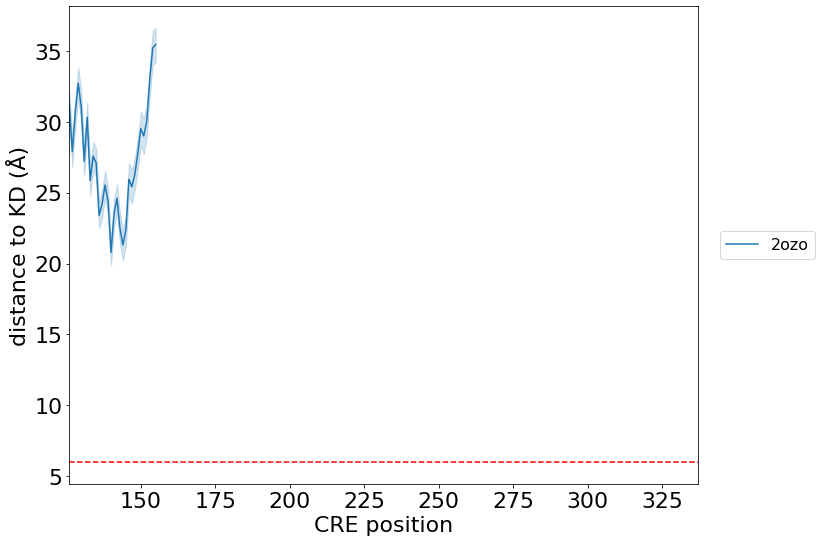

In [71]:
msa = 'P43403_60'
df = pd.read_csv(path + "2ozo.csv")
interv1 = pd.Interval(to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0], to_calculate[to_calculate.pdb == pdb].pdb_end_cre.values[0], closed= 'both')
interv2a = pd.Interval(df.pos_a.min(), df.pos_a.max(), closed= 'both')
interv2b = pd.Interval(df.pos_b.min(), df.pos_b.max(), closed= 'both')
print(f"interv1: {interv1}\ninterv2a: {interv2a}\ninterv2b: {interv2b}")

# Chains to keep
chains = to_calculate[(to_calculate.msa == 'P43403_60') & (to_calculate.pdb == '2ozo')].chain.to_list()
#intervalo =  range(to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0], to_calculate[to_calculate.pdb == pdb].pdb_end_cre.values[0]+1)
subset = df[(df.chain_a.isin(chains)) & (df.chain_b.isin(chains)) ]  #df[df[pos_col].isin(intervalo)]


if interv1.overlaps(interv2a) and not interv1.overlaps(interv2b):
    pos_col = 'pos_a'
else:
    pos_col = 'pos_b'
pos_col  


# Plot the distances
plt.figure(figsize= (12,8), facecolor= 'white')
fig = sns.lineplot(data= subset, x= pos_col, y= 'dist', hue= 'pdb')
#plt.title(f"Interatomic distances in MSA {df.msa.unique()[0]}")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22

# Set the x-axis limits as the minimun and max residue in the MSA
xmin = to_calculate_prueba[to_calculate_prueba.msa == msa].pdb_start_cre.min()
xmax = to_calculate_prueba[to_calculate_prueba.msa == msa].pdb_end_cre.max()
print(xmin, xmax)

plt.xlim([xmin, xmax])
plt.hlines(y= 6, xmin= xmin, xmax= xmax, colors= 'r', linestyles= "--")
plt.legend(loc='center right', bbox_to_anchor=(1.20, 0.5), prop={'size': 16})
plt.tight_layout()
#plt.savefig('../datasets/interatomic_distances_both_regions_kd_cre/plots/cre_lineplots/' + msa + ".png", dpi= 200)
plt.show()

80 252


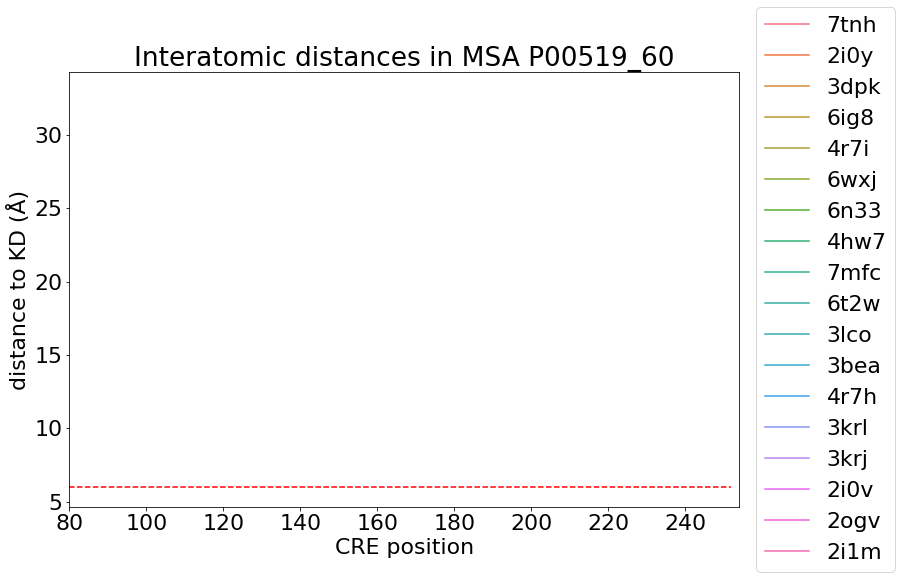

In [102]:
# Plot the distances
plt.figure(figsize= (12,8))
fig = sns.lineplot(data= msa_distances, x= 'pos_a', y= 'dist', hue= 'pdb')
plt.title(f"Interatomic distances in MSA P00519_60")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22

xmin = to_calculate[to_calculate.msa == 'P00519_60'].pdb_start_cre.min()
xmax = to_calculate[to_calculate.msa == 'P00519_60'].pdb_end_cre.max()
print(xmin, xmax)
plt.xlim([xmin, xmax + 2])

plt.hlines(y= 6, xmin= xmin, xmax= xmax, colors= 'r', linestyles= "--")
plt.legend(loc='center right', bbox_to_anchor=(1.25, 0.5))
plt.show()

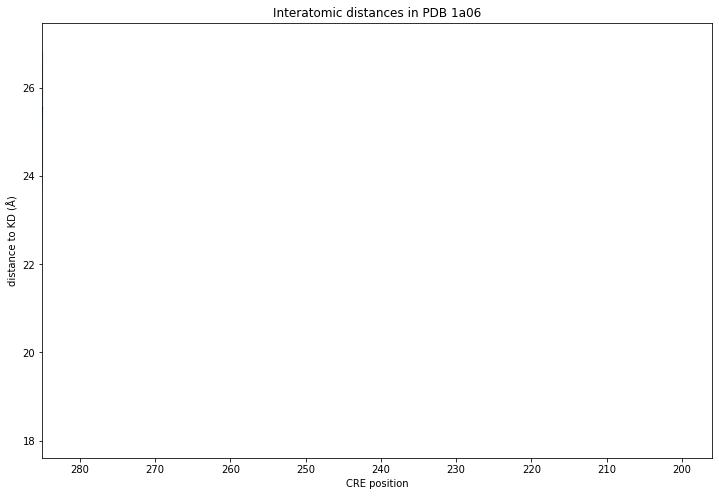

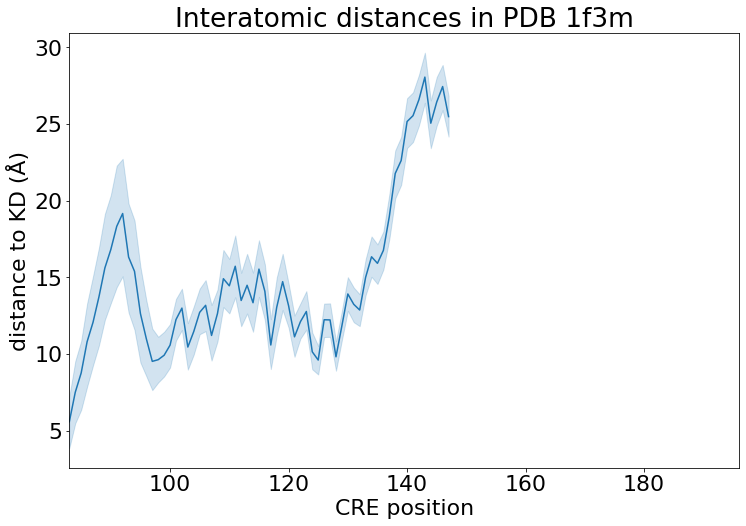

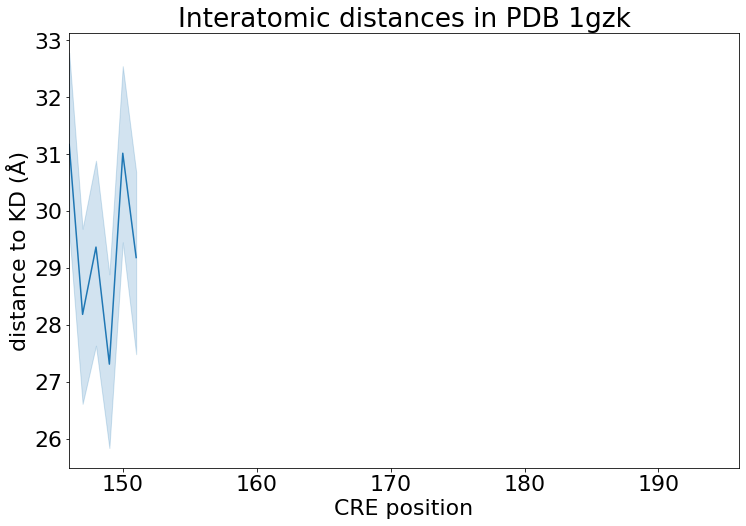

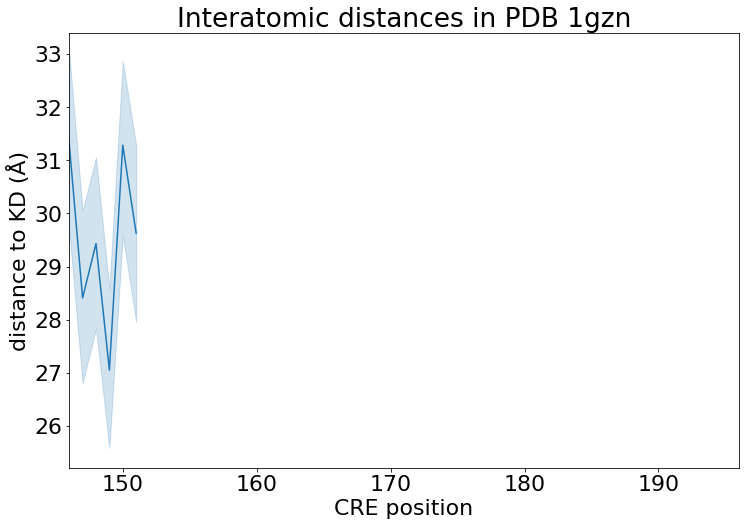

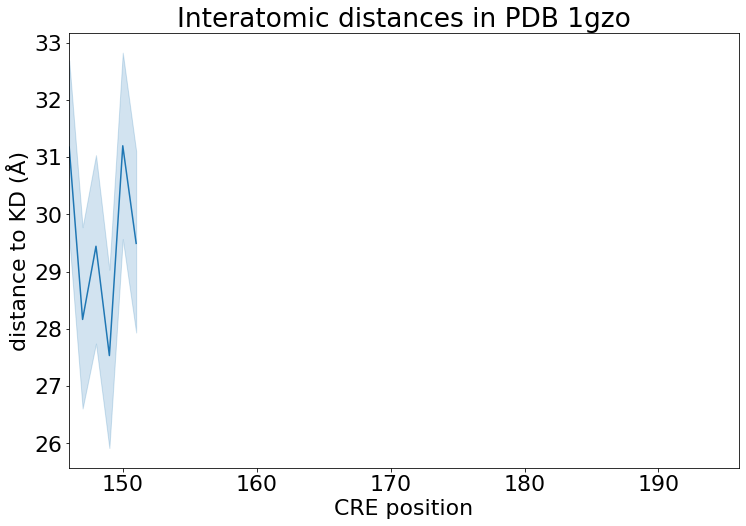

An exception occurred with file 1ig1.csv
An exception occurred with file 1jkl.csv
An exception occurred with file 1jks.csv


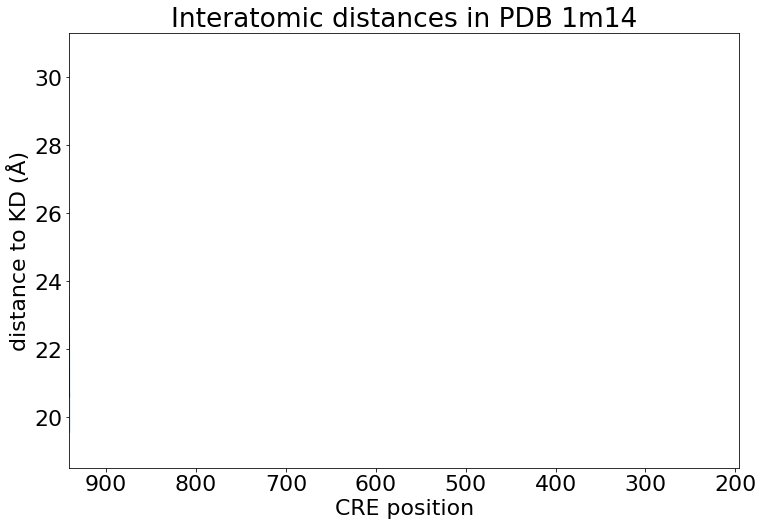

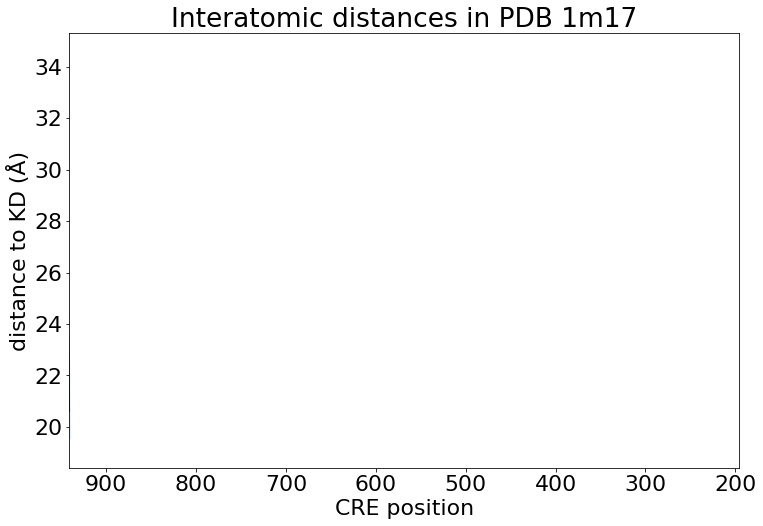

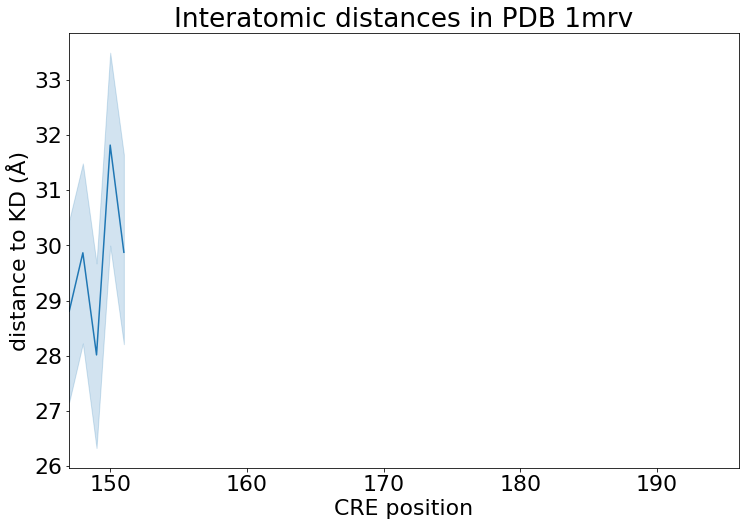

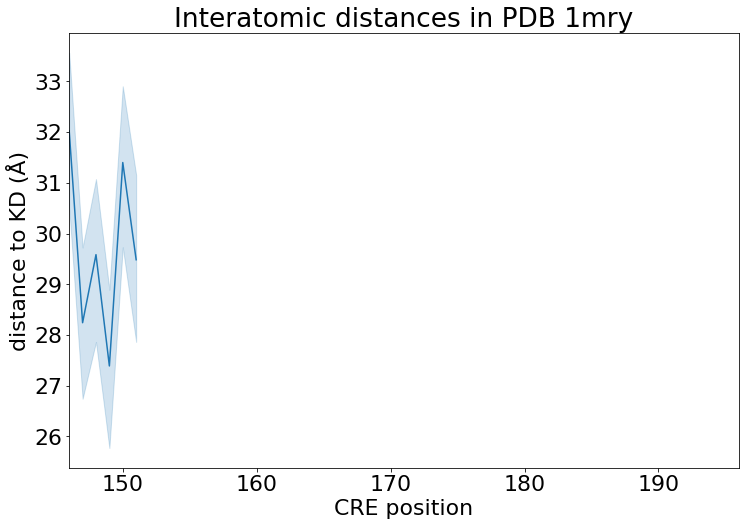

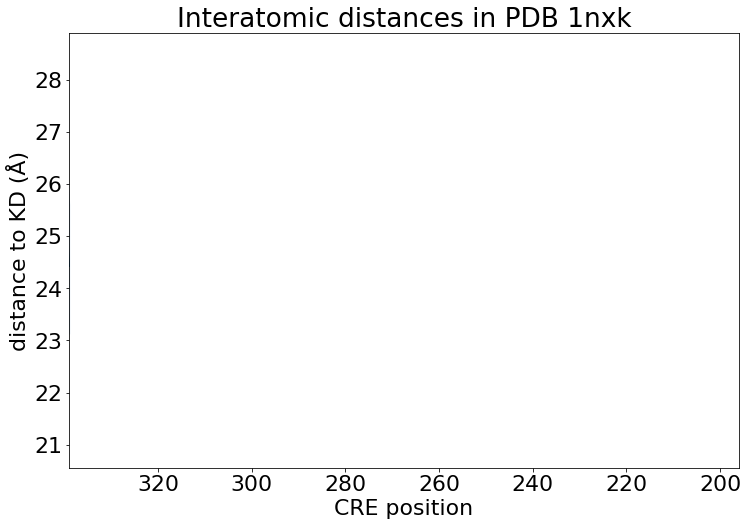

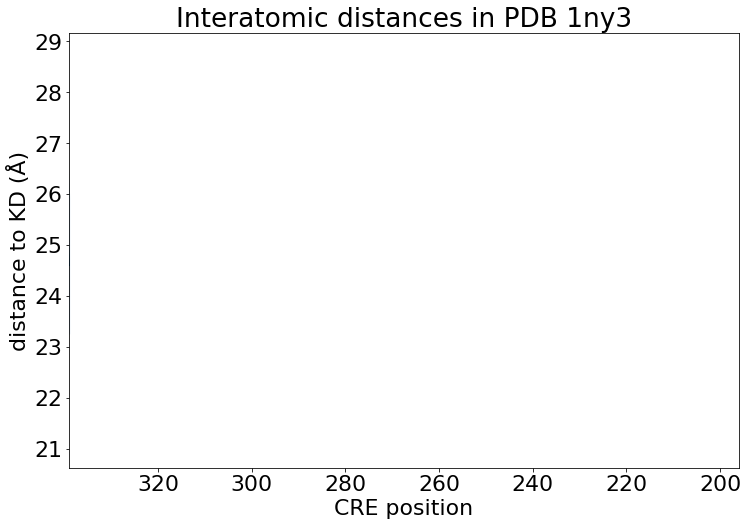

An exception occurred with file 1opl.csv
An exception occurred with file 1p4f.csv


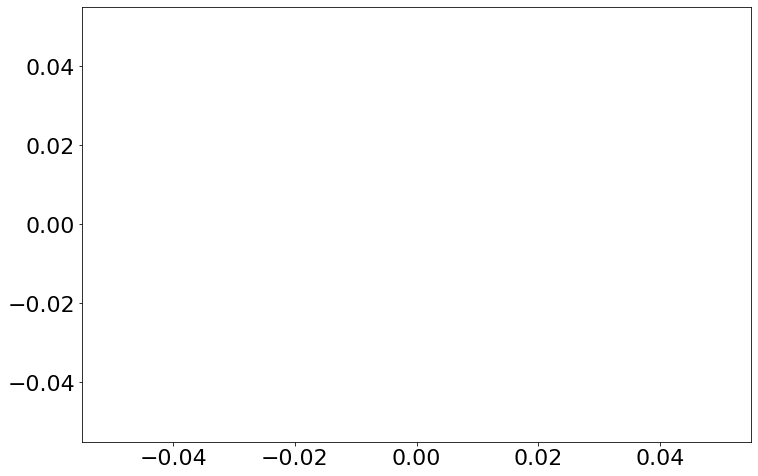

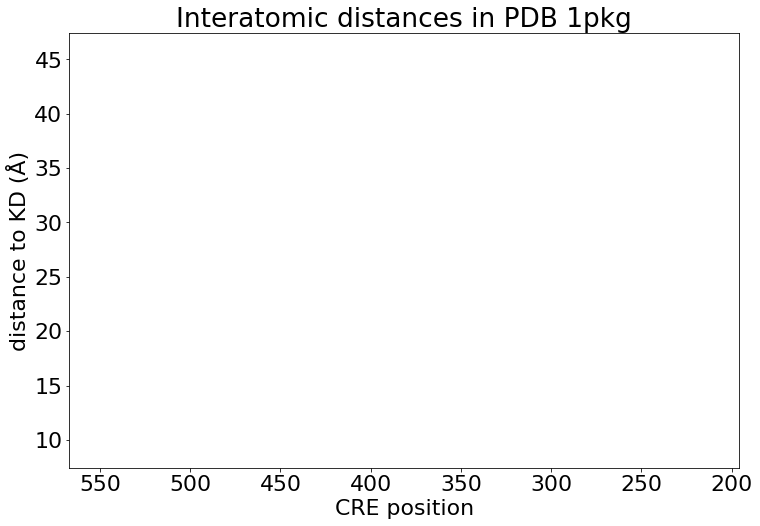

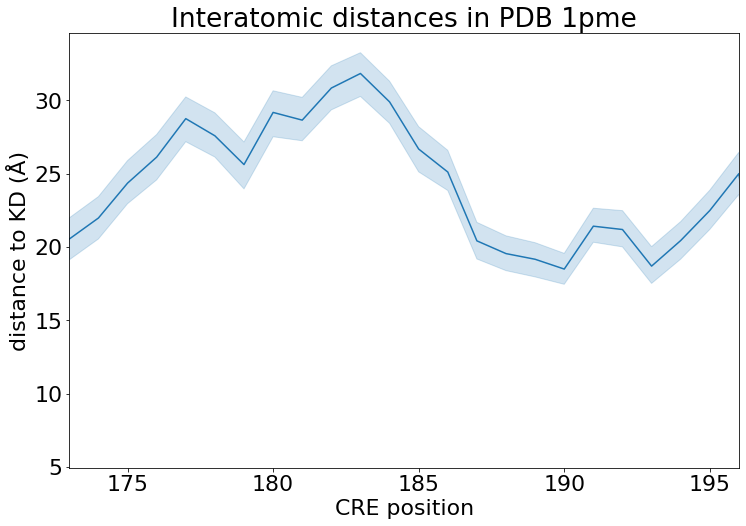

In [5]:
# First, iterate over the distances datasets
path = '../datasets/interatomic_distances_both_regions_kd_cre/'
threshold = 6

# Iterate over the distances result files
for filename in os.listdir(path):
    f = os.path.join(path, filename) # is the complete path to the pdb distances file
    pdb = filename.split(".")[0] # get pdb accesion
    #print(pdb)
    # print(f)

    # Check if file(avoid folders)
    if os.path.isfile(f):
        #print(f'{f} is file')
        try:
            # For each residue, get the mean distance and standard deviation
            df = pd.read_csv(f)
            # # Group the DataFrame by 'pos_a' and find the mean 'dist' value for each group
            # mean_dist = df.groupby('pos_a', as_index= False).agg({'dist':['mean','std']}).sort_values(('dist', 'mean'))
            # mean_dist.columns = ["pos_a", "dist_mean", "dist_std"]
            
            
            # The CRE residues could be either in pos_a or pos_b col. to chose the correct one, make a comparison
            # interv1 in the coordinates of CRE in pdb numbering
            interv1 = pd.Interval(to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0], to_calculate[to_calculate.pdb == pdb].pdb_end_cre.values[0], closed= 'both')
            interv2a = pd.Interval(df.pos_a.min(), df.pos_a.max(), closed= 'both')
            interv2b = pd.Interval(df.pos_b.min(), df.pos_b.max(), closed= 'both')

            if interv1.overlaps(interv2a) and not interv1.overlaps(interv2b):
                pos_col = 'pos_a'
            else:
                pos_col = 'pos_b'
            
            # Plot the distances
            plt.figure(figsize= (12,8))
            fig = sns.lineplot(data= df, x= pos_col, y= 'dist')
            plt.title(f"Interatomic distances in PDB {df.pdb.unique()[0]}")
            plt.xlabel("CRE position")
            plt.ylabel("distance to KD (Å)")
            plt.rcParams['font.size'] = 22
            

            # Adjust the xlim only for CRE residues
            left = to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0]
            right = to_calculate[to_calculate.pdb == '1wzy'].pdb_end_cre.values[0]
            #plt.xlim([left, right])
            fig.set(xlim= (left, right))
            
            #plt.hlines(y= threshold, xmin= plt.xlim()[0], xmax= plt.xlim()[1], linestyles= "--", colors= 'r')
            #plt.hlines(y= threshold, xmin= left, xmax= right, linestyles= "--", colors= 'r')
            plt.show()
        except:
            print(f"An exception occurred with file {filename}")

In [3]:
# control
to_calculate[to_calculate.pdb == '1opl']

,msa,uniprot,pdb,chain,term_id_cre,start_cre,end_cre,term_id_kd,start_kd,end_kd,pdb_start_cre,pdb_end_cre,pdb_start_kd,pdb_end_kd
35,P00519_60,P00519,1opl,A,cre36,61,233,kd37,242,493,81,252,261,512


In [5]:
to_calculate[to_calculate.pdb == '1wzy'].pdb_start_cre

445    173
Name: pdb_start_cre, dtype: int64

In [8]:
to_merge = to_calculate[['msa', 'pdb']].drop_duplicates()
to_merge

,msa,pdb
0,A5K0N4_60,5f0a
1,Q8I719_60,5f0a
2,A5K0N4_60,5dzc
3,Q8I719_60,5dzc
4,A5K0N4_60,5dyl
...,...,...
1073,Q9UIK4_60,1z9x
1074,Q8VDF3_60,6paw
1075,Q9UIK4_60,6paw
1076,Q91VB2_60,2jam


In [9]:
df = pd.read_csv('../datasets/interatomic_distances_both_regions_kd_cre/1wzy.csv')
df.merge(to_merge, how= 'left')

,chain_a,pos_a,aa_a,atom_a,chain_b,pos_b,aa_b,atom_b,dist,pdb,msa
0,A,25,TYR,OH,A,173,VAL,N,28.400227,1wzy,P28482_60
1,A,25,TYR,OH,A,174,ALA,N,31.084814,1wzy,P28482_60
2,A,25,TYR,OH,A,175,ASP,N,34.293354,1wzy,P28482_60
3,A,25,TYR,OH,A,176,PRO,CD,37.059834,1wzy,P28482_60
4,A,25,TYR,OH,A,177,ASP,N,39.784897,1wzy,P28482_60
...,...,...,...,...,...,...,...,...,...,...,...
6631,A,196,PRO,CD,A,309,ALA,N,22.062597,1wzy,P28482_60
6632,A,196,PRO,CD,A,310,HIS,CD2,19.293091,1wzy,P28482_60
6633,A,196,PRO,CD,A,311,PRO,CD,23.093094,1wzy,P28482_60
6634,A,196,PRO,CD,A,312,TYR,CD2,20.891708,1wzy,P28482_60


In [30]:
df.columns

Index(['chain_a', 'pos_a', 'aa_a', 'atom_a', 'chain_b', 'pos_b', 'aa_b',
       'atom_b', 'dist', 'pdb'],
      dtype='object')

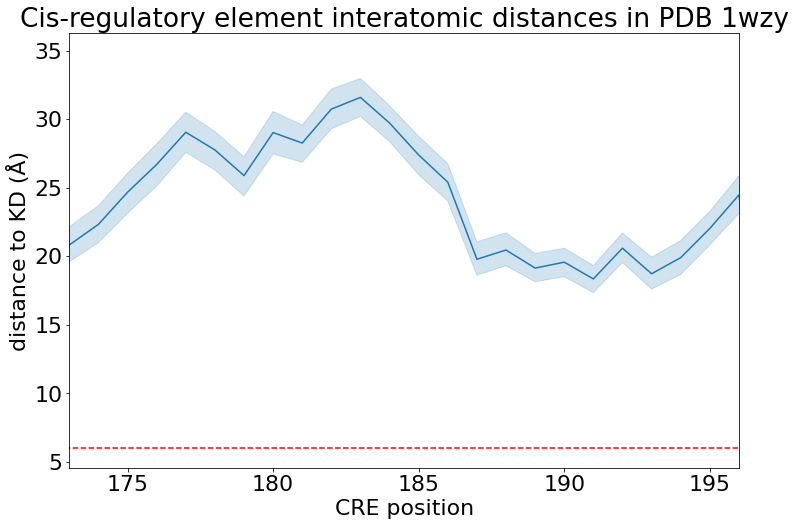

In [8]:
df = pd.read_csv('../datasets/interatomic_distances_both_regions_kd_cre/1wzy.csv')
# # Group the DataFrame by 'pos_a' and find the mean 'dist' value for each group
# mean_dist = df.groupby('pos_a', as_index= False).agg({'dist':['mean','std']}).sort_values(('dist', 'mean'))
# mean_dist.columns = ["pos_a", "dist_mean", "dist_std"]
pdb = '1wzy'

# The CRE residues could be either in pos_a or pos_b col. to chose the correct one, make a comparison
# interv1 in the coordinates of CRE in pdb numbering
interv1 = pd.Interval(to_calculate[to_calculate.pdb == pdb].pdb_start_cre.values[0], to_calculate[to_calculate.pdb == pdb].pdb_end_cre.values[0], closed= 'both')
interv2a = pd.Interval(df.pos_a.min(), df.pos_a.max(), closed= 'both')
interv2b = pd.Interval(df.pos_b.min(), df.pos_b.max(), closed= 'both')

if interv1.overlaps(interv2a) and not interv1.overlaps(interv2b):
    pos_col = 'pos_a'
else:
    pos_col = 'pos_b'

# Plot the distances
plt.figure(figsize= (12,8))
sns.lineplot(data= df, x= pos_col, y= 'dist')
plt.title(f"Cis-regulatory element interatomic distances in PDB {df.pdb.unique()[0]}")
plt.xlabel("CRE position")
plt.ylabel("distance to KD (Å)")
plt.rcParams['font.size'] = 22
plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], linestyles= "--", colors= 'r')
# Adjust the xlim only for CRE residues


plt.xlim(left= to_calculate[to_calculate.pdb == '1wzy'].pdb_start_cre.values[0], right= to_calculate[to_calculate.pdb == '1wzy'].pdb_end_cre.values[0])

plt.show()

In [11]:
pos_col

'pos_b'

In [5]:
df

,chain_a,pos_a,aa_a,atom_a,chain_b,pos_b,aa_b,atom_b,dist,pdb
0,A,25,TYR,OH,A,173,VAL,N,28.400227,1wzy
1,A,25,TYR,OH,A,174,ALA,N,31.084814,1wzy
2,A,25,TYR,OH,A,175,ASP,N,34.293354,1wzy
3,A,25,TYR,OH,A,176,PRO,CD,37.059834,1wzy
4,A,25,TYR,OH,A,177,ASP,N,39.784897,1wzy
...,...,...,...,...,...,...,...,...,...,...
6631,A,196,PRO,CD,A,309,ALA,N,22.062597,1wzy
6632,A,196,PRO,CD,A,310,HIS,CD2,19.293091,1wzy
6633,A,196,PRO,CD,A,311,PRO,CD,23.093094,1wzy
6634,A,196,PRO,CD,A,312,TYR,CD2,20.891708,1wzy


In [19]:
out = df.groupby('pos_a', as_index= False).agg({'dist':['mean','std']}).sort_values(('dist', 'mean'))
out.columns = ["pos_a", "dist_mean", "dist_std"]
out

,pos_a,dist_mean,dist_std
75,105,9.163865,2.403557
72,102,9.907063,3.954499
74,104,9.955607,3.191808
78,108,10.253504,4.538724
79,109,10.705022,2.671370
...,...,...,...
34,64,34.672015,6.662666
59,89,35.100944,8.638904
57,87,35.545813,9.117501
56,86,35.640948,8.502076


In [31]:
df.groupby('pos_a', as_index= False)[['dist']]

AttributeError: 'DataFrameGroupBy' object has no attribute 'values'

In [32]:
data = df[df.pos_a == 105]#.dist.std()
data

,chain_a,pos_a,aa_a,atom_a,chain_b,pos_b,aa_b,atom_b,dist,pdb
2100,A,105,ASP,O,A,285,ASN,OD1,13.109695,1a06
2101,A,105,ASP,O,A,286,ILE,O,12.995134,1a06
2102,A,105,ASP,O,A,287,HIS,NE2,7.122880,1a06
2103,A,105,ASP,O,A,288,GLN,O,12.097218,1a06
2104,A,105,ASP,O,A,289,SER,O,12.845491,1a06
2105,A,105,ASP,N,A,290,VAL,O,9.982044,1a06
2106,A,105,ASP,O,A,291,SER,OG,7.377322,1a06
2107,A,105,ASP,O,A,292,GLU,N,10.499889,1a06
2108,A,105,ASP,N,A,293,GLN,C,10.942652,1a06
2109,A,105,ASP,N,A,294,ILE,CG2,6.114137,1a06


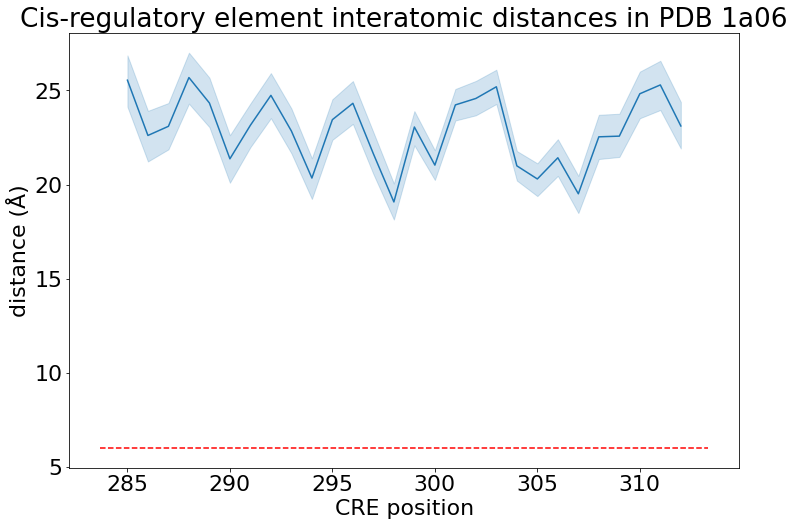

In [58]:
plt.figure(figsize= (12,8))
sns.lineplot(data= df, x='pos_b', y= 'dist')
plt.title(f"Cis-regulatory element interatomic distances in PDB {df.pdb.unique()[0]}")
plt.xlabel("CRE position")
plt.ylabel("distance (Å)")
plt.rcParams['font.size'] = 22
plt.hlines(y= 6, xmin= plt.xlim()[0], xmax= plt.xlim()[1], linestyles= "--", colors= 'r')
plt.show()

In [61]:

msa_regions_pdbs[msa_regions_pdbs.pdb == '1gzk']

,msa,uniprot,start_cre,end_cre,term_id_cre,length_cre,pdb,start_pdb,end_pdb,overlap_cre,start_kd,end_kd,term_id_kd,length_kd,overlap_kd,no_seqs,no_pdbs
552,P31751_60,P31751,17,151,cre73,135,1gzk,146,441,6,152,409,kd73,258,259,73,16


In [66]:

to_calculate[to_calculate.pdb == '1gzk']

,msa,uniprot,pdb,chain,term_id_cre,start_cre,end_cre,term_id_kd,start_kd,end_kd,pdb_start_cre,pdb_end_cre,pdb_start_kd,pdb_end_kd
606,P31751_60,P31751,1gzk,A,cre73,17,151,kd73,152,409,146,151,152,409


In [78]:
pd.Interval(146, 151, closed= 'both').overlaps(pd.Interval(145, 145, closed= 'both'))

False

In [ ]:
pd.Interval(146, 151, closed= 'both')